In [117]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [118]:
desc = pd.read_csv('lending_club_info.csv')
data = pd.read_csv('lending_club_loan_two.csv')

In [119]:
data = data.sample(frac=0.3)

In [120]:
data.shape

(118809, 27)

In [121]:
pwd

'C:\\Users\\mehdi\\OneDrive\\Documents\\Data Science Docs\\DS Projects on GitHub\\Deep_learning\\ANN'

In [122]:
desc

,LoanStatNew,Description
0,loan_amnt,The listed amount of the loan applied for by t...
1,term,The number of payments on the loan. Values are...
2,int_rate,Interest Rate on the loan
3,installment,The monthly payment owed by the borrower if th...
4,grade,LC assigned loan grade
5,sub_grade,LC assigned loan subgrade
6,emp_title,The job title supplied by the Borrower when ap...
7,emp_length,Employment length in years. Possible values ar...
8,home_ownership,The home ownership status provided by the borr...
9,annual_inc,The self-reported annual income provided by th...


In [123]:
data.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
233370,12000.0,36 months,14.30,411.89,C,C1,teacher/child care,10+ years,MORTGAGE,35000.0,...,10.0,0.0,9815.0,58.8,27.0,f,INDIVIDUAL,0.0,0.0,"71371 Hardy Parks Suite 965\nLake Mariatown, O..."
293850,24000.0,36 months,15.88,842.35,C,C4,"Oracle America, Inc.",9 years,RENT,71110.0,...,9.0,0.0,26486.0,77.7,22.0,f,INDIVIDUAL,0.0,0.0,"15392 Dale Skyway Apt. 568\nEast Monique, WV 4..."
55178,13200.0,36 months,18.49,480.47,D,D2,Faerber's Bee Window,< 1 year,RENT,50000.0,...,15.0,0.0,7519.0,67.7,19.0,w,INDIVIDUAL,0.0,0.0,00235 Ross Village Suite 574\nNorth Blakemouth...
32522,6000.0,36 months,9.49,192.17,B,B2,Regional Manager,5 years,MORTGAGE,89000.0,...,6.0,0.0,2882.0,58.8,25.0,w,INDIVIDUAL,6.0,0.0,"64997 Stephanie Unions\nPort Joyceport, SC 70466"
52440,10625.0,36 months,15.31,369.94,C,C2,Compton Unified School District,7 years,RENT,60000.0,...,16.0,0.0,10660.0,56.7,39.0,f,INDIVIDUAL,0.0,0.0,"PSC 8794, Box 3839\nAPO AP 48052"


In [124]:
data.shape

(118809, 27)

In [125]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 118809 entries, 233370 to 177696
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             118809 non-null  float64
 1   term                  118809 non-null  object 
 2   int_rate              118809 non-null  float64
 3   installment           118809 non-null  float64
 4   grade                 118809 non-null  object 
 5   sub_grade             118809 non-null  object 
 6   emp_title             111876 non-null  object 
 7   emp_length            113351 non-null  object 
 8   home_ownership        118809 non-null  object 
 9   annual_inc            118809 non-null  float64
 10  verification_status   118809 non-null  object 
 11  issue_d               118809 non-null  object 
 12  loan_status           118809 non-null  object 
 13  purpose               118809 non-null  object 
 14  title                 118279 non-null  object 


In [126]:
cat_cols = []
num_cols = []
for col in data.columns:
    if data[col].dtype == 'object':
        cat_cols.append(col)
    else:
        num_cols.append(col)

In [127]:
data[cat_cols].head()

,term,grade,sub_grade,emp_title,emp_length,home_ownership,verification_status,issue_d,loan_status,purpose,title,earliest_cr_line,initial_list_status,application_type,address
233370,36 months,C,C1,teacher/child care,10+ years,MORTGAGE,Not Verified,Oct-2013,Fully Paid,debt_consolidation,Debt consolidation,Nov-1994,f,INDIVIDUAL,"71371 Hardy Parks Suite 965\nLake Mariatown, O..."
293850,36 months,C,C4,"Oracle America, Inc.",9 years,RENT,Verified,Aug-2013,Fully Paid,debt_consolidation,Debt consolidation,Jun-1994,f,INDIVIDUAL,"15392 Dale Skyway Apt. 568\nEast Monique, WV 4..."
55178,36 months,D,D2,Faerber's Bee Window,< 1 year,RENT,Source Verified,Jan-2013,Charged Off,debt_consolidation,Credit Repayment,Mar-2006,w,INDIVIDUAL,00235 Ross Village Suite 574\nNorth Blakemouth...
32522,36 months,B,B2,Regional Manager,5 years,MORTGAGE,Not Verified,Nov-2014,Fully Paid,debt_consolidation,Debt consolidation,May-2002,w,INDIVIDUAL,"64997 Stephanie Unions\nPort Joyceport, SC 70466"
52440,36 months,C,C2,Compton Unified School District,7 years,RENT,Not Verified,Jun-2013,Fully Paid,debt_consolidation,Debt consolidation,Nov-1999,f,INDIVIDUAL,"PSC 8794, Box 3839\nAPO AP 48052"


In [128]:
data['issue_d'] = pd.to_datetime(data['issue_d'])
data['earliest_cr_line'] = pd.to_datetime(data['earliest_cr_line'])

In [129]:
data['issue_dx'] = data['issue_d'].dt.year
data['earliest_cr_linex'] = data['earliest_cr_line'].dt.year

data.drop(columns=['issue_d', 'earliest_cr_line'], inplace=True)

In [130]:
cat_cols.remove('issue_d')
cat_cols.append('issue_dx')
cat_cols.remove('earliest_cr_line')
cat_cols.append('earliest_cr_linex')
# cat_cols

In [131]:
data[cat_cols].isna().sum()

term                      0
grade                     0
sub_grade                 0
emp_title              6933
emp_length             5458
home_ownership            0
verification_status       0
loan_status               0
purpose                   0
title                   530
initial_list_status       0
application_type          0
address                   0
issue_dx                  0
earliest_cr_linex         0
dtype: int64

In [132]:
data[cat_cols].nunique()

term                        2
grade                       7
sub_grade                  35
emp_title               62120
emp_length                 11
home_ownership              6
verification_status         3
loan_status                 2
purpose                    14
title                   17251
initial_list_status         2
application_type            3
address                118573
issue_dx                   10
earliest_cr_linex          60
dtype: int64

In [133]:
data.drop(columns=['address', 'emp_title', 'title'], inplace=True)

In [134]:
cat_cols.remove('address')
cat_cols.remove('emp_title')
cat_cols.remove('title')

In [135]:
data['emp_length'].replace(np.nan, 'Unknown', inplace=True)

In [136]:
data['term'].replace({' 36 months': 36, ' 60 months': 60}, inplace=True)

In [137]:
cat_cols.remove('term')
cat_cols.remove('issue_dx')
cat_cols.remove('earliest_cr_linex')

In [138]:
data[cat_cols].nunique()

grade                   7
sub_grade              35
emp_length             12
home_ownership          6
verification_status     3
loan_status             2
purpose                14
initial_list_status     2
application_type        3
dtype: int64

In [139]:
data[num_cols].head()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
233370,12000.0,14.30,411.89,35000.0,29.21,10.0,0.0,9815.0,58.8,27.0,0.0,0.0
293850,24000.0,15.88,842.35,71110.0,25.36,9.0,0.0,26486.0,77.7,22.0,0.0,0.0
55178,13200.0,18.49,480.47,50000.0,21.94,15.0,0.0,7519.0,67.7,19.0,0.0,0.0
32522,6000.0,9.49,192.17,89000.0,8.44,6.0,0.0,2882.0,58.8,25.0,6.0,0.0
52440,10625.0,15.31,369.94,60000.0,16.73,16.0,0.0,10660.0,56.7,39.0,0.0,0.0


In [140]:
data[num_cols].isna().sum()

loan_amnt                   0
int_rate                    0
installment                 0
annual_inc                  0
dti                         0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                 85
total_acc                   0
mort_acc                11281
pub_rec_bankruptcies      154
dtype: int64

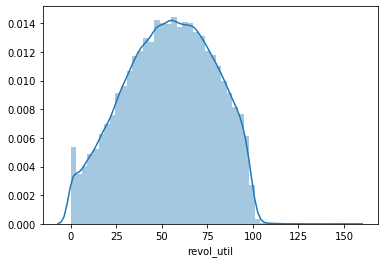

In [141]:
sns.distplot(data['revol_util'])

In [142]:
data['revol_util'].replace(np.nan, data['revol_util'].mode()[0], inplace=True)

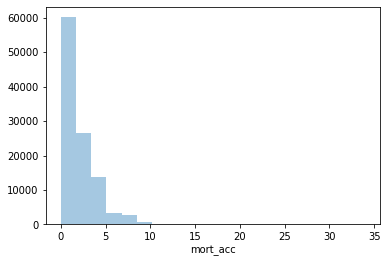

In [143]:
sns.distplot(data['mort_acc'], bins=20, kde=False)

In [144]:
data['mort_acc'].replace(np.nan, data['mort_acc'].mode()[0], inplace=True)

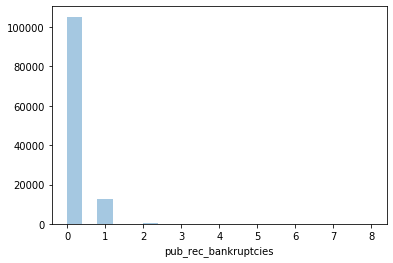

In [145]:
sns.distplot(data['pub_rec_bankruptcies'], bins=20, kde=False)

In [146]:
data['pub_rec_bankruptcies'].replace(np.nan, data['pub_rec_bankruptcies'].mode()[0], inplace=True)

In [147]:
data.shape

(118809, 24)

In [148]:
features = data.drop(columns='loan_status')
labels = data['loan_status'].replace({'Fully Paid': 1, 'Charged Off': 0}).values

cat_cols.remove('loan_status')

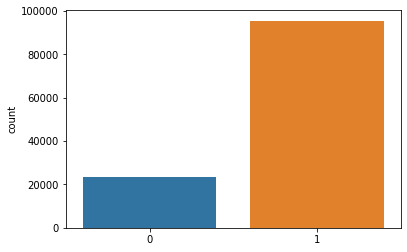

In [149]:
sns.countplot(labels)

In [150]:
ratio = len(labels[labels==0])/len(labels[labels==1])
ratio

0.24359148811455247

In [151]:
features = pd.get_dummies(features, columns=cat_cols, drop_first=True).values

In [152]:
features.shape

(118809, 89)

In [153]:
from sklearn.model_selection import train_test_split

In [154]:
x_train, x_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=55)

In [155]:
from sklearn.preprocessing import MinMaxScaler

In [156]:
scaler = MinMaxScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [157]:
from tensorflow.keras.models import Sequential, save_model, load_model
from tensorflow.keras.layers import Dense, Dropout

In [158]:
model = Sequential()

model.add(Dense(units=89, activation='relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(units=60, activation='relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(units=30, activation='relu'))
model.add(Dropout(rate=0.3))

model.add(Dense(units=1, activation='sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy')

In [159]:
from tensorflow.keras.callbacks import EarlyStopping

In [160]:
stopping = EarlyStopping(patience=20, verbose=1, mode='min')

In [161]:
model.fit(x=x_train,
        y=y_train,
        batch_size=200,
        epochs=200,
        verbose=1,
        callbacks=[stopping],
        validation_data=(x_test, y_test))

Train on 83166 samples, validate on 35643 samples
Epoch 1/200
83166/83166 [==============================] - 2s 23us/sample - loss: 0.4814 - val_loss: 0.4596
Epoch 2/200
83166/83166 [==============================] - 2s 19us/sample - loss: 0.4626 - val_loss: 0.4553
Epoch 3/200
83166/83166 [==============================] - 2s 19us/sample - loss: 0.4590 - val_loss: 0.4542
Epoch 4/200
83166/83166 [==============================] - 2s 18us/sample - loss: 0.4570 - val_loss: 0.4549
Epoch 5/200
83166/83166 [==============================] - 2s 19us/sample - loss: 0.4551 - val_loss: 0.4545
Epoch 6/200
83166/83166 [==============================] - 2s 19us/sample - loss: 0.4538 - val_loss: 0.4540
Epoch 7/200
83166/83166 [==============================] - 2s 18us/sample - loss: 0.4532 - val_loss: 0.4535
Epoch 8/200
83166/83166 [==============================] - 2s 19us/sample - loss: 0.4513 - val_loss: 0.4534
Epoch 9/200
83166/83166 [==============================] - 2s 19us/sample - loss: 0.45

In [162]:
model.evaluate(x_test, y_test)

35643/35643 [==============================] - 1s 27us/sample - loss: 0.4561


0.4561237969308999

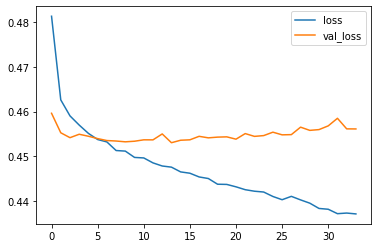

In [163]:
losses = pd.DataFrame(model.history.history)
losses.plot()

In [164]:
predictions = model.predict_classes(x_test)

In [165]:
from sklearn.metrics import f1_score, confusion_matrix, classification_report

In [166]:
print(confusion_matrix(y_test, predictions))

[[  493  6534]
 [  456 28160]]


In [167]:
print(f1_score(y_test, predictions))

0.8895909019112304


In [168]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.52      0.07      0.12      7027
           1       0.81      0.98      0.89     28616

    accuracy                           0.80     35643
   macro avg       0.67      0.53      0.51     35643
weighted avg       0.75      0.80      0.74     35643



# Hyperparameter Tuning Using sklearn wrapper

In [ ]:
dim = x_train.shape[1]

def create_model(n1=20, n2=20, activation='relu', optimizer='adam', rate=0.3, loss='binary_crossentropy'):
    model = Sequential()

    model.add(Dense(units=n1, input_shape=(dim,), activation=activation))
    model.add(Dropout(rate=rate))
#     model.add(Dense(units=n1, input_shape=(dim,), activation=activation, kernel_constraint=maxnorm(weight_constraint)))
#     model.add(Dropout(rate=rate))
    model.add(Dense(units=n2, activation=activation))
    model.add(Dropout(rate=rate))

    model.add(Dense(units=1, activation='sigmoid'))

    model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
    return model

In [ ]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

model = KerasClassifier(build_fn=create_model, verbose=1)

In [ ]:
# hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

batch_size = [20, 50, 100]
epochs = [10, 50, 80]
# validation_data = (x_test, y_test)
optimizer = ['SGD', 'RMSprop', 'Adam', 'Adamax']
activation = ['softplus', 'relu', 'tanh', 'linear']
# weight_constraint = [1, 3, 5]
rate = [0.1, 0.3, 0.5]
n1 = [20, 40, 60]
n2 = [10, 20, 30]

param_grid = dict(batch_size=batch_size,
                  epochs=epochs,
                  optimizer=optimizer,
                  activation=activation,
                  rate=rate,
                  n1=n1,
                  n2=n2)

# grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
tuner = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=2, n_jobs=-1, cv=3)

tuner_result = tuner.fit(x_train, y_train)



# # random sampling from the "param_grid" dictionary with random method
# import random
# params = {key: random.sample(value, 1)[0] for key, value in param_grid.items()}

In [ ]:
# summarize results
print("Best: %f using %s" % (tuner_result.best_score_, tuner_result.best_params_))

means = tuner_result.cv_results_['mean_test_score']
stds = tuner_result.cv_results_['std_test_score']
params = tuner_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Hyperparameter Tuning Using Baysian Optimization

In [169]:
print(x_train.shape)
print('\n')
print(x_test.shape)

(83166, 89)


(35643, 89)


In [170]:
# Define score function to be minimized in Bayesian optimization. 
from sklearn.metrics import roc_auc_score, f1_score

def score(params):
    n = 20 + params['n']
    l = 2 + params['l']
    r = params['r']
    opt = params['opt']
    bs = params['bs']
    epc = params['epc']
    
    model = Sequential()
    
    for i in range(l):
        model.add(Dense(units=n, activation='relu'))
        model.add(Dropout(rate=r))
    
    model.add(Dense(units=1, activation='sigmoid'))
    
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    
    stopping = EarlyStopping(patience=5, verbose=0, mode='min')
    
    model.fit(x=x_train,
            y=y_train,
            batch_size=bs,
            epochs=epc,
            verbose=1,
            callbacks=[stopping],
            validation_data=(x_test, y_test))
    
    predictions = model.predict_classes(x_test)
    auc = -roc_auc_score(y_test, predictions)
    print('AUC:', -auc)
    history.append((params, auc)) 
    
    return {'loss': auc, 'status': STATUS_OK}  

In [171]:
from hyperopt import hp, tpe, Trials, fmin, STATUS_OK

# Define parameter space
# check:   http://hyperopt.github.io/hyperopt/getting-started/search_spaces/#parameter-expressions
space = {
        'l': hp.randint('l', 5),
        'n': hp.randint('n', 80),
        'r': hp.uniform('r', 0.1, 0.3),
        'opt': hp.choice('opt', ['sgd', 'adam', 'rmsprop']),
        'bs': hp.choice('bs', [100, 200]),
        'epc': hp.choice('epc', [50, 100])
        }

In [172]:
# Execute Bayesian optimization.
max_evals = 10
trials = Trials()
history = []

best = fmin(fn=score, space=space, algo=tpe.suggest, trials=trials, max_evals=max_evals)

Train on 83166 samples, validate on 35643 samples                                                                      
Epoch 1/50                                                                                                             
  100/83166 [..............................]                                                                           
 - ETA: 5:23 - loss: 0.7195 - accuracy: 0.2900                                                                         
                                                                                                                      
 1500/83166 [..............................]                                                                           
 - ETA: 24s - loss: 0.7001 - accuracy: 0.4740                                                                          
                                                                                                                       
 2900/83166 [>...........................

28600/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.5486 - accuracy: 0.7816                                                                           
                                                                                                                      
29800/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.5474 - accuracy: 0.7820                                                                           
                                                                                                                      
31000/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.5457 - accuracy: 0.7828                                                                           
                                          

                                                                                                                      
54300/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.5256 - accuracy: 0.7923                                                                           
                                                                                                                      
55400/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.5251 - accuracy: 0.7925                                                                           
                                                                                                                      
56500/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.5244 - accuracy: 0.792

 - ETA: 0s - loss: 0.5145 - accuracy: 0.7975                                                                           
                                                                                                                      
82900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.5140 - accuracy: 0.7977                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 4s 54us/sample - loss: 0.5138 - accuracy: 0.7978 - val_loss: 0.4913 - val_accuracy: 0.8029                          

Epoch 2/50                                                                                                             
  100/83166 [............................

24800/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4930 - accuracy: 0.8053                                                                           
                                                                                                                      
26100/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4922 - accuracy: 0.8059                                                                           
                                                                                                                      
27200/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4911 - accuracy: 0.8066                                                                           
                                          

                                                                                                                      
49600/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4905 - accuracy: 0.8062                                                                           
                                                                                                                      
50500/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4910 - accuracy: 0.8058                                                                           
                                                                                                                      
51400/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4910 - accuracy: 0.805

 - ETA: 0s - loss: 0.4901 - accuracy: 0.8054                                                                           
                                                                                                                      
77000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4904 - accuracy: 0.8051                                                                           
                                                                                                                      
78300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4901 - accuracy: 0.8053                                                                           
                                                                                                                      
79700/83166 [===========================>..

19000/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4820 - accuracy: 0.8071                                                                           
                                                                                                                      
20300/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4822 - accuracy: 0.8069                                                                           
                                                                                                                      
21700/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4827 - accuracy: 0.8067                                                                           
                                          

                                                                                                                      
48300/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4835 - accuracy: 0.8051                                                                           
                                                                                                                      
49600/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4836 - accuracy: 0.8051                                                                           
                                                                                                                      
50800/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4833 - accuracy: 0.805

 - ETA: 0s - loss: 0.4823 - accuracy: 0.8054                                                                           
                                                                                                                      
77100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4826 - accuracy: 0.8052                                                                           
                                                                                                                      
78300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4826 - accuracy: 0.8051                                                                           
                                                                                                                      
79600/83166 [===========================>..

18000/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4824 - accuracy: 0.8027                                                                           
                                                                                                                      
19300/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4824 - accuracy: 0.8025                                                                           
                                                                                                                      
20700/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4831 - accuracy: 0.8015                                                                           
                                          

                                                                                                                      
46800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4798 - accuracy: 0.8038                                                                           
                                                                                                                      
48100/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4798 - accuracy: 0.8040                                                                           
                                                                                                                      
49400/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4793 - accuracy: 0.804

 - ETA: 0s - loss: 0.4779 - accuracy: 0.8048                                                                           
                                                                                                                      
74100/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4777 - accuracy: 0.8049                                                                           
                                                                                                                      
75300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4780 - accuracy: 0.8047                                                                           
                                                                                                                      
76600/83166 [==========================>...

17100/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4835 - accuracy: 0.7990                                                                           
                                                                                                                      
18400/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4847 - accuracy: 0.7982                                                                           
                                                                                                                      
19700/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4846 - accuracy: 0.7982                                                                           
                                          

                                                                                                                      
44700/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4760 - accuracy: 0.8037                                                                           
                                                                                                                      
46000/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4759 - accuracy: 0.8041                                                                           
                                                                                                                      
47400/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4758 - accuracy: 0.804

 - ETA: 0s - loss: 0.4756 - accuracy: 0.8040                                                                           
                                                                                                                      
74800/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4755 - accuracy: 0.8042                                                                           
                                                                                                                      
76100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4754 - accuracy: 0.8042                                                                           
                                                                                                                      
77200/83166 [==========================>...

14800/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4681 - accuracy: 0.8074                                                                           
                                                                                                                      
16000/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4697 - accuracy: 0.8069                                                                           
                                                                                                                      
17300/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4701 - accuracy: 0.8065                                                                           
                                          

                                                                                                                      
42400/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4710 - accuracy: 0.8057                                                                           
                                                                                                                      
43600/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4714 - accuracy: 0.8055                                                                           
                                                                                                                      
45000/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4716 - accuracy: 0.805

 - ETA: 0s - loss: 0.4721 - accuracy: 0.8042                                                                           
                                                                                                                      
70900/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4717 - accuracy: 0.8045                                                                           
                                                                                                                      
72200/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4719 - accuracy: 0.8044                                                                           
                                                                                                                      
73500/83166 [=========================>....

12600/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4664 - accuracy: 0.8079                                                                           
                                                                                                                      
13900/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4654 - accuracy: 0.8089                                                                           
                                                                                                                      
15300/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4681 - accuracy: 0.8067                                                                           
                                          

                                                                                                                      
42000/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4705 - accuracy: 0.8042                                                                           
                                                                                                                      
43300/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4706 - accuracy: 0.8041                                                                           
                                                                                                                      
44500/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4708 - accuracy: 0.804

 - ETA: 0s - loss: 0.4708 - accuracy: 0.8040                                                                           
                                                                                                                      
67300/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4711 - accuracy: 0.8038                                                                           
                                                                                                                      
68400/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4709 - accuracy: 0.8038                                                                           
                                                                                                                      
69500/83166 [========================>.....

 6500/83166 [=>............................]                                                                           
 - ETA: 3s - loss: 0.4695 - accuracy: 0.8055                                                                           
                                                                                                                      
 7600/83166 [=>............................]                                                                           
 - ETA: 3s - loss: 0.4648 - accuracy: 0.8079                                                                           
                                                                                                                      
 8700/83166 [==>...........................]                                                                           
 - ETA: 3s - loss: 0.4666 - accuracy: 0.8074                                                                           
                                          

                                                                                                                      
32000/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4735 - accuracy: 0.8020                                                                           
                                                                                                                      
33100/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4722 - accuracy: 0.8024                                                                           
                                                                                                                      
34200/83166 [===========>..................]                                                                           
 - ETA: 2s - loss: 0.4711 - accuracy: 0.802

 - ETA: 1s - loss: 0.4678 - accuracy: 0.8048                                                                           
                                                                                                                      
55800/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4681 - accuracy: 0.8046                                                                           
                                                                                                                      
56900/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4686 - accuracy: 0.8043                                                                           
                                                                                                                      
57900/83166 [===================>..........

78500/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4686 - accuracy: 0.8043                                                                           
                                                                                                                      
79500/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4690 - accuracy: 0.8040                                                                           
                                                                                                                      
80500/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4689 - accuracy: 0.8041                                                                           
                                          

                                                                                                                      
18100/83166 [=====>........................]                                                                           
 - ETA: 3s - loss: 0.4701 - accuracy: 0.8035                                                                           
                                                                                                                      
19100/83166 [=====>........................]                                                                           
 - ETA: 3s - loss: 0.4688 - accuracy: 0.8039                                                                           
                                                                                                                      
20100/83166 [======>.......................]                                                                           
 - ETA: 3s - loss: 0.4687 - accuracy: 0.804

 - ETA: 2s - loss: 0.4666 - accuracy: 0.8060                                                                           
                                                                                                                      
41400/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4670 - accuracy: 0.8057                                                                           
                                                                                                                      
42300/83166 [==============>...............]                                                                           
 - ETA: 2s - loss: 0.4670 - accuracy: 0.8056                                                                           
                                                                                                                      
43200/83166 [==============>...............

63200/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4690 - accuracy: 0.8046                                                                           
                                                                                                                      
64300/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4691 - accuracy: 0.8044                                                                           
                                                                                                                      
65400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4693 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
 3600/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4630 - accuracy: 0.8050                                                                           
                                                                                                                      
 4800/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4639 - accuracy: 0.8042                                                                           
                                                                                                                      
 5800/83166 [=>............................]                                                                           
 - ETA: 3s - loss: 0.4643 - accuracy: 0.803

 - ETA: 2s - loss: 0.4652 - accuracy: 0.8058                                                                           
                                                                                                                      
28500/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4666 - accuracy: 0.8048                                                                           
                                                                                                                      
29600/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4661 - accuracy: 0.8050                                                                           
                                                                                                                      
30800/83166 [==========>...................

51500/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4647 - accuracy: 0.8060                                                                           
                                                                                                                      
52700/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4655 - accuracy: 0.8055                                                                           
                                                                                                                      
53700/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4652 - accuracy: 0.8055                                                                           
                                          

                                                                                                                      
75900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4664 - accuracy: 0.8048                                                                           
                                                                                                                      
77000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4664 - accuracy: 0.8048                                                                           
                                                                                                                      
78200/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4663 - accuracy: 0.804

 - ETA: 3s - loss: 0.4705 - accuracy: 0.8003                                                                           
                                                                                                                      
16500/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4700 - accuracy: 0.8004                                                                           
                                                                                                                      
17600/83166 [=====>........................]                                                                           
 - ETA: 3s - loss: 0.4712 - accuracy: 0.8001                                                                           
                                                                                                                      
18700/83166 [=====>........................

38700/83166 [============>.................]                                                                           
 - ETA: 2s - loss: 0.4681 - accuracy: 0.8023                                                                           
                                                                                                                      
39700/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4685 - accuracy: 0.8022                                                                           
                                                                                                                      
40800/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4688 - accuracy: 0.8018                                                                           
                                          

                                                                                                                      
64300/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4655 - accuracy: 0.8048                                                                           
                                                                                                                      
65400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4655 - accuracy: 0.8047                                                                           
                                                                                                                      
66500/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4655 - accuracy: 0.804

 - ETA: 3s - loss: 0.4683 - accuracy: 0.8048                                                                           
                                                                                                                      
 3600/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4657 - accuracy: 0.8058                                                                           
                                                                                                                      
 4800/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4708 - accuracy: 0.8027                                                                           
                                                                                                                      
 5900/83166 [=>............................

27900/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4664 - accuracy: 0.8033                                                                           
                                                                                                                      
28900/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4659 - accuracy: 0.8037                                                                           
                                                                                                                      
29900/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4662 - accuracy: 0.8033                                                                           
                                          

                                                                                                                      
51400/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4659 - accuracy: 0.8044                                                                           
                                                                                                                      
52500/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4652 - accuracy: 0.8049                                                                           
                                                                                                                      
53600/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4649 - accuracy: 0.805

 - ETA: 0s - loss: 0.4645 - accuracy: 0.8053                                                                           
                                                                                                                      
75800/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4649 - accuracy: 0.8050                                                                           
                                                                                                                      
76700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4652 - accuracy: 0.8048                                                                           
                                                                                                                      
77600/83166 [==========================>...

14700/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4583 - accuracy: 0.8086                                                                           
                                                                                                                      
15800/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4579 - accuracy: 0.8083                                                                           
                                                                                                                      
17000/83166 [=====>........................]                                                                           
 - ETA: 3s - loss: 0.4602 - accuracy: 0.8071                                                                           
                                          

                                                                                                                      
38400/83166 [============>.................]                                                                           
 - ETA: 2s - loss: 0.4624 - accuracy: 0.8054                                                                           
                                                                                                                      
39400/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4615 - accuracy: 0.8059                                                                           
                                                                                                                      
40500/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4619 - accuracy: 0.805

 - ETA: 0s - loss: 0.4611 - accuracy: 0.8061                                                                           
                                                                                                                      
64000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4607 - accuracy: 0.8062                                                                           
                                                                                                                      
65100/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4604 - accuracy: 0.8065                                                                           
                                                                                                                      
66100/83166 [======================>.......

 2800/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4505 - accuracy: 0.8107                                                                           
                                                                                                                      
 4000/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4447 - accuracy: 0.8158                                                                           
                                                                                                                      
 5400/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4463 - accuracy: 0.8170                                                                           
                                          

                                                                                                                      
29300/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4614 - accuracy: 0.8070                                                                           
                                                                                                                      
30400/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4612 - accuracy: 0.8070                                                                           
                                                                                                                      
31400/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4614 - accuracy: 0.806

 - ETA: 1s - loss: 0.4602 - accuracy: 0.8073                                                                           
                                                                                                                      
54200/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4593 - accuracy: 0.8079                                                                           
                                                                                                                      
55200/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4595 - accuracy: 0.8077                                                                           
                                                                                                                      
56500/83166 [===================>..........

78500/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4621 - accuracy: 0.8051                                                                           
                                                                                                                      
79500/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4621 - accuracy: 0.8051                                                                           
                                                                                                                      
80500/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4620 - accuracy: 0.8051                                                                           
                                          

                                                                                                                      
20100/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4626 - accuracy: 0.8063                                                                           
                                                                                                                      
21200/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4626 - accuracy: 0.8061                                                                           
                                                                                                                      
22500/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4636 - accuracy: 0.805

 - ETA: 1s - loss: 0.4628 - accuracy: 0.8048                                                                           
                                                                                                                      
44800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4621 - accuracy: 0.8051                                                                           
                                                                                                                      
46000/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4619 - accuracy: 0.8054                                                                           
                                                                                                                      
47000/83166 [===============>..............

69900/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4634 - accuracy: 0.8044                                                                           
                                                                                                                      
71000/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4633 - accuracy: 0.8042                                                                           
                                                                                                                      
72100/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4633 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
10800/83166 [==>...........................]                                                                           
 - ETA: 3s - loss: 0.4595 - accuracy: 0.8077                                                                           
                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 3s - loss: 0.4596 - accuracy: 0.8080                                                                           
                                                                                                                      
13100/83166 [===>..........................]                                                                           
 - ETA: 3s - loss: 0.4593 - accuracy: 0.808

 - ETA: 2s - loss: 0.4621 - accuracy: 0.8051                                                                           
                                                                                                                      
35600/83166 [===========>..................]                                                                           
 - ETA: 2s - loss: 0.4625 - accuracy: 0.8047                                                                           
                                                                                                                      
36600/83166 [============>.................]                                                                           
 - ETA: 2s - loss: 0.4627 - accuracy: 0.8044                                                                           
                                                                                                                      
37600/83166 [============>.................

60600/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4620 - accuracy: 0.8048                                                                           
                                                                                                                      
61700/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4621 - accuracy: 0.8048                                                                           
                                                                                                                      
62800/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4619 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
 1400/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4354 - accuracy: 0.8214                                                                           
                                                                                                                      
 2700/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4539 - accuracy: 0.8119                                                                           
                                                                                                                      
 3900/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4505 - accuracy: 0.811

 - ETA: 2s - loss: 0.4596 - accuracy: 0.8058                                                                           
                                                                                                                      
26900/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8058                                                                           
                                                                                                                      
28000/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4593 - accuracy: 0.8057                                                                           
                                                                                                                      
29100/83166 [=========>....................

49800/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4591 - accuracy: 0.8066                                                                           
                                                                                                                      
50900/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4587 - accuracy: 0.8067                                                                           
                                                                                                                      
52000/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4589 - accuracy: 0.8064                                                                           
                                          

                                                                                                                      
76100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4613 - accuracy: 0.8049                                                                           
                                                                                                                      
77100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4614 - accuracy: 0.8049                                                                           
                                                                                                                      
78100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4613 - accuracy: 0.804

 - ETA: 3s - loss: 0.4579 - accuracy: 0.8058                                                                           
                                                                                                                      
15500/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4588 - accuracy: 0.8050                                                                           
                                                                                                                      
16600/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4611 - accuracy: 0.8037                                                                           
                                                                                                                      
17700/83166 [=====>........................

38900/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8056                                                                           
                                                                                                                      
40000/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4587 - accuracy: 0.8060                                                                           
                                                                                                                      
41100/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4586 - accuracy: 0.8060                                                                           
                                          

                                                                                                                      
64600/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4602 - accuracy: 0.8058                                                                           
                                                                                                                      
65700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4604 - accuracy: 0.8056                                                                           
                                                                                                                      
66800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4608 - accuracy: 0.805

 - ETA: 4s - loss: 0.5771 - accuracy: 0.7500                                                                           
                                                                                                                      
 1000/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.4725 - accuracy: 0.7970                                                                           
                                                                                                                      
 1700/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.4713 - accuracy: 0.8024                                                                           
                                                                                                                      
 2300/83166 [..............................

18500/83166 [=====>........................]                                                                           
 - ETA: 4s - loss: 0.4591 - accuracy: 0.8059                                                                           
                                                                                                                      
19300/83166 [=====>........................]                                                                           
 - ETA: 4s - loss: 0.4600 - accuracy: 0.8050                                                                           
                                                                                                                      
20100/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4598 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
38900/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4587 - accuracy: 0.8062                                                                           
                                                                                                                      
39900/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4597 - accuracy: 0.8055                                                                           
                                                                                                                      
40800/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4594 - accuracy: 0.805

 - ETA: 1s - loss: 0.4596 - accuracy: 0.8054                                                                           
                                                                                                                      
60800/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4595 - accuracy: 0.8055                                                                           
                                                                                                                      
61700/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4594 - accuracy: 0.8056                                                                           
                                                                                                                      
62600/83166 [=====================>........

82000/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4605 - accuracy: 0.8049                                                                           
                                                                                                                      
83000/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4605 - accuracy: 0.8048                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 5s 64us/sample - loss: 0.4605 - accuracy: 0.8048 - val_loss: 0.4575 - val_accuracy: 0.8028                          

Epoch 20/50                              

                                                                                                                      
19400/83166 [=====>........................]                                                                           
 - ETA: 3s - loss: 0.4599 - accuracy: 0.8055                                                                           
                                                                                                                      
20300/83166 [======>.......................]                                                                           
 - ETA: 3s - loss: 0.4589 - accuracy: 0.8061                                                                           
                                                                                                                      
21300/83166 [======>.......................]                                                                           
 - ETA: 3s - loss: 0.4588 - accuracy: 0.806

 - ETA: 2s - loss: 0.4609 - accuracy: 0.8039                                                                           
                                                                                                                      
40500/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4612 - accuracy: 0.8036                                                                           
                                                                                                                      
41400/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4608 - accuracy: 0.8040                                                                           
                                                                                                                      
42400/83166 [==============>...............

60300/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4602 - accuracy: 0.8049                                                                           
                                                                                                                      
61300/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4597 - accuracy: 0.8053                                                                           
                                                                                                                      
62300/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4594 - accuracy: 0.8055                                                                           
                                          

                                                                                                                      
79700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8046                                                                           
                                                                                                                      
80700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8046                                                                           
                                                                                                                      
81600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4602 - accuracy: 0.804

 - ETA: 4s - loss: 0.4606 - accuracy: 0.8020                                                                           
                                                                                                                      
14500/83166 [====>.........................]                                                                           
 - ETA: 4s - loss: 0.4617 - accuracy: 0.8011                                                                           
                                                                                                                      
15400/83166 [====>.........................]                                                                           
 - ETA: 4s - loss: 0.4621 - accuracy: 0.8003                                                                           
                                                                                                                      
16200/83166 [====>.........................

32700/83166 [==========>...................]                                                                           
 - ETA: 3s - loss: 0.4604 - accuracy: 0.8030                                                                           
                                                                                                                      
33600/83166 [===========>..................]                                                                           
 - ETA: 3s - loss: 0.4607 - accuracy: 0.8028                                                                           
                                                                                                                      
34500/83166 [===========>..................]                                                                           
 - ETA: 3s - loss: 0.4607 - accuracy: 0.8025                                                                           
                                          

                                                                                                                      
52600/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4585 - accuracy: 0.8045                                                                           
                                                                                                                      
53400/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4585 - accuracy: 0.8044                                                                           
                                                                                                                      
54200/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4579 - accuracy: 0.804

 - ETA: 0s - loss: 0.4590 - accuracy: 0.8044                                                                           
                                                                                                                      
72400/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4591 - accuracy: 0.8044                                                                           
                                                                                                                      
73200/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4592 - accuracy: 0.8044                                                                           
                                                                                                                      
73900/83166 [=========================>....

 6000/83166 [=>............................]                                                                           
 - ETA: 4s - loss: 0.4473 - accuracy: 0.8092                                                                           
                                                                                                                      
 6700/83166 [=>............................]                                                                           
 - ETA: 4s - loss: 0.4475 - accuracy: 0.8097                                                                           
                                                                                                                      
 7400/83166 [=>............................]                                                                           
 - ETA: 4s - loss: 0.4481 - accuracy: 0.8101                                                                           
                                          

                                                                                                                      
23700/83166 [=======>......................]                                                                           
 - ETA: 3s - loss: 0.4517 - accuracy: 0.8091                                                                           
                                                                                                                      
24500/83166 [=======>......................]                                                                           
 - ETA: 3s - loss: 0.4526 - accuracy: 0.8084                                                                           
                                                                                                                      
25300/83166 [========>.....................]                                                                           
 - ETA: 3s - loss: 0.4527 - accuracy: 0.808

 - ETA: 2s - loss: 0.4574 - accuracy: 0.8060                                                                           
                                                                                                                      
41800/83166 [==============>...............]                                                                           
 - ETA: 2s - loss: 0.4569 - accuracy: 0.8062                                                                           
                                                                                                                      
42600/83166 [==============>...............]                                                                           
 - ETA: 2s - loss: 0.4570 - accuracy: 0.8063                                                                           
                                                                                                                      
43400/83166 [==============>...............

58800/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8052                                                                           
                                                                                                                      
59500/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8051                                                                           
                                                                                                                      
60200/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
76900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4590 - accuracy: 0.8044                                                                           
                                                                                                                      
77700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4589 - accuracy: 0.8045                                                                           
                                                                                                                      
78500/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.804

 - ETA: 4s - loss: 0.4485 - accuracy: 0.8115                                                                           
                                                                                                                      
12700/83166 [===>..........................]                                                                           
 - ETA: 4s - loss: 0.4464 - accuracy: 0.8127                                                                           
                                                                                                                      
13600/83166 [===>..........................]                                                                           
 - ETA: 4s - loss: 0.4481 - accuracy: 0.8116                                                                           
                                                                                                                      
14300/83166 [====>.........................

29500/83166 [=========>....................]                                                                           
 - ETA: 3s - loss: 0.4536 - accuracy: 0.8081                                                                           
                                                                                                                      
30300/83166 [=========>....................]                                                                           
 - ETA: 3s - loss: 0.4553 - accuracy: 0.8070                                                                           
                                                                                                                      
31200/83166 [==========>...................]                                                                           
 - ETA: 3s - loss: 0.4552 - accuracy: 0.8070                                                                           
                                          

                                                                                                                      
49100/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4573 - accuracy: 0.8058                                                                           
                                                                                                                      
49900/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4572 - accuracy: 0.8058                                                                           
                                                                                                                      
50500/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4570 - accuracy: 0.805

 - ETA: 1s - loss: 0.4586 - accuracy: 0.8046                                                                           
                                                                                                                      
66200/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8050                                                                           
                                                                                                                      
67000/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8048                                                                           
                                                                                                                      
67800/83166 [=======================>......

  100/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.4345 - accuracy: 0.8200                                                                           
                                                                                                                      
 1000/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.4414 - accuracy: 0.8120                                                                           
                                                                                                                      
 1800/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.4428 - accuracy: 0.8106                                                                           
                                          

                                                                                                                      
19100/83166 [=====>........................]                                                                           
 - ETA: 4s - loss: 0.4589 - accuracy: 0.8037                                                                           
                                                                                                                      
20000/83166 [======>.......................]                                                                           
 - ETA: 3s - loss: 0.4597 - accuracy: 0.8033                                                                           
                                                                                                                      
20800/83166 [======>.......................]                                                                           
 - ETA: 3s - loss: 0.4591 - accuracy: 0.803

 - ETA: 3s - loss: 0.4594 - accuracy: 0.8045                                                                           
                                                                                                                      
36600/83166 [============>.................]                                                                           
 - ETA: 3s - loss: 0.4594 - accuracy: 0.8044                                                                           
                                                                                                                      
37300/83166 [============>.................]                                                                           
 - ETA: 3s - loss: 0.4593 - accuracy: 0.8043                                                                           
                                                                                                                      
38000/83166 [============>.................

53400/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.8053                                                                           
                                                                                                                      
54200/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4586 - accuracy: 0.8051                                                                           
                                                                                                                      
54900/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4592 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
69200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4605 - accuracy: 0.8037                                                                           
                                                                                                                      
69900/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4602 - accuracy: 0.8038                                                                           
                                                                                                                      
70700/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4601 - accuracy: 0.803

 - ETA: 5s - loss: 0.4673 - accuracy: 0.7969                                                                           
                                                                                                                      
 2300/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.4754 - accuracy: 0.7948                                                                           
                                                                                                                      
 3000/83166 [>.............................]                                                                           
 - ETA: 5s - loss: 0.4709 - accuracy: 0.7963                                                                           
                                                                                                                      
 3700/83166 [>.............................

20000/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4539 - accuracy: 0.8061                                                                           
                                                                                                                      
20900/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4527 - accuracy: 0.8072                                                                           
                                                                                                                      
21800/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4531 - accuracy: 0.8075                                                                           
                                          

                                                                                                                      
37000/83166 [============>.................]                                                                           
 - ETA: 3s - loss: 0.4572 - accuracy: 0.8054                                                                           
                                                                                                                      
37800/83166 [============>.................]                                                                           
 - ETA: 3s - loss: 0.4568 - accuracy: 0.8058                                                                           
                                                                                                                      
38500/83166 [============>.................]                                                                           
 - ETA: 3s - loss: 0.4569 - accuracy: 0.805

 - ETA: 2s - loss: 0.4591 - accuracy: 0.8042                                                                           
                                                                                                                      
54800/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4595 - accuracy: 0.8039                                                                           
                                                                                                                      
55600/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4589 - accuracy: 0.8044                                                                           
                                                                                                                      
56500/83166 [===================>..........

72400/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8051                                                                           
                                                                                                                      
73100/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4589 - accuracy: 0.8048                                                                           
                                                                                                                      
73800/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8049                                                                           
                                          

                                                                                                                      
 6300/83166 [=>............................]                                                                           
 - ETA: 4s - loss: 0.4508 - accuracy: 0.8129                                                                           
                                                                                                                      
 7000/83166 [=>............................]                                                                           
 - ETA: 4s - loss: 0.4487 - accuracy: 0.8144                                                                           
                                                                                                                      
 7800/83166 [=>............................]                                                                           
 - ETA: 4s - loss: 0.4508 - accuracy: 0.812

 - ETA: 4s - loss: 0.4614 - accuracy: 0.8038                                                                           
                                                                                                                      
23400/83166 [=======>......................]                                                                           
 - ETA: 4s - loss: 0.4616 - accuracy: 0.8037                                                                           
                                                                                                                      
24100/83166 [=======>......................]                                                                           
 - ETA: 4s - loss: 0.4611 - accuracy: 0.8039                                                                           
                                                                                                                      
24900/83166 [=======>......................

39600/83166 [=============>................]                                                                           
 - ETA: 3s - loss: 0.4600 - accuracy: 0.8031                                                                           
                                                                                                                      
40200/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4604 - accuracy: 0.8028                                                                           
                                                                                                                      
40800/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4601 - accuracy: 0.8030                                                                           
                                          

                                                                                                                      
57200/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4591 - accuracy: 0.8039                                                                           
                                                                                                                      
57900/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4587 - accuracy: 0.8042                                                                           
                                                                                                                      
58600/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4587 - accuracy: 0.804

 - ETA: 0s - loss: 0.4592 - accuracy: 0.8039                                                                           
                                                                                                                      
74700/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4589 - accuracy: 0.8042                                                                           
                                                                                                                      
75500/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4589 - accuracy: 0.8043                                                                           
                                                                                                                      
76200/83166 [==========================>...

 7500/83166 [=>............................]                                                                           
 - ETA: 5s - loss: 0.4576 - accuracy: 0.8069                                                                           
                                                                                                                      
 8300/83166 [=>............................]                                                                           
 - ETA: 5s - loss: 0.4560 - accuracy: 0.8088                                                                           
                                                                                                                      
 9100/83166 [==>...........................]                                                                           
 - ETA: 5s - loss: 0.4585 - accuracy: 0.8064                                                                           
                                          

                                                                                                                      
24700/83166 [=======>......................]                                                                           
 - ETA: 4s - loss: 0.4566 - accuracy: 0.8075                                                                           
                                                                                                                      
25500/83166 [========>.....................]                                                                           
 - ETA: 4s - loss: 0.4565 - accuracy: 0.8075                                                                           
                                                                                                                      
26300/83166 [========>.....................]                                                                           
 - ETA: 3s - loss: 0.4576 - accuracy: 0.806

 - ETA: 2s - loss: 0.4563 - accuracy: 0.8067                                                                           
                                                                                                                      
43800/83166 [==============>...............]                                                                           
 - ETA: 2s - loss: 0.4557 - accuracy: 0.8073                                                                           
                                                                                                                      
44700/83166 [===============>..............]                                                                           
 - ETA: 2s - loss: 0.4557 - accuracy: 0.8073                                                                           
                                                                                                                      
45500/83166 [===============>..............

60900/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4590 - accuracy: 0.8046                                                                           
                                                                                                                      
61700/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4591 - accuracy: 0.8044                                                                           
                                                                                                                      
62500/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4588 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
79600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4583 - accuracy: 0.8047                                                                           
                                                                                                                      
80200/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4583 - accuracy: 0.8046                                                                           
                                                                                                                      
80900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4582 - accuracy: 0.804

 - ETA: 4s - loss: 0.4511 - accuracy: 0.8085                                                                           
                                                                                                                      
13800/83166 [===>..........................]                                                                           
 - ETA: 4s - loss: 0.4509 - accuracy: 0.8086                                                                           
                                                                                                                      
14700/83166 [====>.........................]                                                                           
 - ETA: 4s - loss: 0.4515 - accuracy: 0.8082                                                                           
                                                                                                                      
15500/83166 [====>.........................

31100/83166 [==========>...................]                                                                           
 - ETA: 3s - loss: 0.4552 - accuracy: 0.8063                                                                           
                                                                                                                      
31800/83166 [==========>...................]                                                                           
 - ETA: 3s - loss: 0.4554 - accuracy: 0.8064                                                                           
                                                                                                                      
32500/83166 [==========>...................]                                                                           
 - ETA: 3s - loss: 0.4549 - accuracy: 0.8068                                                                           
                                          

                                                                                                                      
49700/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4566 - accuracy: 0.8050                                                                           
                                                                                                                      
50600/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4568 - accuracy: 0.8049                                                                           
                                                                                                                      
51400/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4569 - accuracy: 0.804

 - ETA: 1s - loss: 0.4586 - accuracy: 0.8040                                                                           
                                                                                                                      
67900/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4587 - accuracy: 0.8039                                                                           
                                                                                                                      
68700/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4589 - accuracy: 0.8038                                                                           
                                                                                                                      
69500/83166 [========================>.....

 1600/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.4569 - accuracy: 0.8131                                                                           
                                                                                                                      
 2400/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.4611 - accuracy: 0.8033                                                                           
                                                                                                                      
 3200/83166 [>.............................]                                                                           
 - ETA: 5s - loss: 0.4610 - accuracy: 0.8006                                                                           
                                          

                                                                                                                      
20000/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4595 - accuracy: 0.8033                                                                           
                                                                                                                      
20800/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4590 - accuracy: 0.8034                                                                           
                                                                                                                      
21700/83166 [======>.......................]                                                                           
 - ETA: 3s - loss: 0.4588 - accuracy: 0.803

 - ETA: 2s - loss: 0.4586 - accuracy: 0.8038                                                                           
                                                                                                                      
38800/83166 [============>.................]                                                                           
 - ETA: 2s - loss: 0.4583 - accuracy: 0.8039                                                                           
                                                                                                                      
39600/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4580 - accuracy: 0.8038                                                                           
                                                                                                                      
40400/83166 [=============>................

56700/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.8036                                                                           
                                                                                                                      
57600/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4588 - accuracy: 0.8034                                                                           
                                                                                                                      
58400/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4585 - accuracy: 0.8035                                                                           
                                          

                                                                                                                      
75600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4572 - accuracy: 0.8044                                                                           
                                                                                                                      
76300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8046                                                                           
                                                                                                                      
77100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.804

 - ETA: 4s - loss: 0.4555 - accuracy: 0.8075                                                                           
                                                                                                                      
10300/83166 [==>...........................]                                                                           
 - ETA: 4s - loss: 0.4548 - accuracy: 0.8080                                                                           
                                                                                                                      
11100/83166 [===>..........................]                                                                           
 - ETA: 4s - loss: 0.4560 - accuracy: 0.8069                                                                           
                                                                                                                      
11900/83166 [===>..........................

26700/83166 [========>.....................]                                                                           
 - ETA: 3s - loss: 0.4585 - accuracy: 0.8034                                                                           
                                                                                                                      
27500/83166 [========>.....................]                                                                           
 - ETA: 3s - loss: 0.4590 - accuracy: 0.8029                                                                           
                                                                                                                      
28200/83166 [=========>....................]                                                                           
 - ETA: 3s - loss: 0.4590 - accuracy: 0.8030                                                                           
                                          

                                                                                                                      
40900/83166 [=============>................]                                                                           
 - ETA: 3s - loss: 0.4585 - accuracy: 0.8026                                                                           
                                                                                                                      
41300/83166 [=============>................]                                                                           
 - ETA: 3s - loss: 0.4584 - accuracy: 0.8027                                                                           
                                                                                                                      
41800/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4580 - accuracy: 0.803

 - ETA: 2s - loss: 0.4598 - accuracy: 0.8020                                                                           
                                                                                                                      
52300/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4594 - accuracy: 0.8023                                                                           
                                                                                                                      
52900/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4592 - accuracy: 0.8024                                                                           
                                                                                                                      
53500/83166 [==================>...........

67500/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8046                                                                           
                                                                                                                      
68200/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4570 - accuracy: 0.8045                                                                           
                                                                                                                      
69000/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8044                                                                           
                                          

Epoch 31/50                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.5080 - accuracy: 0.7800                                                                           
                                                                                                                      
 1000/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.4783 - accuracy: 0.7950                                                                           
                                                                                                                      
 1900/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.4573 - accuracy: 0.80

 - ETA: 5s - loss: 0.4608 - accuracy: 0.8018                                                                           
                                                                                                                      
15100/83166 [====>.........................]                                                                           
 - ETA: 5s - loss: 0.4612 - accuracy: 0.8017                                                                           
                                                                                                                      
15500/83166 [====>.........................]                                                                           
 - ETA: 5s - loss: 0.4611 - accuracy: 0.8019                                                                           
                                                                                                                      
16000/83166 [====>.........................

24900/83166 [=======>......................]                                                                           
 - ETA: 5s - loss: 0.4574 - accuracy: 0.8038                                                                           
                                                                                                                      
25400/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4577 - accuracy: 0.8037                                                                           
                                                                                                                      
25700/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4579 - accuracy: 0.8034                                                                           
                                          

                                                                                                                      
36100/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4560 - accuracy: 0.8052                                                                           
                                                                                                                      
36600/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4561 - accuracy: 0.8051                                                                           
                                                                                                                      
37100/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4556 - accuracy: 0.805

 - ETA: 3s - loss: 0.4570 - accuracy: 0.8047                                                                           
                                                                                                                      
50500/83166 [=================>............]                                                                           
 - ETA: 3s - loss: 0.4577 - accuracy: 0.8043                                                                           
                                                                                                                      
51200/83166 [=================>............]                                                                           
 - ETA: 3s - loss: 0.4580 - accuracy: 0.8041                                                                           
                                                                                                                      
51900/83166 [=================>............

66000/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8035                                                                           
                                                                                                                      
66800/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8036                                                                           
                                                                                                                      
67600/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8035                                                                           
                                          

                                                                                                                      
83166/83166 [==============================]                                                                           
 - 8s 94us/sample - loss: 0.4570 - accuracy: 0.8048 - val_loss: 0.4558 - val_accuracy: 0.8031                          

Epoch 32/50                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 6s - loss: 0.5358 - accuracy: 0.7500                                                                           
                                                                                                                      
  700/83166 [..............................]                                                                           
 - ETA: 7s - loss: 0.4631 - accuracy: 0.7

 - ETA: 4s - loss: 0.4531 - accuracy: 0.8062                                                                           
                                                                                                                      
15900/83166 [====>.........................]                                                                           
 - ETA: 4s - loss: 0.4533 - accuracy: 0.8058                                                                           
                                                                                                                      
16700/83166 [=====>........................]                                                                           
 - ETA: 4s - loss: 0.4534 - accuracy: 0.8057                                                                           
                                                                                                                      
17500/83166 [=====>........................

33000/83166 [==========>...................]                                                                           
 - ETA: 3s - loss: 0.4537 - accuracy: 0.8070                                                                           
                                                                                                                      
33600/83166 [===========>..................]                                                                           
 - ETA: 3s - loss: 0.4543 - accuracy: 0.8066                                                                           
                                                                                                                      
34300/83166 [===========>..................]                                                                           
 - ETA: 3s - loss: 0.4544 - accuracy: 0.8066                                                                           
                                          

                                                                                                                      
48000/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4556 - accuracy: 0.8053                                                                           
                                                                                                                      
48600/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4554 - accuracy: 0.8056                                                                           
                                                                                                                      
49200/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4566 - accuracy: 0.804

 - ETA: 1s - loss: 0.4575 - accuracy: 0.8046                                                                           
                                                                                                                      
62100/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.8043                                                                           
                                                                                                                      
62700/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.8043                                                                           
                                                                                                                      
63300/83166 [=====================>........

77300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4575 - accuracy: 0.8043                                                                           
                                                                                                                      
78000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4575 - accuracy: 0.8044                                                                           
                                                                                                                      
78600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4576 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 4s - loss: 0.4532 - accuracy: 0.8073                                                                           
                                                                                                                      
12900/83166 [===>..........................]                                                                           
 - ETA: 3s - loss: 0.4544 - accuracy: 0.8060                                                                           
                                                                                                                      
13700/83166 [===>..........................]                                                                           
 - ETA: 3s - loss: 0.4551 - accuracy: 0.805

 - ETA: 2s - loss: 0.4571 - accuracy: 0.8036                                                                           
                                                                                                                      
32300/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4574 - accuracy: 0.8036                                                                           
                                                                                                                      
33100/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4572 - accuracy: 0.8036                                                                           
                                                                                                                      
33900/83166 [===========>..................

49500/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4576 - accuracy: 0.8040                                                                           
                                                                                                                      
50400/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4575 - accuracy: 0.8042                                                                           
                                                                                                                      
51300/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4577 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
70300/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4568 - accuracy: 0.8047                                                                           
                                                                                                                      
71100/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8047                                                                           
                                                                                                                      
71900/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4568 - accuracy: 0.804

 - ETA: 3s - loss: 0.4568 - accuracy: 0.8046                                                                           
                                                                                                                      
 7300/83166 [=>............................]                                                                           
 - ETA: 3s - loss: 0.4590 - accuracy: 0.8040                                                                           
                                                                                                                      
 8200/83166 [=>............................]                                                                           
 - ETA: 3s - loss: 0.4618 - accuracy: 0.8021                                                                           
                                                                                                                      
 9200/83166 [==>...........................

28400/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8045                                                                           
                                                                                                                      
29400/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4584 - accuracy: 0.8051                                                                           
                                                                                                                      
30500/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4584 - accuracy: 0.8051                                                                           
                                          

                                                                                                                      
51200/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4561 - accuracy: 0.8047                                                                           
                                                                                                                      
52000/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4560 - accuracy: 0.8049                                                                           
                                                                                                                      
52800/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4564 - accuracy: 0.804

 - ETA: 0s - loss: 0.4560 - accuracy: 0.8046                                                                           
                                                                                                                      
68100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4562 - accuracy: 0.8045                                                                           
                                                                                                                      
68800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4563 - accuracy: 0.8045                                                                           
                                                                                                                      
69500/83166 [========================>.....

 2000/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.4498 - accuracy: 0.8105                                                                           
                                                                                                                      
 2800/83166 [>.............................]                                                                           
 - ETA: 4s - loss: 0.4415 - accuracy: 0.8164                                                                           
                                                                                                                      
 3400/83166 [>.............................]                                                                           
 - ETA: 5s - loss: 0.4350 - accuracy: 0.8188                                                                           
                                          

                                                                                                                      
21200/83166 [======>.......................]                                                                           
 - ETA: 3s - loss: 0.4551 - accuracy: 0.8065                                                                           
                                                                                                                      
22200/83166 [=======>......................]                                                                           
 - ETA: 3s - loss: 0.4549 - accuracy: 0.8063                                                                           
                                                                                                                      
23100/83166 [=======>......................]                                                                           
 - ETA: 3s - loss: 0.4562 - accuracy: 0.805

 - ETA: 2s - loss: 0.4584 - accuracy: 0.8030                                                                           
                                                                                                                      
40400/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4586 - accuracy: 0.8028                                                                           
                                                                                                                      
41100/83166 [=============>................]                                                                           
 - ETA: 2s - loss: 0.4587 - accuracy: 0.8028                                                                           
                                                                                                                      
41800/83166 [==============>...............

59600/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4591 - accuracy: 0.8029                                                                           
                                                                                                                      
60400/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4591 - accuracy: 0.8029                                                                           
                                                                                                                      
61200/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4585 - accuracy: 0.8033                                                                           
                                          

                                                                                                                      
79700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4568 - accuracy: 0.8045                                                                           
                                                                                                                      
80700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8044                                                                           
                                                                                                                      
81700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4567 - accuracy: 0.804

 - ETA: 3s - loss: 0.4556 - accuracy: 0.8067                                                                           
                                                                                                                      
19100/83166 [=====>........................]                                                                           
 - ETA: 3s - loss: 0.4561 - accuracy: 0.8061                                                                           
                                                                                                                      
20100/83166 [======>.......................]                                                                           
 - ETA: 3s - loss: 0.4556 - accuracy: 0.8060                                                                           
                                                                                                                      
21100/83166 [======>.......................

43200/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4534 - accuracy: 0.8079                                                                           
                                                                                                                      
44400/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4545 - accuracy: 0.8074                                                                           
                                                                                                                      
45500/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4546 - accuracy: 0.8072                                                                           
                                          

                                                                                                                      
64300/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8054                                                                           
                                                                                                                      
65300/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4555 - accuracy: 0.8056                                                                           
                                                                                                                      
66400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4554 - accuracy: 0.805

 - ETA: 2s - loss: 0.4528 - accuracy: 0.8080                                                                           
                                                                                                                      
 7900/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4515 - accuracy: 0.8082                                                                           
                                                                                                                      
 9200/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4515 - accuracy: 0.8072                                                                           
                                                                                                                      
10500/83166 [==>...........................

35200/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4548 - accuracy: 0.8063                                                                           
                                                                                                                      
36400/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4547 - accuracy: 0.8063                                                                           
                                                                                                                      
37700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4556 - accuracy: 0.8057                                                                           
                                          

                                                                                                                      
63500/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4566 - accuracy: 0.8057                                                                           
                                                                                                                      
64600/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4567 - accuracy: 0.8054                                                                           
                                                                                                                      
65700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4568 - accuracy: 0.805

 - ETA: 3s - loss: 0.4554 - accuracy: 0.8073                                                                           
                                                                                                                      
 5900/83166 [=>............................]                                                                           
 - ETA: 3s - loss: 0.4502 - accuracy: 0.8100                                                                           
                                                                                                                      
 7000/83166 [=>............................]                                                                           
 - ETA: 3s - loss: 0.4524 - accuracy: 0.8083                                                                           
                                                                                                                      
 8200/83166 [=>............................

29900/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4558 - accuracy: 0.8067                                                                           
                                                                                                                      
31000/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4562 - accuracy: 0.8061                                                                           
                                                                                                                      
32200/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4565 - accuracy: 0.8058                                                                           
                                          

                                                                                                                      
57800/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4568 - accuracy: 0.8060                                                                           
                                                                                                                      
58900/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4560 - accuracy: 0.8066                                                                           
                                                                                                                      
60000/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4566 - accuracy: 0.806

 - ETA: 0s - loss: 0.4560 - accuracy: 0.8055                                                                           
                                                                                                                      
82800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4562 - accuracy: 0.8053                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 4s 52us/sample - loss: 0.4561 - accuracy: 0.8053 - val_loss: 0.4552 - val_accuracy: 0.8038                          

Epoch 39/50                                                                                                            
  100/83166 [............................

21900/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4585 - accuracy: 0.8021                                                                           
                                                                                                                      
23000/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4592 - accuracy: 0.8012                                                                           
                                                                                                                      
24000/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8015                                                                           
                                          

                                                                                                                      
46300/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8040                                                                           
                                                                                                                      
47400/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4565 - accuracy: 0.8039                                                                           
                                                                                                                      
48500/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4569 - accuracy: 0.803

 - ETA: 0s - loss: 0.4555 - accuracy: 0.8049                                                                           
                                                                                                                      
72300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4554 - accuracy: 0.8049                                                                           
                                                                                                                      
73200/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4556 - accuracy: 0.8048                                                                           
                                                                                                                      
74200/83166 [=========================>....

11900/83166 [===>..........................]                                                                           
 - ETA: 3s - loss: 0.4544 - accuracy: 0.8034                                                                           
                                                                                                                      
13100/83166 [===>..........................]                                                                           
 - ETA: 3s - loss: 0.4552 - accuracy: 0.8025                                                                           
                                                                                                                      
14100/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4565 - accuracy: 0.8019                                                                           
                                          

                                                                                                                      
36600/83166 [============>.................]                                                                           
 - ETA: 2s - loss: 0.4538 - accuracy: 0.8048                                                                           
                                                                                                                      
37700/83166 [============>.................]                                                                           
 - ETA: 2s - loss: 0.4543 - accuracy: 0.8047                                                                           
                                                                                                                      
38800/83166 [============>.................]                                                                           
 - ETA: 2s - loss: 0.4545 - accuracy: 0.804

 - ETA: 1s - loss: 0.4563 - accuracy: 0.8044                                                                           
                                                                                                                      
61800/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4562 - accuracy: 0.8043                                                                           
                                                                                                                      
63000/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4562 - accuracy: 0.8044                                                                           
                                                                                                                      
64200/83166 [======================>.......

 2500/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4624 - accuracy: 0.7988                                                                           
                                                                                                                      
 3700/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4634 - accuracy: 0.7978                                                                           
                                                                                                                      
 4900/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4655 - accuracy: 0.7959                                                                           
                                          

                                                                                                                      
28600/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4545 - accuracy: 0.8043                                                                           
                                                                                                                      
29500/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4557 - accuracy: 0.8036                                                                           
                                                                                                                      
30500/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4559 - accuracy: 0.803

 - ETA: 1s - loss: 0.4552 - accuracy: 0.8043                                                                           
                                                                                                                      
53300/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4554 - accuracy: 0.8043                                                                           
                                                                                                                      
54300/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4551 - accuracy: 0.8046                                                                           
                                                                                                                      
55300/83166 [==================>...........

76600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4558 - accuracy: 0.8049                                                                           
                                                                                                                      
77700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8050                                                                           
                                                                                                                      
78800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8051                                                                           
                                          

                                                                                                                      
19000/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4466 - accuracy: 0.8114                                                                           
                                                                                                                      
20100/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4473 - accuracy: 0.8111                                                                           
                                                                                                                      
21300/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4485 - accuracy: 0.810

 - ETA: 1s - loss: 0.4492 - accuracy: 0.8092                                                                           
                                                                                                                      
44700/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4495 - accuracy: 0.8093                                                                           
                                                                                                                      
45800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4494 - accuracy: 0.8092                                                                           
                                                                                                                      
46900/83166 [===============>..............

70300/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4528 - accuracy: 0.8066                                                                           
                                                                                                                      
71400/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4531 - accuracy: 0.8065                                                                           
                                                                                                                      
72500/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4528 - accuracy: 0.8066                                                                           
                                          

                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 3s - loss: 0.4573 - accuracy: 0.8022                                                                           
                                                                                                                      
13200/83166 [===>..........................]                                                                           
 - ETA: 3s - loss: 0.4570 - accuracy: 0.8021                                                                           
                                                                                                                      
14400/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4567 - accuracy: 0.802

 - ETA: 2s - loss: 0.4568 - accuracy: 0.8039                                                                           
                                                                                                                      
37600/83166 [============>.................]                                                                           
 - ETA: 2s - loss: 0.4567 - accuracy: 0.8039                                                                           
                                                                                                                      
38600/83166 [============>.................]                                                                           
 - ETA: 2s - loss: 0.4568 - accuracy: 0.8038                                                                           
                                                                                                                      
39700/83166 [=============>................

62600/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4573 - accuracy: 0.8036                                                                           
                                                                                                                      
63800/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4574 - accuracy: 0.8037                                                                           
                                                                                                                      
65000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4575 - accuracy: 0.8037                                                                           
                                          

                                                                                                                      
 4000/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4530 - accuracy: 0.8048                                                                           
                                                                                                                      
 5200/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4481 - accuracy: 0.8087                                                                           
                                                                                                                      
 6400/83166 [=>............................]                                                                           
 - ETA: 3s - loss: 0.4464 - accuracy: 0.808

 - ETA: 2s - loss: 0.4552 - accuracy: 0.8035                                                                           
                                                                                                                      
30600/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4558 - accuracy: 0.8032                                                                           
                                                                                                                      
31600/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4554 - accuracy: 0.8034                                                                           
                                                                                                                      
32500/83166 [==========>...................

55100/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4559 - accuracy: 0.8041                                                                           
                                                                                                                      
56200/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8037                                                                           
                                                                                                                      
57400/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4556 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
81200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.8045                                                                           
                                                                                                                      
82200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8045                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 4s 51us/sample - loss: 0.4553 - accuracy

 - ETA: 2s - loss: 0.4595 - accuracy: 0.8014                                                                           
                                                                                                                      
23200/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4583 - accuracy: 0.8020                                                                           
                                                                                                                      
24300/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4586 - accuracy: 0.8018                                                                           
                                                                                                                      
25400/83166 [========>.....................

47600/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4545 - accuracy: 0.8042                                                                           
                                                                                                                      
48700/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4547 - accuracy: 0.8042                                                                           
                                                                                                                      
49700/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4551 - accuracy: 0.8040                                                                           
                                          

                                                                                                                      
73700/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4554 - accuracy: 0.8043                                                                           
                                                                                                                      
74800/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8045                                                                           
                                                                                                                      
75900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4554 - accuracy: 0.804

 - ETA: 3s - loss: 0.4606 - accuracy: 0.8044                                                                           
                                                                                                                      
15400/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4598 - accuracy: 0.8043                                                                           
                                                                                                                      
16500/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4617 - accuracy: 0.8024                                                                           
                                                                                                                      
17600/83166 [=====>........................

40000/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4551 - accuracy: 0.8063                                                                           
                                                                                                                      
41200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4547 - accuracy: 0.8064                                                                           
                                                                                                                      
42300/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4551 - accuracy: 0.8061                                                                           
                                          

                                                                                                                      
66000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4556 - accuracy: 0.8051                                                                           
                                                                                                                      
67100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8053                                                                           
                                                                                                                      
68200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4554 - accuracy: 0.805

 - ETA: 3s - loss: 0.4460 - accuracy: 0.8084                                                                           
                                                                                                                      
 8600/83166 [==>...........................]                                                                           
 - ETA: 3s - loss: 0.4475 - accuracy: 0.8084                                                                           
                                                                                                                      
 9700/83166 [==>...........................]                                                                           
 - ETA: 3s - loss: 0.4467 - accuracy: 0.8095                                                                           
                                                                                                                      
10900/83166 [==>...........................

34300/83166 [===========>..................]                                                                           
 - ETA: 2s - loss: 0.4540 - accuracy: 0.8052                                                                           
                                                                                                                      
35400/83166 [===========>..................]                                                                           
 - ETA: 2s - loss: 0.4545 - accuracy: 0.8051                                                                           
                                                                                                                      
36500/83166 [============>.................]                                                                           
 - ETA: 2s - loss: 0.4544 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
60200/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4556 - accuracy: 0.8052                                                                           
                                                                                                                      
61400/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8051                                                                           
                                                                                                                      
62500/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4563 - accuracy: 0.804

 - ETA: 3s - loss: 0.4412 - accuracy: 0.8125                                                                           
                                                                                                                      
 2300/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4416 - accuracy: 0.8096                                                                           
                                                                                                                      
 3400/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4511 - accuracy: 0.8056                                                                           
                                                                                                                      
 4500/83166 [>.............................

27400/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4493 - accuracy: 0.8078                                                                           
                                                                                                                      
28500/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4501 - accuracy: 0.8074                                                                           
                                                                                                                      
29600/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4495 - accuracy: 0.8077                                                                           
                                          

                                                                                                                      
53000/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4532 - accuracy: 0.8059                                                                           
                                                                                                                      
54200/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4529 - accuracy: 0.8061                                                                           
                                                                                                                      
55300/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4532 - accuracy: 0.805

 - ETA: 0s - loss: 0.4540 - accuracy: 0.8054                                                                           
                                                                                                                      
79700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4542 - accuracy: 0.8052                                                                           
                                                                                                                      
80900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4543 - accuracy: 0.8052                                                                           
                                                                                                                      
82100/83166 [============================>.

20700/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4553 - accuracy: 0.8040                                                                           
                                                                                                                      
21800/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4521 - accuracy: 0.8059                                                                           
                                                                                                                      
22800/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4528 - accuracy: 0.8060                                                                           
                                          

                                                                                                                      
46700/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8040                                                                           
                                                                                                                      
47900/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4566 - accuracy: 0.8039                                                                           
                                                                                                                      
48900/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4564 - accuracy: 0.803

 - ETA: 0s - loss: 0.4558 - accuracy: 0.8045                                                                           
                                                                                                                      
73400/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8045                                                                           
                                                                                                                      
74600/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4556 - accuracy: 0.8046                                                                           
                                                                                                                      
75800/83166 [==========================>...

13700/83166 [===>..........................]                                                                           
 - ETA: 3s - loss: 0.4598 - accuracy: 0.8001                                                                           
                                                                                                                      
14800/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4595 - accuracy: 0.8003                                                                           
                                                                                                                      
15900/83166 [====>.........................]                                                                           
 - ETA: 3s - loss: 0.4603 - accuracy: 0.7992                                                                           
                                          

                                                                                                                      
40200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4538 - accuracy: 0.8039                                                                           
                                                                                                                      
41300/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4533 - accuracy: 0.8044                                                                           
                                                                                                                      
42400/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4542 - accuracy: 0.804

 - ETA: 0s - loss: 0.4539 - accuracy: 0.8051                                                                           
                                                                                                                      
63500/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.8051                                                                           
                                                                                                                      
64700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4544 - accuracy: 0.8047                                                                           
                                                                                                                      
65900/83166 [======================>.......

 7200/83166 [=>............................]                                                                           
 - ETA: 8s - loss: 0.5188 - accuracy: 0.7932                                                                           
                                                                                                                      
 9600/83166 [==>...........................]                                                                           
 - ETA: 6s - loss: 0.5104 - accuracy: 0.7960                                                                           
                                                                                                                      
11800/83166 [===>..........................]                                                                           
 - ETA: 5s - loss: 0.5083 - accuracy: 0.7963                                                                           
                                          

                                                                                                                      
50600/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4793 - accuracy: 0.8025                                                                           
                                                                                                                      
52400/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4789 - accuracy: 0.8027                                                                           
                                                                                                                      
54200/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4788 - accuracy: 0.802

 - ETA: 2s - loss: 0.4624 - accuracy: 0.8018                                                                           
                                                                                                                      
 7400/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4581 - accuracy: 0.8045                                                                           
                                                                                                                      
 9200/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4569 - accuracy: 0.8053                                                                           
                                                                                                                      
11000/83166 [==>...........................

46800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4589 - accuracy: 0.8056                                                                           
                                                                                                                      
48600/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4589 - accuracy: 0.8056                                                                           
                                                                                                                      
50600/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8057                                                                           
                                          

                                                                                                                      
 3600/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4572 - accuracy: 0.8103                                                                           
                                                                                                                      
 5200/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8083                                                                           
                                                                                                                      
 6800/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4601 - accuracy: 0.806

 - ETA: 1s - loss: 0.4582 - accuracy: 0.8066                                                                           
                                                                                                                      
39600/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4590 - accuracy: 0.8062                                                                           
                                                                                                                      
41200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4592 - accuracy: 0.8063                                                                           
                                                                                                                      
42800/83166 [==============>...............

77600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4582 - accuracy: 0.8052                                                                           
                                                                                                                      
79600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8050                                                                           
                                                                                                                      
81400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8049                                                                           
                                          

                                                                                                                      
34800/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8057                                                                           
                                                                                                                      
36400/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.8055                                                                           
                                                                                                                      
38000/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.806

 - ETA: 0s - loss: 0.4567 - accuracy: 0.8056                                                                           
                                                                                                                      
77000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4568 - accuracy: 0.8055                                                                           
                                                                                                                      
78800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4569 - accuracy: 0.8055                                                                           
                                                                                                                      
80600/83166 [============================>.

31600/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4570 - accuracy: 0.8047                                                                           
                                                                                                                      
33400/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8040                                                                           
                                                                                                                      
35200/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4575 - accuracy: 0.8049                                                                           
                                          

                                                                                                                      
73600/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4553 - accuracy: 0.8059                                                                           
                                                                                                                      
75600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8060                                                                           
                                                                                                                      
77200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.806

 - ETA: 1s - loss: 0.4511 - accuracy: 0.8078                                                                           
                                                                                                                      
29200/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4510 - accuracy: 0.8084                                                                           
                                                                                                                      
30800/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4523 - accuracy: 0.8079                                                                           
                                                                                                                      
32600/83166 [==========>...................

68600/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4541 - accuracy: 0.8068                                                                           
                                                                                                                      
70400/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4540 - accuracy: 0.8069                                                                           
                                                                                                                      
72200/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4539 - accuracy: 0.8069                                                                           
                                          

                                                                                                                      
25400/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4569 - accuracy: 0.8010                                                                           
                                                                                                                      
27400/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4568 - accuracy: 0.8011                                                                           
                                                                                                                      
29200/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4568 - accuracy: 0.801

 - ETA: 0s - loss: 0.4560 - accuracy: 0.8041                                                                           
                                                                                                                      
67400/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4559 - accuracy: 0.8040                                                                           
                                                                                                                      
69000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4560 - accuracy: 0.8039                                                                           
                                                                                                                      
70800/83166 [========================>.....

23200/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4540 - accuracy: 0.8066                                                                           
                                                                                                                      
25000/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4537 - accuracy: 0.8067                                                                           
                                                                                                                      
27000/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4541 - accuracy: 0.8063                                                                           
                                          

                                                                                                                      
66400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4526 - accuracy: 0.8076                                                                           
                                                                                                                      
68400/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4526 - accuracy: 0.8075                                                                           
                                                                                                                      
70600/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4524 - accuracy: 0.807

 - ETA: 2s - loss: 0.5735 - accuracy: 0.7745                                                                           
                                                                                                                      
22900/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.5686 - accuracy: 0.7768                                                                           
                                                                                                                      
24800/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.5633 - accuracy: 0.7794                                                                           
                                                                                                                      
26700/83166 [========>.....................

62400/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.5256 - accuracy: 0.7961                                                                           
                                                                                                                      
64200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.5247 - accuracy: 0.7964                                                                           
                                                                                                                      
66000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.5241 - accuracy: 0.7966                                                                           
                                          

                                                                                                                      
19000/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.5006 - accuracy: 0.8026                                                                           
                                                                                                                      
21000/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4993 - accuracy: 0.8035                                                                           
                                                                                                                      
22900/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4993 - accuracy: 0.803

 - ETA: 0s - loss: 0.4965 - accuracy: 0.8047                                                                           
                                                                                                                      
60400/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4968 - accuracy: 0.8045                                                                           
                                                                                                                      
62200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4966 - accuracy: 0.8047                                                                           
                                                                                                                      
63900/83166 [======================>.......

14800/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4897 - accuracy: 0.8073                                                                           
                                                                                                                      
16300/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4894 - accuracy: 0.8081                                                                           
                                                                                                                      
18000/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4903 - accuracy: 0.8073                                                                           
                                          

                                                                                                                      
56100/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4937 - accuracy: 0.8037                                                                           
                                                                                                                      
58000/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4936 - accuracy: 0.8037                                                                           
                                                                                                                      
59600/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4936 - accuracy: 0.803

 - ETA: 1s - loss: 0.4943 - accuracy: 0.8008                                                                           
                                                                                                                      
13700/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4934 - accuracy: 0.8010                                                                           
                                                                                                                      
15500/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4912 - accuracy: 0.8029                                                                           
                                                                                                                      
17400/83166 [=====>........................

54400/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4889 - accuracy: 0.8043                                                                           
                                                                                                                      
56300/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4880 - accuracy: 0.8049                                                                           
                                                                                                                      
58200/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4881 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
 9300/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4815 - accuracy: 0.8068                                                                           
                                                                                                                      
11200/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4839 - accuracy: 0.8049                                                                           
                                                                                                                      
13100/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4826 - accuracy: 0.805

 - ETA: 0s - loss: 0.4820 - accuracy: 0.8065                                                                           
                                                                                                                      
51000/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4824 - accuracy: 0.8063                                                                           
                                                                                                                      
52700/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4828 - accuracy: 0.8061                                                                           
                                                                                                                      
54600/83166 [==================>...........

 3800/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4878 - accuracy: 0.8016                                                                           
                                                                                                                      
 5600/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4835 - accuracy: 0.8036                                                                           
                                                                                                                      
 7500/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4792 - accuracy: 0.8061                                                                           
                                          

                                                                                                                      
44400/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4823 - accuracy: 0.8030                                                                           
                                                                                                                      
46200/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4822 - accuracy: 0.8030                                                                           
                                                                                                                      
47900/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4809 - accuracy: 0.803

 - ETA: 3s - loss: 0.5295 - accuracy: 0.7700                                                                           
                                                                                                                      
 2200/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4823 - accuracy: 0.8032                                                                           
                                                                                                                      
 3900/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4787 - accuracy: 0.8054                                                                           
                                                                                                                      
 5300/83166 [>.............................

40700/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4762 - accuracy: 0.8065                                                                           
                                                                                                                      
42600/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4759 - accuracy: 0.8067                                                                           
                                                                                                                      
44300/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4756 - accuracy: 0.8069                                                                           
                                          

                                                                                                                      
82800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4778 - accuracy: 0.8047                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 34us/sample - loss: 0.4778 - accuracy: 0.8047 - val_loss: 0.4706 - val_accuracy: 0.8029                          

Epoch 8/50                                                                                                             
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.5071 - accuracy: 0.7

 - ETA: 1s - loss: 0.4767 - accuracy: 0.8042                                                                           
                                                                                                                      
39500/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4763 - accuracy: 0.8045                                                                           
                                                                                                                      
41400/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4769 - accuracy: 0.8041                                                                           
                                                                                                                      
43300/83166 [==============>...............

79600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4753 - accuracy: 0.8049                                                                           
                                                                                                                      
81400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4752 - accuracy: 0.8047                                                                           
                                                                                                                      
83100/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4755 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
36000/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4727 - accuracy: 0.8045                                                                           
                                                                                                                      
37900/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4721 - accuracy: 0.8051                                                                           
                                                                                                                      
39600/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4726 - accuracy: 0.804

 - ETA: 0s - loss: 0.4737 - accuracy: 0.8047                                                                           
                                                                                                                      
76000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4734 - accuracy: 0.8048                                                                           
                                                                                                                      
77900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4737 - accuracy: 0.8047                                                                           
                                                                                                                      
79700/83166 [===========================>..

31100/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4726 - accuracy: 0.8048                                                                           
                                                                                                                      
32800/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4721 - accuracy: 0.8052                                                                           
                                                                                                                      
34500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4725 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
72300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4726 - accuracy: 0.8044                                                                           
                                                                                                                      
74100/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4723 - accuracy: 0.8046                                                                           
                                                                                                                      
75900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4730 - accuracy: 0.804

 - ETA: 1s - loss: 0.4767 - accuracy: 0.8018                                                                           
                                                                                                                      
28800/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4760 - accuracy: 0.8016                                                                           
                                                                                                                      
30800/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4762 - accuracy: 0.8016                                                                           
                                                                                                                      
32700/83166 [==========>...................

69600/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4732 - accuracy: 0.8039                                                                           
                                                                                                                      
71500/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4730 - accuracy: 0.8040                                                                           
                                                                                                                      
73300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4733 - accuracy: 0.8038                                                                           
                                          

                                                                                                                      
26200/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4728 - accuracy: 0.8025                                                                           
                                                                                                                      
28100/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4716 - accuracy: 0.8031                                                                           
                                                                                                                      
30000/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4720 - accuracy: 0.803

 - ETA: 0s - loss: 0.4718 - accuracy: 0.8043                                                                           
                                                                                                                      
66600/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4718 - accuracy: 0.8042                                                                           
                                                                                                                      
68100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4719 - accuracy: 0.8043                                                                           
                                                                                                                      
69600/83166 [========================>.....

16500/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4769 - accuracy: 0.7999                                                                           
                                                                                                                      
18200/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4756 - accuracy: 0.8012                                                                           
                                                                                                                      
19900/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4756 - accuracy: 0.8008                                                                           
                                          

                                                                                                                      
55800/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4719 - accuracy: 0.8028                                                                           
                                                                                                                      
57500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4723 - accuracy: 0.8026                                                                           
                                                                                                                      
59300/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4723 - accuracy: 0.802

 - ETA: 2s - loss: 0.4633 - accuracy: 0.8073                                                                           
                                                                                                                      
10800/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4609 - accuracy: 0.8095                                                                           
                                                                                                                      
12200/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4625 - accuracy: 0.8097                                                                           
                                                                                                                      
13800/83166 [===>..........................

47400/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4681 - accuracy: 0.8055                                                                           
                                                                                                                      
49000/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4682 - accuracy: 0.8051                                                                           
                                                                                                                      
50700/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4684 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
 1900/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4558 - accuracy: 0.8126                                                                           
                                                                                                                      
 3500/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4651 - accuracy: 0.8034                                                                           
                                                                                                                      
 5200/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4584 - accuracy: 0.810

 - ETA: 1s - loss: 0.4714 - accuracy: 0.8026                                                                           
                                                                                                                      
40100/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4714 - accuracy: 0.8028                                                                           
                                                                                                                      
41900/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4710 - accuracy: 0.8029                                                                           
                                                                                                                      
43600/83166 [==============>...............

73600/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4678 - accuracy: 0.8048                                                                           
                                                                                                                      
75100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4681 - accuracy: 0.8046                                                                           
                                                                                                                      
76600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4678 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
25800/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4667 - accuracy: 0.8052                                                                           
                                                                                                                      
27500/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4666 - accuracy: 0.8049                                                                           
                                                                                                                      
29100/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4663 - accuracy: 0.805

 - ETA: 0s - loss: 0.4691 - accuracy: 0.8034                                                                           
                                                                                                                      
62200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4689 - accuracy: 0.8037                                                                           
                                                                                                                      
63900/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4688 - accuracy: 0.8038                                                                           
                                                                                                                      
65600/83166 [======================>.......

10500/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4553 - accuracy: 0.8130                                                                           
                                                                                                                      
12100/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4558 - accuracy: 0.8132                                                                           
                                                                                                                      
13600/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4572 - accuracy: 0.8116                                                                           
                                          

                                                                                                                      
47700/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4666 - accuracy: 0.8049                                                                           
                                                                                                                      
49400/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4672 - accuracy: 0.8045                                                                           
                                                                                                                      
51100/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4679 - accuracy: 0.804

 - 3s 37us/sample - loss: 0.4666 - accuracy: 0.8047 - val_loss: 0.4620 - val_accuracy: 0.8029                          

Epoch 18/50                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.5180 - accuracy: 0.7700                                                                           
                                                                                                                      
 2100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4579 - accuracy: 0.8133                                                                           
                                                                                                                      
 3800/83166 [>...........................

38300/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4674 - accuracy: 0.8049                                                                           
                                                                                                                      
40000/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4662 - accuracy: 0.8053                                                                           
                                                                                                                      
41700/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4663 - accuracy: 0.8054                                                                           
                                          

                                                                                                                      
75500/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4680 - accuracy: 0.8040                                                                           
                                                                                                                      
77100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4679 - accuracy: 0.8040                                                                           
                                                                                                                      
78600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4677 - accuracy: 0.804

 - ETA: 1s - loss: 0.4690 - accuracy: 0.8044                                                                           
                                                                                                                      
26700/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4688 - accuracy: 0.8040                                                                           
                                                                                                                      
28100/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4687 - accuracy: 0.8043                                                                           
                                                                                                                      
29400/83166 [=========>....................

60500/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4674 - accuracy: 0.8048                                                                           
                                                                                                                      
62000/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4668 - accuracy: 0.8052                                                                           
                                                                                                                      
63500/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4665 - accuracy: 0.8052                                                                           
                                          

                                                                                                                      
14600/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4723 - accuracy: 0.8004                                                                           
                                                                                                                      
16400/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4701 - accuracy: 0.8014                                                                           
                                                                                                                      
18300/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4707 - accuracy: 0.801

 - ETA: 0s - loss: 0.4678 - accuracy: 0.8030                                                                           
                                                                                                                      
57500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4680 - accuracy: 0.8029                                                                           
                                                                                                                      
59300/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4681 - accuracy: 0.8028                                                                           
                                                                                                                      
61200/83166 [=====================>........

11000/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4616 - accuracy: 0.8035                                                                           
                                                                                                                      
12900/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4666 - accuracy: 0.8018                                                                           
                                                                                                                      
14800/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4657 - accuracy: 0.8033                                                                           
                                          

                                                                                                                      
53000/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4655 - accuracy: 0.8042                                                                           
                                                                                                                      
54700/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4660 - accuracy: 0.8039                                                                           
                                                                                                                      
56400/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4661 - accuracy: 0.804

 - ETA: 2s - loss: 0.4579 - accuracy: 0.8085                                                                           
                                                                                                                      
 9000/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4585 - accuracy: 0.8083                                                                           
                                                                                                                      
10700/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4575 - accuracy: 0.8092                                                                           
                                                                                                                      
12400/83166 [===>..........................

46100/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4646 - accuracy: 0.8043                                                                           
                                                                                                                      
47900/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4645 - accuracy: 0.8043                                                                           
                                                                                                                      
49700/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4649 - accuracy: 0.8042                                                                           
                                          

                                                                                                                      
 3800/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4704 - accuracy: 0.8050                                                                           
                                                                                                                      
 5400/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4691 - accuracy: 0.8037                                                                           
                                                                                                                      
 7000/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4710 - accuracy: 0.801

 - ETA: 1s - loss: 0.4670 - accuracy: 0.8034                                                                           
                                                                                                                      
45100/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4660 - accuracy: 0.8039                                                                           
                                                                                                                      
46900/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4655 - accuracy: 0.8043                                                                           
                                                                                                                      
48800/83166 [================>.............

  100/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4895 - accuracy: 0.8200                                                                           
                                                                                                                      
 2300/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4684 - accuracy: 0.8057                                                                           
                                                                                                                      
 4400/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4598 - accuracy: 0.8093                                                                           
                                          

                                                                                                                      
44000/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4642 - accuracy: 0.8038                                                                           
                                                                                                                      
46000/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4641 - accuracy: 0.8041                                                                           
                                                                                                                      
47800/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4640 - accuracy: 0.804

 - ETA: 0s - loss: 0.4647 - accuracy: 0.8044                                                                           
                                                                                                                      
82700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4644 - accuracy: 0.8046                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 34us/sample - loss: 0.4643 - accuracy: 0.8047 - val_loss: 0.4604 - val_accuracy: 0.8029                          

Epoch 25/50                                                                                                            
  100/83166 [............................

37800/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4668 - accuracy: 0.8030                                                                           
                                                                                                                      
39500/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4665 - accuracy: 0.8031                                                                           
                                                                                                                      
41200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4662 - accuracy: 0.8034                                                                           
                                          

                                                                                                                      
79000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4641 - accuracy: 0.8043                                                                           
                                                                                                                      
80900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4639 - accuracy: 0.8045                                                                           
                                                                                                                      
82800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4639 - accuracy: 0.804

 - ETA: 1s - loss: 0.4639 - accuracy: 0.8043                                                                           
                                                                                                                      
32200/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4638 - accuracy: 0.8044                                                                           
                                                                                                                      
33900/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4643 - accuracy: 0.8037                                                                           
                                                                                                                      
35200/83166 [===========>..................

71200/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4639 - accuracy: 0.8039                                                                           
                                                                                                                      
72900/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4641 - accuracy: 0.8038                                                                           
                                                                                                                      
74600/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4634 - accuracy: 0.8042                                                                           
                                          

                                                                                                                      
27700/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4684 - accuracy: 0.8010                                                                           
                                                                                                                      
29600/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4677 - accuracy: 0.8014                                                                           
                                                                                                                      
31500/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4659 - accuracy: 0.802

 - ETA: 0s - loss: 0.4630 - accuracy: 0.8045                                                                           
                                                                                                                      
69600/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4629 - accuracy: 0.8045                                                                           
                                                                                                                      
70700/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4631 - accuracy: 0.8044                                                                           
                                                                                                                      
72100/83166 [=========================>....

20600/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4631 - accuracy: 0.8047                                                                           
                                                                                                                      
22400/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4621 - accuracy: 0.8058                                                                           
                                                                                                                      
24000/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4624 - accuracy: 0.8051                                                                           
                                          

                                                                                                                      
61200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4623 - accuracy: 0.8048                                                                           
                                                                                                                      
63000/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4626 - accuracy: 0.8045                                                                           
                                                                                                                      
64800/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4619 - accuracy: 0.805

 - ETA: 1s - loss: 0.4650 - accuracy: 0.8035                                                                           
                                                                                                                      
17200/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4641 - accuracy: 0.8037                                                                           
                                                                                                                      
19000/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4638 - accuracy: 0.8038                                                                           
                                                                                                                      
20800/83166 [======>.......................

57100/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4622 - accuracy: 0.8047                                                                           
                                                                                                                      
58900/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4623 - accuracy: 0.8045                                                                           
                                                                                                                      
60700/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4627 - accuracy: 0.8042                                                                           
                                          

                                                                                                                      
14700/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4577 - accuracy: 0.8053                                                                           
                                                                                                                      
16500/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4595 - accuracy: 0.8042                                                                           
                                                                                                                      
18300/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4613 - accuracy: 0.802

 - ETA: 0s - loss: 0.4637 - accuracy: 0.8038                                                                           
                                                                                                                      
56000/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4636 - accuracy: 0.8040                                                                           
                                                                                                                      
57800/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4628 - accuracy: 0.8045                                                                           
                                                                                                                      
59600/83166 [====================>.........

11100/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4601 - accuracy: 0.8084                                                                           
                                                                                                                      
13000/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4614 - accuracy: 0.8081                                                                           
                                                                                                                      
14900/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4602 - accuracy: 0.8083                                                                           
                                          

                                                                                                                      
53500/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4596 - accuracy: 0.8064                                                                           
                                                                                                                      
55400/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4597 - accuracy: 0.8064                                                                           
                                                                                                                      
57200/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4601 - accuracy: 0.806

 - ETA: 2s - loss: 0.4585 - accuracy: 0.8025                                                                           
                                                                                                                      
 7600/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4553 - accuracy: 0.8049                                                                           
                                                                                                                      
 9400/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4597 - accuracy: 0.8026                                                                           
                                                                                                                      
11200/83166 [===>..........................

47900/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4578 - accuracy: 0.8058                                                                           
                                                                                                                      
49700/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4581 - accuracy: 0.8057                                                                           
                                                                                                                      
51400/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4589 - accuracy: 0.8052                                                                           
                                          

                                                                                                                      
 4100/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4727 - accuracy: 0.7946                                                                           
                                                                                                                      
 5700/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4657 - accuracy: 0.7996                                                                           
                                                                                                                      
 7600/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4706 - accuracy: 0.797

 - ETA: 1s - loss: 0.4601 - accuracy: 0.8047                                                                           
                                                                                                                      
42200/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4608 - accuracy: 0.8043                                                                           
                                                                                                                      
43900/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4611 - accuracy: 0.8043                                                                           
                                                                                                                      
45600/83166 [===============>..............

82300/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4614 - accuracy: 0.8047                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 35us/sample - loss: 0.4614 - accuracy: 0.8047 - val_loss: 0.4582 - val_accuracy: 0.8029                          

Epoch 34/50                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4959 - accuracy: 0.8000                                                                           
                                        

                                                                                                                      
37300/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4663 - accuracy: 0.7999                                                                           
                                                                                                                      
39200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4648 - accuracy: 0.8009                                                                           
                                                                                                                      
41100/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4643 - accuracy: 0.801

 - ETA: 0s - loss: 0.4614 - accuracy: 0.8044                                                                           
                                                                                                                      
80400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4614 - accuracy: 0.8044                                                                           
                                                                                                                      
82000/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4609 - accuracy: 0.8046                                                                           
                                                                                                                      
83166/83166 [==============================

35000/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4628 - accuracy: 0.8029                                                                           
                                                                                                                      
36900/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4634 - accuracy: 0.8028                                                                           
                                                                                                                      
38800/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4632 - accuracy: 0.8030                                                                           
                                          

                                                                                                                      
76700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4608 - accuracy: 0.8045                                                                           
                                                                                                                      
78500/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4606 - accuracy: 0.8047                                                                           
                                                                                                                      
80400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4604 - accuracy: 0.804

 - ETA: 1s - loss: 0.4630 - accuracy: 0.8029                                                                           
                                                                                                                      
33500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4626 - accuracy: 0.8033                                                                           
                                                                                                                      
35300/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4622 - accuracy: 0.8035                                                                           
                                                                                                                      
37100/83166 [============>.................

72500/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4591 - accuracy: 0.8060                                                                           
                                                                                                                      
74300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4598 - accuracy: 0.8053                                                                           
                                                                                                                      
76100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4596 - accuracy: 0.8053                                                                           
                                          

                                                                                                                      
29800/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8087                                                                           
                                                                                                                      
31600/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8084                                                                           
                                                                                                                      
33300/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.808

 - ETA: 0s - loss: 0.4584 - accuracy: 0.8064                                                                           
                                                                                                                      
71800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8061                                                                           
                                                                                                                      
73600/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8062                                                                           
                                                                                                                      
75400/83166 [==========================>...

24500/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8064                                                                           
                                                                                                                      
26400/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8062                                                                           
                                                                                                                      
28400/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4590 - accuracy: 0.8055                                                                           
                                          

                                                                                                                      
67300/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4595 - accuracy: 0.8056                                                                           
                                                                                                                      
69100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4592 - accuracy: 0.8058                                                                           
                                                                                                                      
71100/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4591 - accuracy: 0.805

 - ETA: 1s - loss: 0.4568 - accuracy: 0.8066                                                                           
                                                                                                                      
23100/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8055                                                                           
                                                                                                                      
25000/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8056                                                                           
                                                                                                                      
26800/83166 [========>.....................

64300/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4593 - accuracy: 0.8051                                                                           
                                                                                                                      
65900/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4598 - accuracy: 0.8048                                                                           
                                                                                                                      
67800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4602 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
19800/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4577 - accuracy: 0.8039                                                                           
                                                                                                                      
21700/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4577 - accuracy: 0.8034                                                                           
                                                                                                                      
23500/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4554 - accuracy: 0.805

 - ETA: 0s - loss: 0.4599 - accuracy: 0.8040                                                                           
                                                                                                                      
60900/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4595 - accuracy: 0.8043                                                                           
                                                                                                                      
62700/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4598 - accuracy: 0.8043                                                                           
                                                                                                                      
64300/83166 [======================>.......

15400/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4581 - accuracy: 0.8024                                                                           
                                                                                                                      
17300/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4587 - accuracy: 0.8022                                                                           
                                                                                                                      
19100/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4590 - accuracy: 0.8026                                                                           
                                          

                                                                                                                      
56800/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8051                                                                           
                                                                                                                      
58700/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4579 - accuracy: 0.8053                                                                           
                                                                                                                      
60600/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4584 - accuracy: 0.805

 - ETA: 2s - loss: 0.4666 - accuracy: 0.8013                                                                           
                                                                                                                      
11700/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4652 - accuracy: 0.8022                                                                           
                                                                                                                      
13500/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4652 - accuracy: 0.8016                                                                           
                                                                                                                      
15200/83166 [====>.........................

52700/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4584 - accuracy: 0.8055                                                                           
                                                                                                                      
54600/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4572 - accuracy: 0.8060                                                                           
                                                                                                                      
56400/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4573 - accuracy: 0.8062                                                                           
                                          

                                                                                                                      
 9800/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4639 - accuracy: 0.8021                                                                           
                                                                                                                      
11600/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4618 - accuracy: 0.8024                                                                           
                                                                                                                      
13500/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4567 - accuracy: 0.805

 - ETA: 0s - loss: 0.4584 - accuracy: 0.8048                                                                           
                                                                                                                      
52700/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4578 - accuracy: 0.8053                                                                           
                                                                                                                      
54400/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4576 - accuracy: 0.8053                                                                           
                                                                                                                      
56100/83166 [===================>..........

 6100/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4626 - accuracy: 0.8005                                                                           
                                                                                                                      
 8000/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4653 - accuracy: 0.7996                                                                           
                                                                                                                      
10000/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4649 - accuracy: 0.8002                                                                           
                                          

                                                                                                                      
48700/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4607 - accuracy: 0.8036                                                                           
                                                                                                                      
50500/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4593 - accuracy: 0.8043                                                                           
                                                                                                                      
52400/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4583 - accuracy: 0.804

 - ETA: 2s - loss: 0.4412 - accuracy: 0.8172                                                                           
                                                                                                                      
 5700/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4461 - accuracy: 0.8126                                                                           
                                                                                                                      
 7500/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4507 - accuracy: 0.8103                                                                           
                                                                                                                      
 9300/83166 [==>...........................

45300/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4614 - accuracy: 0.8028                                                                           
                                                                                                                      
47100/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4611 - accuracy: 0.8031                                                                           
                                                                                                                      
49000/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4607 - accuracy: 0.8033                                                                           
                                          

                                                                                                                      
 2000/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8065                                                                           
                                                                                                                      
 3600/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4574 - accuracy: 0.8081                                                                           
                                                                                                                      
 5400/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4587 - accuracy: 0.806

 - ETA: 1s - loss: 0.4560 - accuracy: 0.8067                                                                           
                                                                                                                      
44000/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8069                                                                           
                                                                                                                      
45900/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4570 - accuracy: 0.8063                                                                           
                                                                                                                      
47700/83166 [================>.............

  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4191 - accuracy: 0.8200                                                                           
                                                                                                                      
 2100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4386 - accuracy: 0.8152                                                                           
                                                                                                                      
 4100/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4564 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
43500/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4591 - accuracy: 0.8040                                                                           
                                                                                                                      
45400/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4598 - accuracy: 0.8036                                                                           
                                                                                                                      
47300/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4600 - accuracy: 0.803

 - ETA: 0s - loss: 0.4586 - accuracy: 0.8046                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 33us/sample - loss: 0.4586 - accuracy: 0.8047 - val_loss: 0.4567 - val_accuracy: 0.8029                          

Epoch 48/50                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4970 - accuracy: 0.7900                                                                           
                                                                                                                      
 2200/83166 [............................

39200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4587 - accuracy: 0.8045                                                                           
                                                                                                                      
40900/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4585 - accuracy: 0.8046                                                                           
                                                                                                                      
42600/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
81200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4584 - accuracy: 0.8049                                                                           
                                                                                                                      
83100/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8046                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 33us/sample - loss: 0.4585 - accuracy

 - ETA: 1s - loss: 0.4575 - accuracy: 0.8049                                                                           
                                                                                                                      
36400/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8049                                                                           
                                                                                                                      
38100/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8044                                                                           
                                                                                                                      
39800/83166 [=============>................

76700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.8041                                                                           
                                                                                                                      
78500/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.8043                                                                           
                                                                                                                      
80500/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4587 - accuracy: 0.8042                                                                           
                                          

                                                                                                                      
29600/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4567 - accuracy: 0.8069                                                                           
                                                                                                                      
31400/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8066                                                                           
                                                                                                                      
33300/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4565 - accuracy: 0.806

 - ETA: 0s - loss: 0.4585 - accuracy: 0.8049                                                                           
                                                                                                                      
72900/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8049                                                                           
                                                                                                                      
74800/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4587 - accuracy: 0.8048                                                                           
                                                                                                                      
76400/83166 [==========================>...

32400/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.5576 - accuracy: 0.7667                                                                           
                                                                                                                      
34800/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.5540 - accuracy: 0.7692                                                                           
                                                                                                                      
37200/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.5512 - accuracy: 0.7715                                                                           
                                          

                                                                                                                      
 5800/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.5018 - accuracy: 0.8038                                                                           
                                                                                                                      
 8400/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.5030 - accuracy: 0.8017                                                                           
                                                                                                                      
11200/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.5030 - accuracy: 0.801

 - ETA: 0s - loss: 0.4967 - accuracy: 0.8047                                                                           
                                                                                                                      
63600/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4962 - accuracy: 0.8049                                                                           
                                                                                                                      
66000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4964 - accuracy: 0.8048                                                                           
                                                                                                                      
68600/83166 [=======================>......

33000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4875 - accuracy: 0.8061                                                                           
                                                                                                                      
35200/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4885 - accuracy: 0.8054                                                                           
                                                                                                                      
37200/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4887 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
 3000/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4820 - accuracy: 0.8073                                                                           
                                                                                                                      
 5400/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4779 - accuracy: 0.8078                                                                           
                                                                                                                      
 7800/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4765 - accuracy: 0.807

 - ETA: 0s - loss: 0.4804 - accuracy: 0.8055                                                                           
                                                                                                                      
59200/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4806 - accuracy: 0.8053                                                                           
                                                                                                                      
61600/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4809 - accuracy: 0.8051                                                                           
                                                                                                                      
64000/83166 [======================>.......

28000/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4764 - accuracy: 0.8056                                                                           
                                                                                                                      
30600/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4768 - accuracy: 0.8047                                                                           
                                                                                                                      
33200/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4775 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
82800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4762 - accuracy: 0.8047                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 24us/sample - loss: 0.4762 - accuracy: 0.8047 - val_loss: 0.4699 - val_accuracy: 0.8029                          

Epoch 6/50                                                                                                             
  200/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4760 - accuracy: 0.8

 - ETA: 0s - loss: 0.4716 - accuracy: 0.8060                                                                           
                                                                                                                      
52800/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4711 - accuracy: 0.8064                                                                           
                                                                                                                      
55200/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4709 - accuracy: 0.8065                                                                           
                                                                                                                      
57800/83166 [===================>..........

20400/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4705 - accuracy: 0.8063                                                                           
                                                                                                                      
23000/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4731 - accuracy: 0.8047                                                                           
                                                                                                                      
25600/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4715 - accuracy: 0.8061                                                                           
                                          

                                                                                                                      
79000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4714 - accuracy: 0.8046                                                                           
                                                                                                                      
81400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4715 - accuracy: 0.8046                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 23us/sample - loss: 0.4715 - accuracy

 - ETA: 0s - loss: 0.4704 - accuracy: 0.8049                                                                           
                                                                                                                      
51800/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4693 - accuracy: 0.8054                                                                           
                                                                                                                      
54400/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4688 - accuracy: 0.8058                                                                           
                                                                                                                      
57000/83166 [===================>..........

19600/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4699 - accuracy: 0.8037                                                                           
                                                                                                                      
22200/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4705 - accuracy: 0.8038                                                                           
                                                                                                                      
24800/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4707 - accuracy: 0.8035                                                                           
                                          

                                                                                                                      
79400/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4683 - accuracy: 0.8054                                                                           
                                                                                                                      
82200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4688 - accuracy: 0.8050                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 23us/sample - loss: 0.4689 - accuracy

 - ETA: 0s - loss: 0.4689 - accuracy: 0.8038                                                                           
                                                                                                                      
50600/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4690 - accuracy: 0.8038                                                                           
                                                                                                                      
52800/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4691 - accuracy: 0.8038                                                                           
                                                                                                                      
55400/83166 [==================>...........

19600/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4750 - accuracy: 0.8006                                                                           
                                                                                                                      
21600/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4743 - accuracy: 0.8013                                                                           
                                                                                                                      
23400/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4751 - accuracy: 0.8009                                                                           
                                          

                                                                                                                      
71200/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4667 - accuracy: 0.8045                                                                           
                                                                                                                      
73600/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4672 - accuracy: 0.8043                                                                           
                                                                                                                      
76200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4673 - accuracy: 0.804

 - ETA: 0s - loss: 0.4674 - accuracy: 0.8044                                                                           
                                                                                                                      
42200/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4670 - accuracy: 0.8047                                                                           
                                                                                                                      
44800/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4673 - accuracy: 0.8047                                                                           
                                                                                                                      
47400/83166 [================>.............

13400/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4661 - accuracy: 0.8040                                                                           
                                                                                                                      
15800/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4656 - accuracy: 0.8039                                                                           
                                                                                                                      
18200/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4644 - accuracy: 0.8051                                                                           
                                          

                                                                                                                      
69800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4643 - accuracy: 0.8056                                                                           
                                                                                                                      
72400/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4644 - accuracy: 0.8056                                                                           
                                                                                                                      
75000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4646 - accuracy: 0.805

 - ETA: 0s - loss: 0.4679 - accuracy: 0.8035                                                                           
                                                                                                                      
41000/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4683 - accuracy: 0.8031                                                                           
                                                                                                                      
43400/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4676 - accuracy: 0.8038                                                                           
                                                                                                                      
46200/83166 [===============>..............

 8200/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4669 - accuracy: 0.8033                                                                           
                                                                                                                      
10800/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4601 - accuracy: 0.8089                                                                           
                                                                                                                      
13400/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4587 - accuracy: 0.8084                                                                           
                                          

                                                                                                                      
66400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4648 - accuracy: 0.8045                                                                           
                                                                                                                      
68800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4647 - accuracy: 0.8045                                                                           
                                                                                                                      
71000/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4646 - accuracy: 0.804

 - ETA: 0s - loss: 0.4646 - accuracy: 0.8044                                                                           
                                                                                                                      
36600/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4642 - accuracy: 0.8043                                                                           
                                                                                                                      
39200/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4638 - accuracy: 0.8044                                                                           
                                                                                                                      
41800/83166 [==============>...............

 5400/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4531 - accuracy: 0.8054                                                                           
                                                                                                                      
 8200/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4600 - accuracy: 0.8027                                                                           
                                                                                                                      
10800/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4628 - accuracy: 0.8034                                                                           
                                          

                                                                                                                      
64600/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4650 - accuracy: 0.8041                                                                           
                                                                                                                      
67200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4645 - accuracy: 0.8043                                                                           
                                                                                                                      
69800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4648 - accuracy: 0.804

 - ETA: 1s - loss: 0.4625 - accuracy: 0.8055                                                                           
                                                                                                                      
35600/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4637 - accuracy: 0.8046                                                                           
                                                                                                                      
38200/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4644 - accuracy: 0.8041                                                                           
                                                                                                                      
40800/83166 [=============>................

 8200/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4705 - accuracy: 0.8010                                                                           
                                                                                                                      
10600/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4643 - accuracy: 0.8051                                                                           
                                                                                                                      
12800/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4615 - accuracy: 0.8070                                                                           
                                          

                                                                                                                      
65400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4621 - accuracy: 0.8053                                                                           
                                                                                                                      
68000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4624 - accuracy: 0.8050                                                                           
                                                                                                                      
70400/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4626 - accuracy: 0.804

 - ETA: 1s - loss: 0.4639 - accuracy: 0.8035                                                                           
                                                                                                                      
35200/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4628 - accuracy: 0.8038                                                                           
                                                                                                                      
37600/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4628 - accuracy: 0.8043                                                                           
                                                                                                                      
40000/83166 [=============>................

 5600/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4728 - accuracy: 0.8025                                                                           
                                                                                                                      
 7800/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4759 - accuracy: 0.7994                                                                           
                                                                                                                      
10400/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4693 - accuracy: 0.8027                                                                           
                                          

                                                                                                                      
62400/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4624 - accuracy: 0.8042                                                                           
                                                                                                                      
65000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4621 - accuracy: 0.8045                                                                           
                                                                                                                      
67600/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4616 - accuracy: 0.804

 - ETA: 1s - loss: 0.4586 - accuracy: 0.8054                                                                           
                                                                                                                      
34000/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8043                                                                           
                                                                                                                      
36600/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4602 - accuracy: 0.8047                                                                           
                                                                                                                      
39200/83166 [=============>................

 3000/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4599 - accuracy: 0.8023                                                                           
                                                                                                                      
 5600/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4629 - accuracy: 0.8014                                                                           
                                                                                                                      
 8200/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4604 - accuracy: 0.8034                                                                           
                                          

                                                                                                                      
63000/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4626 - accuracy: 0.8042                                                                           
                                                                                                                      
65400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4622 - accuracy: 0.8043                                                                           
                                                                                                                      
67800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4615 - accuracy: 0.804

 - ETA: 1s - loss: 0.4589 - accuracy: 0.8053                                                                           
                                                                                                                      
34200/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4591 - accuracy: 0.8051                                                                           
                                                                                                                      
36800/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4601 - accuracy: 0.8045                                                                           
                                                                                                                      
39400/83166 [=============>................

 2800/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4448 - accuracy: 0.8143                                                                           
                                                                                                                      
 5400/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4574 - accuracy: 0.8065                                                                           
                                                                                                                      
 7800/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4545 - accuracy: 0.8100                                                                           
                                          

                                                                                                                      
58400/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8047                                                                           
                                                                                                                      
61000/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4609 - accuracy: 0.8043                                                                           
                                                                                                                      
63400/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4600 - accuracy: 0.804

 - ETA: 1s - loss: 0.4572 - accuracy: 0.8076                                                                           
                                                                                                                      
25600/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4588 - accuracy: 0.8068                                                                           
                                                                                                                      
27800/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4578 - accuracy: 0.8072                                                                           
                                                                                                                      
30000/83166 [=========>....................

79800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4599 - accuracy: 0.8047                                                                           
                                                                                                                      
82200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4597 - accuracy: 0.8048                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 25us/sample - loss: 0.4597 - accuracy: 0.8047 - val_loss: 0.4576 - val_accuracy: 0.8028                          

Epoch 27/50                              

                                                                                                                      
51200/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4597 - accuracy: 0.8051                                                                           
                                                                                                                      
53800/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4599 - accuracy: 0.8050                                                                           
                                                                                                                      
56600/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4601 - accuracy: 0.805

 - ETA: 1s - loss: 0.4587 - accuracy: 0.8041                                                                           
                                                                                                                      
22600/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4574 - accuracy: 0.8050                                                                           
                                                                                                                      
25200/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.8046                                                                           
                                                                                                                      
27800/83166 [=========>....................

79200/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4595 - accuracy: 0.8048                                                                           
                                                                                                                      
81800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4593 - accuracy: 0.8050                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 23us/sample - loss: 0.4597 - accuracy: 0.8047 - val_loss: 0.4573 - val_accuracy: 0.8028                          

Epoch 29/50                              

                                                                                                                      
49600/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4606 - accuracy: 0.8045                                                                           
                                                                                                                      
52200/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8046                                                                           
                                                                                                                      
54800/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4592 - accuracy: 0.805

 - ETA: 1s - loss: 0.4571 - accuracy: 0.8049                                                                           
                                                                                                                      
23600/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4557 - accuracy: 0.8056                                                                           
                                                                                                                      
26200/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4559 - accuracy: 0.8056                                                                           
                                                                                                                      
29000/83166 [=========>....................

78400/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4599 - accuracy: 0.8044                                                                           
                                                                                                                      
81000/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4600 - accuracy: 0.8044                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 23us/sample - loss: 0.4596 - accuracy: 0.8048 - val_loss: 0.4571 - val_accuracy: 0.8028                          

Epoch 31/50                              

                                                                                                                      
50600/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4604 - accuracy: 0.8043                                                                           
                                                                                                                      
52800/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4593 - accuracy: 0.8051                                                                           
                                                                                                                      
55000/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4587 - accuracy: 0.805

 - ETA: 1s - loss: 0.4557 - accuracy: 0.8059                                                                           
                                                                                                                      
21200/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4535 - accuracy: 0.8081                                                                           
                                                                                                                      
23800/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4542 - accuracy: 0.8077                                                                           
                                                                                                                      
26400/83166 [========>.....................

75600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4589 - accuracy: 0.8048                                                                           
                                                                                                                      
78000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4590 - accuracy: 0.8048                                                                           
                                                                                                                      
80400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4595 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
47400/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4576 - accuracy: 0.8051                                                                           
                                                                                                                      
49800/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4572 - accuracy: 0.8052                                                                           
                                                                                                                      
52400/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4583 - accuracy: 0.804

 - ETA: 1s - loss: 0.4583 - accuracy: 0.8066                                                                           
                                                                                                                      
17600/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8060                                                                           
                                                                                                                      
20000/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8062                                                                           
                                                                                                                      
22400/83166 [=======>......................

74600/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4578 - accuracy: 0.8051                                                                           
                                                                                                                      
77000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4579 - accuracy: 0.8049                                                                           
                                                                                                                      
79600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4580 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
46200/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.8051                                                                           
                                                                                                                      
48800/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8053                                                                           
                                                                                                                      
51400/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4593 - accuracy: 0.804

 - ETA: 1s - loss: 0.4588 - accuracy: 0.8035                                                                           
                                                                                                                      
16800/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4566 - accuracy: 0.8047                                                                           
                                                                                                                      
19200/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4560 - accuracy: 0.8047                                                                           
                                                                                                                      
21800/83166 [======>.......................

69000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4571 - accuracy: 0.8060                                                                           
                                                                                                                      
71600/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4571 - accuracy: 0.8058                                                                           
                                                                                                                      
74000/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4579 - accuracy: 0.8052                                                                           
                                          

                                                                                                                      
38800/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4571 - accuracy: 0.8050                                                                           
                                                                                                                      
41400/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4583 - accuracy: 0.8049                                                                           
                                                                                                                      
44000/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.804

 - ETA: 1s - loss: 0.4713 - accuracy: 0.7936                                                                           
                                                                                                                      
10200/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4634 - accuracy: 0.7983                                                                           
                                                                                                                      
12800/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4657 - accuracy: 0.7975                                                                           
                                                                                                                      
15200/83166 [====>.........................

63800/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.8049                                                                           
                                                                                                                      
66400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4587 - accuracy: 0.8049                                                                           
                                                                                                                      
69000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4587 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
36400/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4561 - accuracy: 0.8054                                                                           
                                                                                                                      
38400/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8054                                                                           
                                                                                                                      
40600/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4554 - accuracy: 0.805

 - ETA: 1s - loss: 0.4610 - accuracy: 0.8079                                                                           
                                                                                                                      
 8200/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4605 - accuracy: 0.8079                                                                           
                                                                                                                      
10800/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4601 - accuracy: 0.8064                                                                           
                                                                                                                      
13400/83166 [===>..........................

64200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4575 - accuracy: 0.8050                                                                           
                                                                                                                      
66400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4580 - accuracy: 0.8048                                                                           
                                                                                                                      
68800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8054                                                                           
                                          

                                                                                                                      
35400/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.8036                                                                           
                                                                                                                      
38200/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4574 - accuracy: 0.8046                                                                           
                                                                                                                      
41000/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.805

 - ETA: 1s - loss: 0.4444 - accuracy: 0.8090                                                                           
                                                                                                                      
 5600/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4530 - accuracy: 0.8037                                                                           
                                                                                                                      
 8200/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8030                                                                           
                                                                                                                      
10800/83166 [==>...........................

62800/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8050                                                                           
                                                                                                                      
65400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4572 - accuracy: 0.8047                                                                           
                                                                                                                      
67800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4574 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
33400/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4567 - accuracy: 0.8060                                                                           
                                                                                                                      
35800/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4575 - accuracy: 0.8056                                                                           
                                                                                                                      
38200/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4571 - accuracy: 0.805

 - ETA: 1s - loss: 0.4501 - accuracy: 0.8104                                                                           
                                                                                                                      
 5000/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4474 - accuracy: 0.8090                                                                           
                                                                                                                      
 7400/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4548 - accuracy: 0.8041                                                                           
                                                                                                                      
 9800/83166 [==>...........................

61400/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4592 - accuracy: 0.8034                                                                           
                                                                                                                      
64000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8038                                                                           
                                                                                                                      
66800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4573 - accuracy: 0.8045                                                                           
                                          

                                                                                                                      
32800/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4559 - accuracy: 0.8061                                                                           
                                                                                                                      
35200/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4564 - accuracy: 0.8054                                                                           
                                                                                                                      
37600/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4566 - accuracy: 0.805

 - ETA: 1s - loss: 0.4515 - accuracy: 0.8100                                                                           
                                                                                                                      
 5800/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4509 - accuracy: 0.8091                                                                           
                                                                                                                      
 8400/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4558 - accuracy: 0.8048                                                                           
                                                                                                                      
11000/83166 [==>...........................

60200/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8042                                                                           
                                                                                                                      
63000/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4581 - accuracy: 0.8045                                                                           
                                                                                                                      
65600/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4582 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
33000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4559 - accuracy: 0.8056                                                                           
                                                                                                                      
35200/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4550 - accuracy: 0.8059                                                                           
                                                                                                                      
37400/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4555 - accuracy: 0.805

 - ETA: 1s - loss: 0.4553 - accuracy: 0.8050                                                                           
                                                                                                                      
 2600/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4458 - accuracy: 0.8104                                                                           
                                                                                                                      
 4800/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4541 - accuracy: 0.8085                                                                           
                                                                                                                      
 7200/83166 [=>............................

52600/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4562 - accuracy: 0.8049                                                                           
                                                                                                                      
55000/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4565 - accuracy: 0.8048                                                                           
                                                                                                                      
57400/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4563 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
23600/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4558 - accuracy: 0.8058                                                                           
                                                                                                                      
26200/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4561 - accuracy: 0.8055                                                                           
                                                                                                                      
28800/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4569 - accuracy: 0.805

 - ETA: 0s - loss: 0.4568 - accuracy: 0.8048                                                                           
                                                                                                                      
79600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4567 - accuracy: 0.8050                                                                           
                                                                                                                      
82200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4565 - accuracy: 0.8049                                                                           
                                                                                                                      
83166/83166 [==============================

49800/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4549 - accuracy: 0.8054                                                                           
                                                                                                                      
52400/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4547 - accuracy: 0.8054                                                                           
                                                                                                                      
55000/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4547 - accuracy: 0.8057                                                                           
                                          

                                                                                                                      
 9500/83166 [==>...........................]                                                                           
 - ETA: 5s - loss: 0.5667 - accuracy: 0.7946                                                                           
                                                                                                                      
10900/83166 [==>...........................]                                                                           
 - ETA: 5s - loss: 0.5608 - accuracy: 0.7957                                                                           
                                                                                                                      
12300/83166 [===>..........................]                                                                           
 - ETA: 4s - loss: 0.5539 - accuracy: 0.798

 - ETA: 1s - loss: 0.5216 - accuracy: 0.8012                                                                           
                                                                                                                      
41900/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.5208 - accuracy: 0.8012                                                                           
                                                                                                                      
43300/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.5197 - accuracy: 0.8017                                                                           
                                                                                                                      
44600/83166 [===============>..............

72000/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.5097 - accuracy: 0.8035                                                                           
                                                                                                                      
73100/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.5095 - accuracy: 0.8035                                                                           
                                                                                                                      
74500/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.5093 - accuracy: 0.8036                                                                           
                                          

                                                                                                                      
19500/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4805 - accuracy: 0.8125                                                                           
                                                                                                                      
20700/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4821 - accuracy: 0.8114                                                                           
                                                                                                                      
22100/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4826 - accuracy: 0.811

 - ETA: 1s - loss: 0.4884 - accuracy: 0.8068                                                                           
                                                                                                                      
50600/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4888 - accuracy: 0.8064                                                                           
                                                                                                                      
52100/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4883 - accuracy: 0.8066                                                                           
                                                                                                                      
53600/83166 [==================>...........

82800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4889 - accuracy: 0.8046                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 42us/sample - loss: 0.4887 - accuracy: 0.8047 - val_loss: 0.4784 - val_accuracy: 0.8029                          

Epoch 3/100                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4926 - accuracy: 0.8100                                                                           
                                        

                                                                                                                      
30100/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4854 - accuracy: 0.8039                                                                           
                                                                                                                      
31600/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4850 - accuracy: 0.8041                                                                           
                                                                                                                      
33000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4843 - accuracy: 0.804

 - ETA: 0s - loss: 0.4815 - accuracy: 0.8055                                                                           
                                                                                                                      
61900/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4812 - accuracy: 0.8057                                                                           
                                                                                                                      
63200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4813 - accuracy: 0.8055                                                                           
                                                                                                                      
64500/83166 [======================>.......

 7300/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4901 - accuracy: 0.7984                                                                           
                                                                                                                      
 8800/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4897 - accuracy: 0.7981                                                                           
                                                                                                                      
10300/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4877 - accuracy: 0.7995                                                                           
                                          

                                                                                                                      
38200/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4836 - accuracy: 0.8012                                                                           
                                                                                                                      
39600/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4827 - accuracy: 0.8019                                                                           
                                                                                                                      
41100/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4825 - accuracy: 0.801

 - ETA: 0s - loss: 0.4794 - accuracy: 0.8032                                                                           
                                                                                                                      
70600/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4788 - accuracy: 0.8038                                                                           
                                                                                                                      
71800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4783 - accuracy: 0.8041                                                                           
                                                                                                                      
73000/83166 [=========================>....

15700/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4644 - accuracy: 0.8113                                                                           
                                                                                                                      
17200/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4648 - accuracy: 0.8113                                                                           
                                                                                                                      
18700/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4658 - accuracy: 0.8103                                                                           
                                          

                                                                                                                      
46600/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4719 - accuracy: 0.8069                                                                           
                                                                                                                      
48000/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4719 - accuracy: 0.8068                                                                           
                                                                                                                      
49300/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4719 - accuracy: 0.806

 - ETA: 0s - loss: 0.4740 - accuracy: 0.8045                                                                           
                                                                                                                      
79000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4736 - accuracy: 0.8047                                                                           
                                                                                                                      
80400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4739 - accuracy: 0.8045                                                                           
                                                                                                                      
81900/83166 [============================>.

24200/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4745 - accuracy: 0.8040                                                                           
                                                                                                                      
25600/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4743 - accuracy: 0.8041                                                                           
                                                                                                                      
27000/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4755 - accuracy: 0.8035                                                                           
                                          

                                                                                                                      
57000/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4737 - accuracy: 0.8043                                                                           
                                                                                                                      
58400/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4733 - accuracy: 0.8047                                                                           
                                                                                                                      
59600/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4735 - accuracy: 0.804

 - ETA: 2s - loss: 0.4808 - accuracy: 0.7976                                                                           
                                                                                                                      
 4300/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4785 - accuracy: 0.7998                                                                           
                                                                                                                      
 5700/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4768 - accuracy: 0.8002                                                                           
                                                                                                                      
 7000/83166 [=>............................

34100/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4727 - accuracy: 0.8028                                                                           
                                                                                                                      
35400/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4726 - accuracy: 0.8029                                                                           
                                                                                                                      
36800/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4730 - accuracy: 0.8027                                                                           
                                          

                                                                                                                      
66000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4711 - accuracy: 0.8036                                                                           
                                                                                                                      
67500/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4708 - accuracy: 0.8040                                                                           
                                                                                                                      
68900/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4707 - accuracy: 0.804

 - ETA: 2s - loss: 0.4563 - accuracy: 0.8132                                                                           
                                                                                                                      
13100/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4574 - accuracy: 0.8126                                                                           
                                                                                                                      
14500/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4579 - accuracy: 0.8127                                                                           
                                                                                                                      
15900/83166 [====>.........................

44600/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4653 - accuracy: 0.8062                                                                           
                                                                                                                      
45800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4652 - accuracy: 0.8063                                                                           
                                                                                                                      
47000/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4649 - accuracy: 0.8063                                                                           
                                          

                                                                                                                      
75700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4675 - accuracy: 0.8047                                                                           
                                                                                                                      
77200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4678 - accuracy: 0.8046                                                                           
                                                                                                                      
78600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4681 - accuracy: 0.804

 - ETA: 2s - loss: 0.4612 - accuracy: 0.8093                                                                           
                                                                                                                      
22600/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4602 - accuracy: 0.8104                                                                           
                                                                                                                      
23900/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4595 - accuracy: 0.8106                                                                           
                                                                                                                      
25200/83166 [========>.....................

51800/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4651 - accuracy: 0.8066                                                                           
                                                                                                                      
53200/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4649 - accuracy: 0.8067                                                                           
                                                                                                                      
54500/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4650 - accuracy: 0.8066                                                                           
                                          

                                                                                                                      
82800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4674 - accuracy: 0.8046                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 4s 43us/sample - loss: 0.4674 - accuracy: 0.8047 - val_loss: 0.4621 - val_accuracy: 0.8029                          

Epoch 10/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.3658 - accuracy: 0.8

 - ETA: 1s - loss: 0.4685 - accuracy: 0.8041                                                                           
                                                                                                                      
30200/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4688 - accuracy: 0.8037                                                                           
                                                                                                                      
31400/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4692 - accuracy: 0.8036                                                                           
                                                                                                                      
32600/83166 [==========>...................

60600/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4688 - accuracy: 0.8036                                                                           
                                                                                                                      
62000/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4682 - accuracy: 0.8039                                                                           
                                                                                                                      
63400/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4683 - accuracy: 0.8037                                                                           
                                          

                                                                                                                      
 7000/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4619 - accuracy: 0.8084                                                                           
                                                                                                                      
 8400/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4640 - accuracy: 0.8075                                                                           
                                                                                                                      
 9800/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4629 - accuracy: 0.806

 - ETA: 1s - loss: 0.4656 - accuracy: 0.8047                                                                           
                                                                                                                      
39800/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4661 - accuracy: 0.8043                                                                           
                                                                                                                      
41300/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4666 - accuracy: 0.8039                                                                           
                                                                                                                      
42800/83166 [==============>...............

69800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4654 - accuracy: 0.8043                                                                           
                                                                                                                      
71200/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4654 - accuracy: 0.8043                                                                           
                                                                                                                      
72500/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4654 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
17500/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4645 - accuracy: 0.8035                                                                           
                                                                                                                      
18800/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4643 - accuracy: 0.8037                                                                           
                                                                                                                      
20000/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4641 - accuracy: 0.803

 - ETA: 1s - loss: 0.4659 - accuracy: 0.8031                                                                           
                                                                                                                      
49200/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4653 - accuracy: 0.8033                                                                           
                                                                                                                      
50700/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4651 - accuracy: 0.8035                                                                           
                                                                                                                      
52100/83166 [=================>............

80100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4642 - accuracy: 0.8046                                                                           
                                                                                                                      
81400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4641 - accuracy: 0.8045                                                                           
                                                                                                                      
82700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4640 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
26800/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4670 - accuracy: 0.8029                                                                           
                                                                                                                      
28300/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4662 - accuracy: 0.8036                                                                           
                                                                                                                      
29800/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4670 - accuracy: 0.803

 - ETA: 0s - loss: 0.4635 - accuracy: 0.8049                                                                           
                                                                                                                      
59300/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4641 - accuracy: 0.8045                                                                           
                                                                                                                      
60900/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4642 - accuracy: 0.8046                                                                           
                                                                                                                      
62400/83166 [=====================>........

 5800/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4780 - accuracy: 0.7966                                                                           
                                                                                                                      
 7100/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4754 - accuracy: 0.7979                                                                           
                                                                                                                      
 8400/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4742 - accuracy: 0.7990                                                                           
                                          

                                                                                                                      
36900/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4616 - accuracy: 0.8060                                                                           
                                                                                                                      
38300/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4616 - accuracy: 0.8059                                                                           
                                                                                                                      
39700/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4617 - accuracy: 0.805

 - ETA: 0s - loss: 0.4635 - accuracy: 0.8045                                                                           
                                                                                                                      
69500/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4639 - accuracy: 0.8041                                                                           
                                                                                                                      
70800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4643 - accuracy: 0.8039                                                                           
                                                                                                                      
72000/83166 [========================>.....

16000/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4586 - accuracy: 0.8094                                                                           
                                                                                                                      
17400/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4613 - accuracy: 0.8071                                                                           
                                                                                                                      
18800/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4608 - accuracy: 0.8075                                                                           
                                          

                                                                                                                      
47600/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4599 - accuracy: 0.8068                                                                           
                                                                                                                      
48900/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4596 - accuracy: 0.8070                                                                           
                                                                                                                      
50200/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4590 - accuracy: 0.807

 - ETA: 0s - loss: 0.4631 - accuracy: 0.8046                                                                           
                                                                                                                      
79900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4626 - accuracy: 0.8048                                                                           
                                                                                                                      
81400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4625 - accuracy: 0.8049                                                                           
                                                                                                                      
82800/83166 [============================>.

25000/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4609 - accuracy: 0.8047                                                                           
                                                                                                                      
26400/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8057                                                                           
                                                                                                                      
27800/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4578 - accuracy: 0.8065                                                                           
                                          

                                                                                                                      
57400/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8056                                                                           
                                                                                                                      
58600/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4606 - accuracy: 0.8053                                                                           
                                                                                                                      
59900/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4602 - accuracy: 0.805

 - ETA: 2s - loss: 0.4573 - accuracy: 0.8106                                                                           
                                                                                                                      
 3100/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4618 - accuracy: 0.8081                                                                           
                                                                                                                      
 4500/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8071                                                                           
                                                                                                                      
 5900/83166 [=>............................

33100/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4566 - accuracy: 0.8082                                                                           
                                                                                                                      
34500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8081                                                                           
                                                                                                                      
35900/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8090                                                                           
                                          

                                                                                                                      
66200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4599 - accuracy: 0.8058                                                                           
                                                                                                                      
67700/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4602 - accuracy: 0.8056                                                                           
                                                                                                                      
69200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4611 - accuracy: 0.805

 - ETA: 2s - loss: 0.4702 - accuracy: 0.7984                                                                           
                                                                                                                      
12900/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4695 - accuracy: 0.7983                                                                           
                                                                                                                      
14400/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4731 - accuracy: 0.7963                                                                           
                                                                                                                      
15800/83166 [====>.........................

44600/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4654 - accuracy: 0.8025                                                                           
                                                                                                                      
45800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4651 - accuracy: 0.8025                                                                           
                                                                                                                      
47000/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4644 - accuracy: 0.8031                                                                           
                                          

                                                                                                                      
76100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4625 - accuracy: 0.8046                                                                           
                                                                                                                      
77600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4624 - accuracy: 0.8045                                                                           
                                                                                                                      
79100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4622 - accuracy: 0.804

 - ETA: 2s - loss: 0.4585 - accuracy: 0.8041                                                                           
                                                                                                                      
23100/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4585 - accuracy: 0.8043                                                                           
                                                                                                                      
24400/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8040                                                                           
                                                                                                                      
25800/83166 [========>.....................

54300/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4604 - accuracy: 0.8033                                                                           
                                                                                                                      
55600/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4601 - accuracy: 0.8036                                                                           
                                                                                                                      
57100/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4594 - accuracy: 0.8040                                                                           
                                          

Epoch 20/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.5663 - accuracy: 0.7100                                                                           
                                                                                                                      
 1600/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4720 - accuracy: 0.7944                                                                           
                                                                                                                      
 2900/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4688 - accuracy: 0.79

 - ETA: 1s - loss: 0.4627 - accuracy: 0.8033                                                                           
                                                                                                                      
32900/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4620 - accuracy: 0.8039                                                                           
                                                                                                                      
34100/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4614 - accuracy: 0.8041                                                                           
                                                                                                                      
35300/83166 [===========>..................

64100/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4612 - accuracy: 0.8040                                                                           
                                                                                                                      
65500/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4608 - accuracy: 0.8042                                                                           
                                                                                                                      
66900/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4608 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
11300/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4666 - accuracy: 0.8011                                                                           
                                                                                                                      
12700/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4645 - accuracy: 0.8033                                                                           
                                                                                                                      
14100/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4645 - accuracy: 0.803

 - ETA: 1s - loss: 0.4569 - accuracy: 0.8070                                                                           
                                                                                                                      
44500/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4574 - accuracy: 0.8067                                                                           
                                                                                                                      
45800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4575 - accuracy: 0.8065                                                                           
                                                                                                                      
47200/83166 [================>.............

74600/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4599 - accuracy: 0.8044                                                                           
                                                                                                                      
75900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4600 - accuracy: 0.8045                                                                           
                                                                                                                      
77200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4604 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
22300/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4598 - accuracy: 0.8043                                                                           
                                                                                                                      
23600/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4584 - accuracy: 0.8049                                                                           
                                                                                                                      
24800/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.804

 - ETA: 1s - loss: 0.4609 - accuracy: 0.8042                                                                           
                                                                                                                      
54500/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4611 - accuracy: 0.8041                                                                           
                                                                                                                      
55800/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4609 - accuracy: 0.8042                                                                           
                                                                                                                      
56600/83166 [===================>..........

81900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4597 - accuracy: 0.8047                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 4s 44us/sample - loss: 0.4597 - accuracy: 0.8047 - val_loss: 0.4568 - val_accuracy: 0.8028                          

Epoch 23/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.5474 - accuracy: 0.7600                                                                           
                                        

                                                                                                                      
27300/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4634 - accuracy: 0.8012                                                                           
                                                                                                                      
28700/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4627 - accuracy: 0.8013                                                                           
                                                                                                                      
30200/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4620 - accuracy: 0.801

 - ETA: 0s - loss: 0.4606 - accuracy: 0.8032                                                                           
                                                                                                                      
59900/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4599 - accuracy: 0.8035                                                                           
                                                                                                                      
61300/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4599 - accuracy: 0.8033                                                                           
                                                                                                                      
62800/83166 [=====================>........

 5500/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4642 - accuracy: 0.8033                                                                           
                                                                                                                      
 6800/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4616 - accuracy: 0.8032                                                                           
                                                                                                                      
 8000/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4551 - accuracy: 0.8080                                                                           
                                          

                                                                                                                      
36700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8055                                                                           
                                                                                                                      
38200/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4581 - accuracy: 0.8057                                                                           
                                                                                                                      
39700/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4592 - accuracy: 0.805

 - ETA: 0s - loss: 0.4598 - accuracy: 0.8044                                                                           
                                                                                                                      
69100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4596 - accuracy: 0.8046                                                                           
                                                                                                                      
70400/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4599 - accuracy: 0.8042                                                                           
                                                                                                                      
71600/83166 [========================>.....

14300/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8076                                                                           
                                                                                                                      
15700/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4599 - accuracy: 0.8066                                                                           
                                                                                                                      
17100/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4593 - accuracy: 0.8068                                                                           
                                          

                                                                                                                      
45000/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4604 - accuracy: 0.8042                                                                           
                                                                                                                      
46400/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4602 - accuracy: 0.8044                                                                           
                                                                                                                      
47800/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4599 - accuracy: 0.804

 - ETA: 0s - loss: 0.4597 - accuracy: 0.8043                                                                           
                                                                                                                      
77600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4595 - accuracy: 0.8045                                                                           
                                                                                                                      
78900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4591 - accuracy: 0.8047                                                                           
                                                                                                                      
80300/83166 [===========================>..

23100/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4555 - accuracy: 0.8064                                                                           
                                                                                                                      
24500/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4563 - accuracy: 0.8059                                                                           
                                                                                                                      
25900/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4554 - accuracy: 0.8066                                                                           
                                          

                                                                                                                      
52900/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4569 - accuracy: 0.8062                                                                           
                                                                                                                      
54200/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4564 - accuracy: 0.8065                                                                           
                                                                                                                      
55600/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4560 - accuracy: 0.806

 - 4s 43us/sample - loss: 0.4583 - accuracy: 0.8049 - val_loss: 0.4563 - val_accuracy: 0.8028                          

Epoch 27/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4885 - accuracy: 0.7800                                                                           
                                                                                                                      
 1600/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4602 - accuracy: 0.8012                                                                           
                                                                                                                      
 3000/83166 [>...........................

30200/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4598 - accuracy: 0.8031                                                                           
                                                                                                                      
31500/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8039                                                                           
                                                                                                                      
32900/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4587 - accuracy: 0.8036                                                                           
                                          

                                                                                                                      
63600/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4584 - accuracy: 0.8040                                                                           
                                                                                                                      
65000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8038                                                                           
                                                                                                                      
66400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.803

 - ETA: 2s - loss: 0.4648 - accuracy: 0.8001                                                                           
                                                                                                                      
10400/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4622 - accuracy: 0.8023                                                                           
                                                                                                                      
11800/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4624 - accuracy: 0.8032                                                                           
                                                                                                                      
13200/83166 [===>..........................

40500/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4597 - accuracy: 0.8049                                                                           
                                                                                                                      
41700/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4597 - accuracy: 0.8049                                                                           
                                                                                                                      
43100/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4586 - accuracy: 0.8056                                                                           
                                          

                                                                                                                      
72800/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4575 - accuracy: 0.8053                                                                           
                                                                                                                      
74200/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4574 - accuracy: 0.8053                                                                           
                                                                                                                      
75600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4573 - accuracy: 0.805

 - ETA: 2s - loss: 0.4617 - accuracy: 0.8010                                                                           
                                                                                                                      
18600/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4636 - accuracy: 0.7997                                                                           
                                                                                                                      
20100/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4642 - accuracy: 0.7997                                                                           
                                                                                                                      
21600/83166 [======>.......................

49900/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8040                                                                           
                                                                                                                      
51300/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.8041                                                                           
                                                                                                                      
52700/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4593 - accuracy: 0.8034                                                                           
                                          

                                                                                                                      
81300/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4580 - accuracy: 0.8044                                                                           
                                                                                                                      
82800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4579 - accuracy: 0.8045                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 4s 43us/sample - loss: 0.4577 - accuracy

 - ETA: 1s - loss: 0.4594 - accuracy: 0.8046                                                                           
                                                                                                                      
29700/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4585 - accuracy: 0.8053                                                                           
                                                                                                                      
31000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4579 - accuracy: 0.8056                                                                           
                                                                                                                      
32400/83166 [==========>...................

59400/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4593 - accuracy: 0.8044                                                                           
                                                                                                                      
60800/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4587 - accuracy: 0.8049                                                                           
                                                                                                                      
62300/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4589 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
 6800/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4525 - accuracy: 0.8081                                                                           
                                                                                                                      
 8200/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4544 - accuracy: 0.8067                                                                           
                                                                                                                      
 9600/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4542 - accuracy: 0.806

 - ETA: 1s - loss: 0.4554 - accuracy: 0.8054                                                                           
                                                                                                                      
39500/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8046                                                                           
                                                                                                                      
41000/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4565 - accuracy: 0.8046                                                                           
                                                                                                                      
42500/83166 [==============>...............

69700/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4581 - accuracy: 0.8038                                                                           
                                                                                                                      
71200/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4583 - accuracy: 0.8035                                                                           
                                                                                                                      
72500/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4582 - accuracy: 0.8037                                                                           
                                          

                                                                                                                      
17200/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4618 - accuracy: 0.8022                                                                           
                                                                                                                      
18400/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4623 - accuracy: 0.8015                                                                           
                                                                                                                      
19700/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4630 - accuracy: 0.800

 - ETA: 1s - loss: 0.4575 - accuracy: 0.8037                                                                           
                                                                                                                      
48900/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4573 - accuracy: 0.8040                                                                           
                                                                                                                      
50200/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4572 - accuracy: 0.8041                                                                           
                                                                                                                      
51600/83166 [=================>............

78000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4566 - accuracy: 0.8052                                                                           
                                                                                                                      
79300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8050                                                                           
                                                                                                                      
80600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4573 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
25900/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8043                                                                           
                                                                                                                      
27400/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4578 - accuracy: 0.8044                                                                           
                                                                                                                      
28700/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4572 - accuracy: 0.804

 - ETA: 1s - loss: 0.4572 - accuracy: 0.8040                                                                           
                                                                                                                      
56400/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4579 - accuracy: 0.8036                                                                           
                                                                                                                      
57700/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4583 - accuracy: 0.8035                                                                           
                                                                                                                      
59200/83166 [====================>.........

 2800/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4595 - accuracy: 0.8025                                                                           
                                                                                                                      
 4000/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4617 - accuracy: 0.8040                                                                           
                                                                                                                      
 5400/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4636 - accuracy: 0.8022                                                                           
                                          

                                                                                                                      
34500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4552 - accuracy: 0.8062                                                                           
                                                                                                                      
35900/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4546 - accuracy: 0.8069                                                                           
                                                                                                                      
37300/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4550 - accuracy: 0.806

 - ETA: 0s - loss: 0.4569 - accuracy: 0.8048                                                                           
                                                                                                                      
66200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4566 - accuracy: 0.8051                                                                           
                                                                                                                      
67500/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4569 - accuracy: 0.8048                                                                           
                                                                                                                      
68800/83166 [=======================>......

11300/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4574 - accuracy: 0.8080                                                                           
                                                                                                                      
12800/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4580 - accuracy: 0.8073                                                                           
                                                                                                                      
14300/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4566 - accuracy: 0.8080                                                                           
                                          

                                                                                                                      
44000/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4577 - accuracy: 0.8041                                                                           
                                                                                                                      
45300/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4577 - accuracy: 0.8041                                                                           
                                                                                                                      
46700/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4575 - accuracy: 0.804

 - ETA: 0s - loss: 0.4567 - accuracy: 0.8049                                                                           
                                                                                                                      
77200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4573 - accuracy: 0.8045                                                                           
                                                                                                                      
78600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4571 - accuracy: 0.8046                                                                           
                                                                                                                      
80000/83166 [===========================>..

22400/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4586 - accuracy: 0.8042                                                                           
                                                                                                                      
23900/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4592 - accuracy: 0.8036                                                                           
                                                                                                                      
25400/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4584 - accuracy: 0.8037                                                                           
                                          

                                                                                                                      
55800/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4556 - accuracy: 0.8049                                                                           
                                                                                                                      
57200/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8048                                                                           
                                                                                                                      
58600/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.804

 - ETA: 2s - loss: 0.4692 - accuracy: 0.8003                                                                           
                                                                                                                      
 4600/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4745 - accuracy: 0.7965                                                                           
                                                                                                                      
 6000/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4671 - accuracy: 0.7990                                                                           
                                                                                                                      
 7300/83166 [=>............................

33500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4566 - accuracy: 0.8053                                                                           
                                                                                                                      
34900/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4565 - accuracy: 0.8054                                                                           
                                                                                                                      
36300/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4564 - accuracy: 0.8057                                                                           
                                          

                                                                                                                      
66900/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4572 - accuracy: 0.8044                                                                           
                                                                                                                      
68400/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4572 - accuracy: 0.8044                                                                           
                                                                                                                      
69900/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4573 - accuracy: 0.804

 - ETA: 2s - loss: 0.4575 - accuracy: 0.8066                                                                           
                                                                                                                      
12400/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4584 - accuracy: 0.8060                                                                           
                                                                                                                      
13800/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4576 - accuracy: 0.8064                                                                           
                                                                                                                      
15200/83166 [====>.........................

43400/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8048                                                                           
                                                                                                                      
44800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4596 - accuracy: 0.8040                                                                           
                                                                                                                      
46100/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4596 - accuracy: 0.8039                                                                           
                                          

                                                                                                                      
75000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4569 - accuracy: 0.8046                                                                           
                                                                                                                      
76400/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4568 - accuracy: 0.8046                                                                           
                                                                                                                      
77700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4566 - accuracy: 0.804

 - ETA: 2s - loss: 0.4575 - accuracy: 0.8050                                                                           
                                                                                                                      
21800/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4589 - accuracy: 0.8041                                                                           
                                                                                                                      
23200/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4596 - accuracy: 0.8036                                                                           
                                                                                                                      
24500/83166 [=======>......................

52200/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4567 - accuracy: 0.8048                                                                           
                                                                                                                      
53500/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4562 - accuracy: 0.8050                                                                           
                                                                                                                      
54900/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4566 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
82700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4558 - accuracy: 0.8049                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 4s 43us/sample - loss: 0.4559 - accuracy: 0.8048 - val_loss: 0.4551 - val_accuracy: 0.8028                          

Epoch 40/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4945 - accuracy: 0.8

 - ETA: 1s - loss: 0.4561 - accuracy: 0.8043                                                                           
                                                                                                                      
29900/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8038                                                                           
                                                                                                                      
31100/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4569 - accuracy: 0.8037                                                                           
                                                                                                                      
32300/83166 [==========>...................

60200/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4554 - accuracy: 0.8050                                                                           
                                                                                                                      
61600/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4559 - accuracy: 0.8046                                                                           
                                                                                                                      
63000/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4560 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
 7600/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4541 - accuracy: 0.8046                                                                           
                                                                                                                      
 9100/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4526 - accuracy: 0.8056                                                                           
                                                                                                                      
10600/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4500 - accuracy: 0.808

 - ETA: 1s - loss: 0.4571 - accuracy: 0.8050                                                                           
                                                                                                                      
40700/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4575 - accuracy: 0.8046                                                                           
                                                                                                                      
42100/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.8047                                                                           
                                                                                                                      
43500/83166 [==============>...............

72400/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4562 - accuracy: 0.8049                                                                           
                                                                                                                      
73800/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4558 - accuracy: 0.8051                                                                           
                                                                                                                      
75300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4558 - accuracy: 0.8053                                                                           
                                          

                                                                                                                      
17600/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4562 - accuracy: 0.8050                                                                           
                                                                                                                      
18700/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4547 - accuracy: 0.8059                                                                           
                                                                                                                      
19800/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4535 - accuracy: 0.806

 - ETA: 1s - loss: 0.4525 - accuracy: 0.8072                                                                           
                                                                                                                      
44400/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4521 - accuracy: 0.8074                                                                           
                                                                                                                      
45800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4527 - accuracy: 0.8072                                                                           
                                                                                                                      
47200/83166 [================>.............

74500/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4553 - accuracy: 0.8053                                                                           
                                                                                                                      
75800/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8054                                                                           
                                                                                                                      
77200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4556 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
21000/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4557 - accuracy: 0.8031                                                                           
                                                                                                                      
22100/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4557 - accuracy: 0.8031                                                                           
                                                                                                                      
23300/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4556 - accuracy: 0.803

 - ETA: 1s - loss: 0.4568 - accuracy: 0.8036                                                                           
                                                                                                                      
50500/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4562 - accuracy: 0.8039                                                                           
                                                                                                                      
51900/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4572 - accuracy: 0.8030                                                                           
                                                                                                                      
53400/83166 [==================>...........

82700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8049                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 4s 43us/sample - loss: 0.4557 - accuracy: 0.8047 - val_loss: 0.4549 - val_accuracy: 0.8028                          

Epoch 44/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4560 - accuracy: 0.7500                                                                           
                                        

                                                                                                                      
29000/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4556 - accuracy: 0.8058                                                                           
                                                                                                                      
30400/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4555 - accuracy: 0.8059                                                                           
                                                                                                                      
31800/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4550 - accuracy: 0.806

 - ETA: 0s - loss: 0.4536 - accuracy: 0.8066                                                                           
                                                                                                                      
61200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4541 - accuracy: 0.8060                                                                           
                                                                                                                      
62600/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4543 - accuracy: 0.8059                                                                           
                                                                                                                      
64000/83166 [======================>.......

 5900/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4511 - accuracy: 0.8061                                                                           
                                                                                                                      
 7300/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4546 - accuracy: 0.8042                                                                           
                                                                                                                      
 8700/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4547 - accuracy: 0.8045                                                                           
                                          

                                                                                                                      
37800/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4516 - accuracy: 0.8080                                                                           
                                                                                                                      
39200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4507 - accuracy: 0.8082                                                                           
                                                                                                                      
40700/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4512 - accuracy: 0.808

 - ETA: 0s - loss: 0.4551 - accuracy: 0.8050                                                                           
                                                                                                                      
70300/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4555 - accuracy: 0.8046                                                                           
                                                                                                                      
71500/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4560 - accuracy: 0.8041                                                                           
                                                                                                                      
72900/83166 [=========================>....

16300/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4525 - accuracy: 0.8074                                                                           
                                                                                                                      
17800/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4523 - accuracy: 0.8067                                                                           
                                                                                                                      
19200/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4542 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
48400/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4557 - accuracy: 0.8046                                                                           
                                                                                                                      
49600/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4557 - accuracy: 0.8046                                                                           
                                                                                                                      
50900/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4556 - accuracy: 0.804

 - ETA: 0s - loss: 0.4546 - accuracy: 0.8054                                                                           
                                                                                                                      
80200/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.8054                                                                           
                                                                                                                      
81600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.8052                                                                           
                                                                                                                      
83100/83166 [============================>.

24700/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4532 - accuracy: 0.8060                                                                           
                                                                                                                      
26200/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4544 - accuracy: 0.8055                                                                           
                                                                                                                      
27600/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4557 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
57300/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4562 - accuracy: 0.8042                                                                           
                                                                                                                      
58700/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4558 - accuracy: 0.8044                                                                           
                                                                                                                      
60100/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4560 - accuracy: 0.804

 - ETA: 2s - loss: 0.4494 - accuracy: 0.8062                                                                           
                                                                                                                      
 3000/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4482 - accuracy: 0.8133                                                                           
                                                                                                                      
 4400/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4574 - accuracy: 0.8052                                                                           
                                                                                                                      
 5700/83166 [=>............................

33700/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4523 - accuracy: 0.8066                                                                           
                                                                                                                      
35000/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4518 - accuracy: 0.8070                                                                           
                                                                                                                      
36300/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4514 - accuracy: 0.8074                                                                           
                                          

                                                                                                                      
65200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4541 - accuracy: 0.8054                                                                           
                                                                                                                      
66600/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4539 - accuracy: 0.8055                                                                           
                                                                                                                      
68000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4535 - accuracy: 0.805

 - ETA: 2s - loss: 0.4502 - accuracy: 0.8059                                                                           
                                                                                                                      
12300/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4519 - accuracy: 0.8054                                                                           
                                                                                                                      
13800/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4514 - accuracy: 0.8070                                                                           
                                                                                                                      
15200/83166 [====>.........................

43700/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4509 - accuracy: 0.8074                                                                           
                                                                                                                      
45200/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4513 - accuracy: 0.8072                                                                           
                                                                                                                      
46700/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4517 - accuracy: 0.8070                                                                           
                                          

                                                                                                                      
75800/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4545 - accuracy: 0.8057                                                                           
                                                                                                                      
77300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4546 - accuracy: 0.8057                                                                           
                                                                                                                      
78700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.805

 - ETA: 2s - loss: 0.4558 - accuracy: 0.8039                                                                           
                                                                                                                      
23500/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4559 - accuracy: 0.8040                                                                           
                                                                                                                      
24800/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4559 - accuracy: 0.8037                                                                           
                                                                                                                      
26000/83166 [========>.....................

54000/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4560 - accuracy: 0.8044                                                                           
                                                                                                                      
55500/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4558 - accuracy: 0.8046                                                                           
                                                                                                                      
57000/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4559 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
 3000/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4624 - accuracy: 0.7980                                                                           
                                                                                                                      
 4400/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4598 - accuracy: 0.8039                                                                           
                                                                                                                      
 5700/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4586 - accuracy: 0.803

 - ETA: 1s - loss: 0.4559 - accuracy: 0.8047                                                                           
                                                                                                                      
35600/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4551 - accuracy: 0.8052                                                                           
                                                                                                                      
37000/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4551 - accuracy: 0.8053                                                                           
                                                                                                                      
38500/83166 [============>.................

65300/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4556 - accuracy: 0.8051                                                                           
                                                                                                                      
66700/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4559 - accuracy: 0.8049                                                                           
                                                                                                                      
68100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4563 - accuracy: 0.8045                                                                           
                                          

                                                                                                                      
13000/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4578 - accuracy: 0.8048                                                                           
                                                                                                                      
14100/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4577 - accuracy: 0.8043                                                                           
                                                                                                                      
15400/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4565 - accuracy: 0.804

 - ETA: 1s - loss: 0.4568 - accuracy: 0.8036                                                                           
                                                                                                                      
46000/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4568 - accuracy: 0.8035                                                                           
                                                                                                                      
47200/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4570 - accuracy: 0.8034                                                                           
                                                                                                                      
48500/83166 [================>.............

76200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4547 - accuracy: 0.8047                                                                           
                                                                                                                      
77500/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4545 - accuracy: 0.8048                                                                           
                                                                                                                      
78800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4541 - accuracy: 0.8051                                                                           
                                          

                                                                                                                      
23000/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4583 - accuracy: 0.8023                                                                           
                                                                                                                      
24500/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4583 - accuracy: 0.8023                                                                           
                                                                                                                      
25900/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4588 - accuracy: 0.802

 - ETA: 1s - loss: 0.4560 - accuracy: 0.8040                                                                           
                                                                                                                      
55200/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8036                                                                           
                                                                                                                      
56600/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4564 - accuracy: 0.8035                                                                           
                                                                                                                      
58000/83166 [===================>..........

 1700/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4564 - accuracy: 0.8118                                                                           
                                                                                                                      
 3000/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4607 - accuracy: 0.8087                                                                           
                                                                                                                      
 4300/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4554 - accuracy: 0.8081                                                                           
                                          

                                                                                                                      
34600/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4527 - accuracy: 0.8074                                                                           
                                                                                                                      
36200/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4514 - accuracy: 0.8081                                                                           
                                                                                                                      
37700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4520 - accuracy: 0.807

 - ETA: 0s - loss: 0.4540 - accuracy: 0.8059                                                                           
                                                                                                                      
67900/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4541 - accuracy: 0.8058                                                                           
                                                                                                                      
69200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4539 - accuracy: 0.8061                                                                           
                                                                                                                      
70500/83166 [========================>.....

12800/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8011                                                                           
                                                                                                                      
14200/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4599 - accuracy: 0.8008                                                                           
                                                                                                                      
15700/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4609 - accuracy: 0.8004                                                                           
                                          

                                                                                                                      
44500/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4561 - accuracy: 0.8037                                                                           
                                                                                                                      
45900/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4556 - accuracy: 0.8041                                                                           
                                                                                                                      
47300/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4557 - accuracy: 0.804

 - ETA: 0s - loss: 0.4545 - accuracy: 0.8047                                                                           
                                                                                                                      
77100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4545 - accuracy: 0.8047                                                                           
                                                                                                                      
78600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4545 - accuracy: 0.8047                                                                           
                                                                                                                      
80100/83166 [===========================>..

23300/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4552 - accuracy: 0.8030                                                                           
                                                                                                                      
24700/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4549 - accuracy: 0.8038                                                                           
                                                                                                                      
26200/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4528 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
55900/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4550 - accuracy: 0.8041                                                                           
                                                                                                                      
57100/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.8040                                                                           
                                                                                                                      
58500/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.804

 - ETA: 2s - loss: 0.4710 - accuracy: 0.7856                                                                           
                                                                                                                      
 2900/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4610 - accuracy: 0.7972                                                                           
                                                                                                                      
 4300/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4486 - accuracy: 0.8053                                                                           
                                                                                                                      
 5700/83166 [=>............................

32000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4579 - accuracy: 0.8027                                                                           
                                                                                                                      
33200/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4567 - accuracy: 0.8032                                                                           
                                                                                                                      
34600/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.8028                                                                           
                                          

                                                                                                                      
63900/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4547 - accuracy: 0.8052                                                                           
                                                                                                                      
65400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4542 - accuracy: 0.8054                                                                           
                                                                                                                      
66800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4540 - accuracy: 0.805

 - ETA: 2s - loss: 0.4523 - accuracy: 0.8075                                                                           
                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4558 - accuracy: 0.8056                                                                           
                                                                                                                      
13400/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4563 - accuracy: 0.8053                                                                           
                                                                                                                      
14800/83166 [====>.........................

43600/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4508 - accuracy: 0.8081                                                                           
                                                                                                                      
44700/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4504 - accuracy: 0.8084                                                                           
                                                                                                                      
45800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4505 - accuracy: 0.8083                                                                           
                                          

                                                                                                                      
75900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.8059                                                                           
                                                                                                                      
77300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4527 - accuracy: 0.8060                                                                           
                                                                                                                      
78700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4532 - accuracy: 0.805

 - ETA: 2s - loss: 0.4496 - accuracy: 0.8063                                                                           
                                                                                                                      
22700/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4494 - accuracy: 0.8061                                                                           
                                                                                                                      
24200/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4492 - accuracy: 0.8061                                                                           
                                                                                                                      
25700/83166 [========>.....................

53900/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4533 - accuracy: 0.8045                                                                           
                                                                                                                      
55300/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4531 - accuracy: 0.8048                                                                           
                                                                                                                      
56700/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4531 - accuracy: 0.8049                                                                           
                                          

Epoch 60/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4370 - accuracy: 0.8000                                                                           
                                                                                                                      
 1700/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4684 - accuracy: 0.7947                                                                           
                                                                                                                      
 2900/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4594 - accuracy: 0.80

 - ETA: 1s - loss: 0.4525 - accuracy: 0.8053                                                                           
                                                                                                                      
32000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4528 - accuracy: 0.8055                                                                           
                                                                                                                      
33300/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4528 - accuracy: 0.8055                                                                           
                                                                                                                      
34600/83166 [===========>..................

61200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4523 - accuracy: 0.8060                                                                           
                                                                                                                      
62700/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4527 - accuracy: 0.8057                                                                           
                                                                                                                      
64200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4527 - accuracy: 0.8059                                                                           
                                          

                                                                                                                      
 9800/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4551 - accuracy: 0.8018                                                                           
                                                                                                                      
11200/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4548 - accuracy: 0.8022                                                                           
                                                                                                                      
12600/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4558 - accuracy: 0.802

 - ETA: 1s - loss: 0.4569 - accuracy: 0.8040                                                                           
                                                                                                                      
43900/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4569 - accuracy: 0.8041                                                                           
                                                                                                                      
45400/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4569 - accuracy: 0.8039                                                                           
                                                                                                                      
47000/83166 [===============>..............

74900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4543 - accuracy: 0.8047                                                                           
                                                                                                                      
76400/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4542 - accuracy: 0.8047                                                                           
                                                                                                                      
77900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.8049                                                                           
                                          

                                                                                                                      
23900/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4544 - accuracy: 0.8055                                                                           
                                                                                                                      
25100/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4534 - accuracy: 0.8062                                                                           
                                                                                                                      
26400/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4543 - accuracy: 0.805

 - ETA: 1s - loss: 0.4565 - accuracy: 0.8036                                                                           
                                                                                                                      
55900/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4563 - accuracy: 0.8037                                                                           
                                                                                                                      
57300/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4565 - accuracy: 0.8036                                                                           
                                                                                                                      
58800/83166 [====================>.........

 3000/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4557 - accuracy: 0.8033                                                                           
                                                                                                                      
 4300/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4541 - accuracy: 0.8028                                                                           
                                                                                                                      
 5600/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4545 - accuracy: 0.8018                                                                           
                                          

                                                                                                                      
35600/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4521 - accuracy: 0.8053                                                                           
                                                                                                                      
37100/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4518 - accuracy: 0.8056                                                                           
                                                                                                                      
38600/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4520 - accuracy: 0.806

 - ETA: 0s - loss: 0.4530 - accuracy: 0.8047                                                                           
                                                                                                                      
66700/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4533 - accuracy: 0.8046                                                                           
                                                                                                                      
68200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4531 - accuracy: 0.8047                                                                           
                                                                                                                      
69600/83166 [========================>.....

12800/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4514 - accuracy: 0.8062                                                                           
                                                                                                                      
14100/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4497 - accuracy: 0.8070                                                                           
                                                                                                                      
15300/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4492 - accuracy: 0.8074                                                                           
                                          

                                                                                                                      
44500/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4525 - accuracy: 0.8058                                                                           
                                                                                                                      
45900/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4525 - accuracy: 0.8059                                                                           
                                                                                                                      
47300/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4526 - accuracy: 0.805

 - ETA: 0s - loss: 0.4532 - accuracy: 0.8050                                                                           
                                                                                                                      
76500/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4533 - accuracy: 0.8053                                                                           
                                                                                                                      
77800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8056                                                                           
                                                                                                                      
79100/83166 [===========================>..

23200/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4546 - accuracy: 0.8035                                                                           
                                                                                                                      
24600/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4568 - accuracy: 0.8024                                                                           
                                                                                                                      
26100/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4572 - accuracy: 0.8020                                                                           
                                          

                                                                                                                      
55200/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4538 - accuracy: 0.8039                                                                           
                                                                                                                      
56600/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4541 - accuracy: 0.8036                                                                           
                                                                                                                      
58000/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4543 - accuracy: 0.803

 - ETA: 2s - loss: 0.4582 - accuracy: 0.8006                                                                           
                                                                                                                      
 3000/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4545 - accuracy: 0.8013                                                                           
                                                                                                                      
 4400/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4563 - accuracy: 0.8020                                                                           
                                                                                                                      
 5800/83166 [=>............................

33500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4512 - accuracy: 0.8053                                                                           
                                                                                                                      
35000/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4518 - accuracy: 0.8045                                                                           
                                                                                                                      
36600/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4504 - accuracy: 0.8056                                                                           
                                          

                                                                                                                      
66200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4525 - accuracy: 0.8053                                                                           
                                                                                                                      
67600/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4521 - accuracy: 0.8055                                                                           
                                                                                                                      
68900/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4525 - accuracy: 0.805

 - ETA: 2s - loss: 0.4487 - accuracy: 0.8103                                                                           
                                                                                                                      
13600/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4494 - accuracy: 0.8096                                                                           
                                                                                                                      
15100/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4499 - accuracy: 0.8087                                                                           
                                                                                                                      
16700/83166 [=====>........................

44500/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4539 - accuracy: 0.8061                                                                           
                                                                                                                      
45900/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4542 - accuracy: 0.8059                                                                           
                                                                                                                      
47300/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4544 - accuracy: 0.8057                                                                           
                                          

                                                                                                                      
76900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4525 - accuracy: 0.8057                                                                           
                                                                                                                      
78400/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8054                                                                           
                                                                                                                      
79900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4528 - accuracy: 0.805

 - ETA: 2s - loss: 0.4520 - accuracy: 0.8035                                                                           
                                                                                                                      
24200/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4524 - accuracy: 0.8033                                                                           
                                                                                                                      
25600/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4526 - accuracy: 0.8036                                                                           
                                                                                                                      
27100/83166 [========>.....................

55500/83166 [===================>..........]                                                                           
 - ETA: 1s - loss: 0.4546 - accuracy: 0.8043                                                                           
                                                                                                                      
56800/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4546 - accuracy: 0.8043                                                                           
                                                                                                                      
58100/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4546 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
 1600/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4771 - accuracy: 0.7919                                                                           
                                                                                                                      
 3000/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4633 - accuracy: 0.8000                                                                           
                                                                                                                      
 4400/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4584 - accuracy: 0.802

 - ETA: 1s - loss: 0.4568 - accuracy: 0.8034                                                                           
                                                                                                                      
33300/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4569 - accuracy: 0.8032                                                                           
                                                                                                                      
34700/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4570 - accuracy: 0.8031                                                                           
                                                                                                                      
36100/83166 [============>.................

64700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4547 - accuracy: 0.8039                                                                           
                                                                                                                      
66000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4546 - accuracy: 0.8040                                                                           
                                                                                                                      
67500/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.8039                                                                           
                                          

                                                                                                                      
11900/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4575 - accuracy: 0.8031                                                                           
                                                                                                                      
13400/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4555 - accuracy: 0.8042                                                                           
                                                                                                                      
14800/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4542 - accuracy: 0.804

 - ETA: 1s - loss: 0.4582 - accuracy: 0.8014                                                                           
                                                                                                                      
44300/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4577 - accuracy: 0.8018                                                                           
                                                                                                                      
45500/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4567 - accuracy: 0.8024                                                                           
                                                                                                                      
46800/83166 [===============>..............

74200/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4536 - accuracy: 0.8047                                                                           
                                                                                                                      
75600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4540 - accuracy: 0.8045                                                                           
                                                                                                                      
77000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
21300/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4551 - accuracy: 0.8036                                                                           
                                                                                                                      
22800/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4540 - accuracy: 0.8046                                                                           
                                                                                                                      
24300/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4537 - accuracy: 0.804

 - ETA: 1s - loss: 0.4543 - accuracy: 0.8044                                                                           
                                                                                                                      
55500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4535 - accuracy: 0.8049                                                                           
                                                                                                                      
56800/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4542 - accuracy: 0.8044                                                                           
                                                                                                                      
58100/83166 [===================>..........

83000/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.8046                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 4s 43us/sample - loss: 0.4536 - accuracy: 0.8047 - val_loss: 0.4538 - val_accuracy: 0.8044                          

Epoch 72/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.3905 - accuracy: 0.8400                                                                           
                                        

                                                                                                                      
27700/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4541 - accuracy: 0.8040                                                                           
                                                                                                                      
29100/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4546 - accuracy: 0.8036                                                                           
                                                                                                                      
30600/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4540 - accuracy: 0.804

 - ETA: 0s - loss: 0.4527 - accuracy: 0.8051                                                                           
                                                                                                                      
59800/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.8050                                                                           
                                                                                                                      
61300/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4534 - accuracy: 0.8048                                                                           
                                                                                                                      
62700/83166 [=====================>........

 5700/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4528 - accuracy: 0.8065                                                                           
                                                                                                                      
 7200/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4545 - accuracy: 0.8046                                                                           
                                                                                                                      
 8700/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4547 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
39200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4557 - accuracy: 0.8031                                                                           
                                                                                                                      
40700/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4548 - accuracy: 0.8037                                                                           
                                                                                                                      
42300/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4545 - accuracy: 0.803

 - ETA: 0s - loss: 0.4520 - accuracy: 0.8060                                                                           
                                                                                                                      
70900/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8061                                                                           
                                                                                                                      
72500/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4519 - accuracy: 0.8060                                                                           
                                                                                                                      
74000/83166 [=========================>....

17100/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4519 - accuracy: 0.8053                                                                           
                                                                                                                      
18400/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4485 - accuracy: 0.8079                                                                           
                                                                                                                      
19600/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4488 - accuracy: 0.8080                                                                           
                                          

                                                                                                                      
48300/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4491 - accuracy: 0.8081                                                                           
                                                                                                                      
49800/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4493 - accuracy: 0.8081                                                                           
                                                                                                                      
51200/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4494 - accuracy: 0.807

 - ETA: 0s - loss: 0.4527 - accuracy: 0.8056                                                                           
                                                                                                                      
81300/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.8054                                                                           
                                                                                                                      
82600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.8053                                                                           
                                                                                                                      
83166/83166 [==============================

27500/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4578 - accuracy: 0.8015                                                                           
                                                                                                                      
28900/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8019                                                                           
                                                                                                                      
30300/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4564 - accuracy: 0.8025                                                                           
                                          

                                                                                                                      
59100/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4539 - accuracy: 0.8047                                                                           
                                                                                                                      
60500/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.8046                                                                           
                                                                                                                      
61900/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4536 - accuracy: 0.804

 - ETA: 2s - loss: 0.4417 - accuracy: 0.8132                                                                           
                                                                                                                      
 7100/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4432 - accuracy: 0.8137                                                                           
                                                                                                                      
 8400/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4477 - accuracy: 0.8121                                                                           
                                                                                                                      
 9700/83166 [==>...........................

37900/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4491 - accuracy: 0.8074                                                                           
                                                                                                                      
39300/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4495 - accuracy: 0.8072                                                                           
                                                                                                                      
40700/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4509 - accuracy: 0.8063                                                                           
                                          

                                                                                                                      
69500/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4525 - accuracy: 0.8052                                                                           
                                                                                                                      
70900/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4526 - accuracy: 0.8050                                                                           
                                                                                                                      
72300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4524 - accuracy: 0.805

 - ETA: 2s - loss: 0.4473 - accuracy: 0.8089                                                                           
                                                                                                                      
17800/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4466 - accuracy: 0.8097                                                                           
                                                                                                                      
19400/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4466 - accuracy: 0.8099                                                                           
                                                                                                                      
21000/83166 [======>.......................

46600/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4516 - accuracy: 0.8061                                                                           
                                                                                                                      
47900/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4516 - accuracy: 0.8063                                                                           
                                                                                                                      
49200/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4517 - accuracy: 0.8062                                                                           
                                          

                                                                                                                      
79100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8056                                                                           
                                                                                                                      
80500/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8055                                                                           
                                                                                                                      
81900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4525 - accuracy: 0.805

 - ETA: 2s - loss: 0.4511 - accuracy: 0.8047                                                                           
                                                                                                                      
26500/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4509 - accuracy: 0.8052                                                                           
                                                                                                                      
28100/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4504 - accuracy: 0.8054                                                                           
                                                                                                                      
29600/83166 [=========>....................

57900/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4512 - accuracy: 0.8058                                                                           
                                                                                                                      
59300/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4512 - accuracy: 0.8057                                                                           
                                                                                                                      
60600/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4518 - accuracy: 0.8055                                                                           
                                          

                                                                                                                      
 4500/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4540 - accuracy: 0.8027                                                                           
                                                                                                                      
 5900/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4518 - accuracy: 0.8049                                                                           
                                                                                                                      
 7300/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4526 - accuracy: 0.804

 - ETA: 1s - loss: 0.4524 - accuracy: 0.8047                                                                           
                                                                                                                      
36100/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4527 - accuracy: 0.8044                                                                           
                                                                                                                      
37600/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4533 - accuracy: 0.8041                                                                           
                                                                                                                      
39100/83166 [=============>................

67500/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4502 - accuracy: 0.8064                                                                           
                                                                                                                      
69000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4504 - accuracy: 0.8063                                                                           
                                                                                                                      
70500/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4508 - accuracy: 0.8062                                                                           
                                          

                                                                                                                      
14700/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4550 - accuracy: 0.8043                                                                           
                                                                                                                      
16000/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4551 - accuracy: 0.8036                                                                           
                                                                                                                      
17400/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4558 - accuracy: 0.803

 - ETA: 1s - loss: 0.4566 - accuracy: 0.8027                                                                           
                                                                                                                      
46300/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4565 - accuracy: 0.8027                                                                           
                                                                                                                      
47700/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4560 - accuracy: 0.8031                                                                           
                                                                                                                      
49000/83166 [================>.............

77200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4535 - accuracy: 0.8046                                                                           
                                                                                                                      
78700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.8050                                                                           
                                                                                                                      
80200/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4527 - accuracy: 0.8053                                                                           
                                          

                                                                                                                      
24900/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4555 - accuracy: 0.8029                                                                           
                                                                                                                      
26300/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4544 - accuracy: 0.8036                                                                           
                                                                                                                      
27600/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4539 - accuracy: 0.803

 - ETA: 0s - loss: 0.4513 - accuracy: 0.8057                                                                           
                                                                                                                      
58400/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4509 - accuracy: 0.8060                                                                           
                                                                                                                      
59900/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4514 - accuracy: 0.8056                                                                           
                                                                                                                      
61400/83166 [=====================>........

 4900/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4373 - accuracy: 0.8157                                                                           
                                                                                                                      
 6400/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4337 - accuracy: 0.8194                                                                           
                                                                                                                      
 7900/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4361 - accuracy: 0.8185                                                                           
                                          

                                                                                                                      
36800/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4505 - accuracy: 0.8062                                                                           
                                                                                                                      
38000/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4505 - accuracy: 0.8065                                                                           
                                                                                                                      
39300/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4514 - accuracy: 0.806

 - ETA: 0s - loss: 0.4531 - accuracy: 0.8046                                                                           
                                                                                                                      
69300/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4532 - accuracy: 0.8044                                                                           
                                                                                                                      
70700/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.8044                                                                           
                                                                                                                      
72100/83166 [=========================>....

15000/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4573 - accuracy: 0.8035                                                                           
                                                                                                                      
16500/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4574 - accuracy: 0.8038                                                                           
                                                                                                                      
18000/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4580 - accuracy: 0.8032                                                                           
                                          

                                                                                                                      
48300/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4536 - accuracy: 0.8042                                                                           
                                                                                                                      
49800/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4533 - accuracy: 0.8044                                                                           
                                                                                                                      
51200/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4536 - accuracy: 0.804

 - ETA: 0s - loss: 0.4523 - accuracy: 0.8051                                                                           
                                                                                                                      
80600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8053                                                                           
                                                                                                                      
82000/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4524 - accuracy: 0.8052                                                                           
                                                                                                                      
83166/83166 [==============================

25000/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4495 - accuracy: 0.8046                                                                           
                                                                                                                      
26200/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4496 - accuracy: 0.8041                                                                           
                                                                                                                      
27400/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4491 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
57000/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4522 - accuracy: 0.8044                                                                           
                                                                                                                      
58600/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4519 - accuracy: 0.8045                                                                           
                                                                                                                      
60000/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4514 - accuracy: 0.804

 - ETA: 2s - loss: 0.4506 - accuracy: 0.8093                                                                           
                                                                                                                      
 6100/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4487 - accuracy: 0.8079                                                                           
                                                                                                                      
 7600/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4476 - accuracy: 0.8082                                                                           
                                                                                                                      
 9100/83166 [==>...........................

38700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4541 - accuracy: 0.8045                                                                           
                                                                                                                      
40200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4541 - accuracy: 0.8049                                                                           
                                                                                                                      
41700/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4537 - accuracy: 0.8054                                                                           
                                          

                                                                                                                      
71600/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4521 - accuracy: 0.8059                                                                           
                                                                                                                      
73100/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8060                                                                           
                                                                                                                      
74600/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4517 - accuracy: 0.806

 - ETA: 2s - loss: 0.4574 - accuracy: 0.8013                                                                           
                                                                                                                      
21100/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4578 - accuracy: 0.8010                                                                           
                                                                                                                      
22500/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4553 - accuracy: 0.8023                                                                           
                                                                                                                      
24000/83166 [=======>......................

54200/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4507 - accuracy: 0.8061                                                                           
                                                                                                                      
55700/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4505 - accuracy: 0.8062                                                                           
                                                                                                                      
57300/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4509 - accuracy: 0.8060                                                                           
                                          

                                                                                                                      
 3200/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4239 - accuracy: 0.8200                                                                           
                                                                                                                      
 4700/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4319 - accuracy: 0.8183                                                                           
                                                                                                                      
 6200/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4450 - accuracy: 0.809

 - ETA: 1s - loss: 0.4523 - accuracy: 0.8062                                                                           
                                                                                                                      
37000/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4531 - accuracy: 0.8053                                                                           
                                                                                                                      
38400/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4539 - accuracy: 0.8053                                                                           
                                                                                                                      
40000/83166 [=============>................

69000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4525 - accuracy: 0.8059                                                                           
                                                                                                                      
70500/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4525 - accuracy: 0.8059                                                                           
                                                                                                                      
72000/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4524 - accuracy: 0.8058                                                                           
                                          

                                                                                                                      
17800/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4528 - accuracy: 0.8058                                                                           
                                                                                                                      
19300/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4536 - accuracy: 0.8050                                                                           
                                                                                                                      
20800/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4510 - accuracy: 0.806

 - ETA: 1s - loss: 0.4514 - accuracy: 0.8060                                                                           
                                                                                                                      
52600/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4515 - accuracy: 0.8060                                                                           
                                                                                                                      
54100/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4516 - accuracy: 0.8061                                                                           
                                                                                                                      
55500/83166 [===================>..........

  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4365 - accuracy: 0.8000                                                                           
                                                                                                                      
 1700/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4439 - accuracy: 0.8012                                                                           
                                                                                                                      
 3200/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4444 - accuracy: 0.8059                                                                           
                                          

                                                                                                                      
34500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4496 - accuracy: 0.8043                                                                           
                                                                                                                      
36100/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4495 - accuracy: 0.8047                                                                           
                                                                                                                      
37600/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4502 - accuracy: 0.804

 - ETA: 0s - loss: 0.4515 - accuracy: 0.8047                                                                           
                                                                                                                      
66800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4517 - accuracy: 0.8046                                                                           
                                                                                                                      
68300/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8045                                                                           
                                                                                                                      
69800/83166 [========================>.....

14500/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4513 - accuracy: 0.8060                                                                           
                                                                                                                      
15900/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4507 - accuracy: 0.8064                                                                           
                                                                                                                      
17300/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4494 - accuracy: 0.8070                                                                           
                                          

                                                                                                                      
47600/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4530 - accuracy: 0.8052                                                                           
                                                                                                                      
49200/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4531 - accuracy: 0.8053                                                                           
                                                                                                                      
50800/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4531 - accuracy: 0.805

 - ETA: 0s - loss: 0.4513 - accuracy: 0.8059                                                                           
                                                                                                                      
81800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4516 - accuracy: 0.8057                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 41us/sample - loss: 0.4515 - accuracy: 0.8057 - val_loss: 0.4534 - val_accuracy: 0.8045                          

Epoch 91/100                                                                                                           
  100/83166 [............................

30000/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4496 - accuracy: 0.8078                                                                           
                                                                                                                      
31500/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4503 - accuracy: 0.8075                                                                           
                                                                                                                      
33000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4505 - accuracy: 0.8074                                                                           
                                          

                                                                                                                      
63200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4516 - accuracy: 0.8066                                                                           
                                                                                                                      
64700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4517 - accuracy: 0.8064                                                                           
                                                                                                                      
66200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4521 - accuracy: 0.806

 - ETA: 2s - loss: 0.4415 - accuracy: 0.8124                                                                           
                                                                                                                      
11000/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4418 - accuracy: 0.8120                                                                           
                                                                                                                      
12300/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4412 - accuracy: 0.8129                                                                           
                                                                                                                      
13700/83166 [===>..........................

43400/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4522 - accuracy: 0.8048                                                                           
                                                                                                                      
44900/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4518 - accuracy: 0.8051                                                                           
                                                                                                                      
46400/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4515 - accuracy: 0.8052                                                                           
                                          

                                                                                                                      
76400/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4516 - accuracy: 0.8053                                                                           
                                                                                                                      
77900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4515 - accuracy: 0.8054                                                                           
                                                                                                                      
79400/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4515 - accuracy: 0.805

 - ETA: 2s - loss: 0.4500 - accuracy: 0.8061                                                                           
                                                                                                                      
25900/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4494 - accuracy: 0.8066                                                                           
                                                                                                                      
27500/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4507 - accuracy: 0.8062                                                                           
                                                                                                                      
29000/83166 [=========>....................

58200/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4497 - accuracy: 0.8062                                                                           
                                                                                                                      
59700/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4499 - accuracy: 0.8060                                                                           
                                                                                                                      
61100/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4498 - accuracy: 0.8062                                                                           
                                          

                                                                                                                      
 7100/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4581 - accuracy: 0.8003                                                                           
                                                                                                                      
 8600/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4562 - accuracy: 0.8020                                                                           
                                                                                                                      
10100/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4542 - accuracy: 0.804

 - ETA: 1s - loss: 0.4540 - accuracy: 0.8041                                                                           
                                                                                                                      
42300/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4533 - accuracy: 0.8047                                                                           
                                                                                                                      
43900/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4531 - accuracy: 0.8046                                                                           
                                                                                                                      
45500/83166 [===============>..............

75500/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4524 - accuracy: 0.8051                                                                           
                                                                                                                      
77000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8056                                                                           
                                                                                                                      
78500/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4517 - accuracy: 0.8059                                                                           
                                          

                                                                                                                      
23100/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4553 - accuracy: 0.8024                                                                           
                                                                                                                      
24600/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4546 - accuracy: 0.8028                                                                           
                                                                                                                      
26100/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4547 - accuracy: 0.802

 - ETA: 1s - loss: 0.4521 - accuracy: 0.8046                                                                           
                                                                                                                      
55600/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4515 - accuracy: 0.8049                                                                           
                                                                                                                      
57000/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4516 - accuracy: 0.8049                                                                           
                                                                                                                      
58500/83166 [====================>.........

 2900/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4425 - accuracy: 0.8176                                                                           
                                                                                                                      
 4300/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4470 - accuracy: 0.8121                                                                           
                                                                                                                      
 5700/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4471 - accuracy: 0.8123                                                                           
                                          

                                                                                                                      
35900/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4494 - accuracy: 0.8062                                                                           
                                                                                                                      
37300/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4493 - accuracy: 0.8059                                                                           
                                                                                                                      
38700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4500 - accuracy: 0.805

 - ETA: 0s - loss: 0.4513 - accuracy: 0.8052                                                                           
                                                                                                                      
69300/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4516 - accuracy: 0.8052                                                                           
                                                                                                                      
70800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4513 - accuracy: 0.8054                                                                           
                                                                                                                      
72200/83166 [=========================>....

16700/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4563 - accuracy: 0.8016                                                                           
                                                                                                                      
18200/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4575 - accuracy: 0.8013                                                                           
                                                                                                                      
19700/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4565 - accuracy: 0.8026                                                                           
                                          

                                                                                                                      
49800/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4521 - accuracy: 0.8053                                                                           
                                                                                                                      
51300/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4515 - accuracy: 0.8058                                                                           
                                                                                                                      
52800/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4513 - accuracy: 0.805

 - ETA: 0s - loss: 0.4511 - accuracy: 0.8054                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 40us/sample - loss: 0.4510 - accuracy: 0.8054 - val_loss: 0.4533 - val_accuracy: 0.8044                          

Epoch 98/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4741 - accuracy: 0.8200                                                                           
                                                                                                                      
 1700/83166 [............................

30800/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4505 - accuracy: 0.8056                                                                           
                                                                                                                      
32300/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4511 - accuracy: 0.8052                                                                           
                                                                                                                      
33800/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4507 - accuracy: 0.8053                                                                           
                                          

                                                                                                                      
64300/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4511 - accuracy: 0.8055                                                                           
                                                                                                                      
65700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4514 - accuracy: 0.8052                                                                           
                                                                                                                      
67200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4514 - accuracy: 0.805

 - ETA: 2s - loss: 0.4473 - accuracy: 0.8066                                                                           
                                                                                                                      
14500/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4453 - accuracy: 0.8071                                                                           
                                                                                                                      
16100/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4460 - accuracy: 0.8071                                                                           
                                                                                                                      
17700/83166 [=====>........................

47300/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4516 - accuracy: 0.8055                                                                           
                                                                                                                      
48800/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4515 - accuracy: 0.8056                                                                           
                                                                                                                      
50300/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4510 - accuracy: 0.8060                                                                           
                                          

                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 39us/sample - loss: 0.4512 - accuracy: 0.8058 - val_loss: 0.4532 - val_accuracy: 0.8044                          

Epoch 100/100                                                                                                          
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4178 - accuracy: 0.8200                                                                           
                                                                                                                      
 1600/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4468 - accuracy: 0.8

 - ETA: 1s - loss: 0.4457 - accuracy: 0.8086                                                                           
                                                                                                                      
32400/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4458 - accuracy: 0.8087                                                                           
                                                                                                                      
34000/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4468 - accuracy: 0.8078                                                                           
                                                                                                                      
35500/83166 [===========>..................

64300/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4505 - accuracy: 0.8057                                                                           
                                                                                                                      
65700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4505 - accuracy: 0.8056                                                                           
                                                                                                                      
67100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4507 - accuracy: 0.8055                                                                           
                                          

                                                                                                                      
22300/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.5012 - accuracy: 0.7923                                                                           
                                                                                                                      
25300/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4974 - accuracy: 0.7942                                                                           
                                                                                                                      
28200/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4930 - accuracy: 0.795

 - 2s 28us/sample - loss: 0.4739 - accuracy: 0.8008 - val_loss: 0.4589 - val_accuracy: 0.8030                          

Epoch 2/100                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.5036 - accuracy: 0.7900                                                                           
                                                                                                                      
 3100/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4606 - accuracy: 0.8126                                                                           
                                                                                                                      
 5800/83166 [=>..........................

62200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8075                                                                           
                                                                                                                      
65000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4563 - accuracy: 0.8069                                                                           
                                                                                                                      
67900/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4560 - accuracy: 0.8068                                                                           
                                          

                                                                                                                      
36800/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8045                                                                           
                                                                                                                      
39500/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.8042                                                                           
                                                                                                                      
42000/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4591 - accuracy: 0.804

 - ETA: 1s - loss: 0.4603 - accuracy: 0.8015                                                                           
                                                                                                                      
14100/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4595 - accuracy: 0.8029                                                                           
                                                                                                                      
16600/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4603 - accuracy: 0.8014                                                                           
                                                                                                                      
19300/83166 [=====>........................

74100/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8065                                                                           
                                                                                                                      
76900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4550 - accuracy: 0.8066                                                                           
                                                                                                                      
79900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.8064                                                                           
                                          

                                                                                                                      
48700/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4527 - accuracy: 0.8071                                                                           
                                                                                                                      
51400/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8073                                                                           
                                                                                                                      
54100/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4540 - accuracy: 0.806

 - ETA: 1s - loss: 0.4530 - accuracy: 0.8071                                                                           
                                                                                                                      
26400/83166 [========>.....................]                                                                           
 - ETA: 0s - loss: 0.4539 - accuracy: 0.8071                                                                           
                                                                                                                      
29200/83166 [=========>....................]                                                                           
 - ETA: 0s - loss: 0.4543 - accuracy: 0.8074                                                                           
                                                                                                                      
32000/83166 [==========>...................

  100/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4338 - accuracy: 0.8300                                                                           
                                                                                                                      
 3200/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4650 - accuracy: 0.7950                                                                           
                                                                                                                      
 6100/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4600 - accuracy: 0.7980                                                                           
                                          

                                                                                                                      
62600/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.8061                                                                           
                                                                                                                      
65200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4542 - accuracy: 0.8065                                                                           
                                                                                                                      
68000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4539 - accuracy: 0.806

 - ETA: 0s - loss: 0.4512 - accuracy: 0.8084                                                                           
                                                                                                                      
40000/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4513 - accuracy: 0.8087                                                                           
                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4518 - accuracy: 0.8083                                                                           
                                                                                                                      
45500/83166 [===============>..............

14100/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4443 - accuracy: 0.8129                                                                           
                                                                                                                      
16900/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4465 - accuracy: 0.8112                                                                           
                                                                                                                      
19600/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4467 - accuracy: 0.8116                                                                           
                                          

                                                                                                                      
78300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4524 - accuracy: 0.8074                                                                           
                                                                                                                      
81100/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4521 - accuracy: 0.8076                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 23us/sample - loss: 0.4521 - accuracy

 - ETA: 0s - loss: 0.4539 - accuracy: 0.8062                                                                           
                                                                                                                      
56700/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.8068                                                                           
                                                                                                                      
59500/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4532 - accuracy: 0.8065                                                                           
                                                                                                                      
62300/83166 [=====================>........

29200/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4500 - accuracy: 0.8114                                                                           
                                                                                                                      
32000/83166 [==========>...................]                                                                           
 - ETA: 0s - loss: 0.4511 - accuracy: 0.8102                                                                           
                                                                                                                      
34900/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4514 - accuracy: 0.8096                                                                           
                                          

                                                                                                                      
 5900/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4416 - accuracy: 0.8139                                                                           
                                                                                                                      
 8700/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4481 - accuracy: 0.8101                                                                           
                                                                                                                      
11300/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4519 - accuracy: 0.810

 - ETA: 0s - loss: 0.4517 - accuracy: 0.8086                                                                           
                                                                                                                      
69800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4512 - accuracy: 0.8087                                                                           
                                                                                                                      
72700/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4502 - accuracy: 0.8091                                                                           
                                                                                                                      
75600/83166 [==========================>...

58000/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4758 - accuracy: 0.8017                                                                           
                                                                                                                      
61800/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4751 - accuracy: 0.8017                                                                           
                                                                                                                      
65800/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4742 - accuracy: 0.8022                                                                           
                                          

                                                                                                                      
55000/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4572 - accuracy: 0.8048                                                                           
                                                                                                                      
58800/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4571 - accuracy: 0.8049                                                                           
                                                                                                                      
62400/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4574 - accuracy: 0.804

 - ETA: 0s - loss: 0.4548 - accuracy: 0.8055                                                                           
                                                                                                                      
55000/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4550 - accuracy: 0.8057                                                                           
                                                                                                                      
59000/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4553 - accuracy: 0.8057                                                                           
                                                                                                                      
62800/83166 [=====================>........

48000/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4541 - accuracy: 0.8059                                                                           
                                                                                                                      
51800/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4549 - accuracy: 0.8054                                                                           
                                                                                                                      
55600/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4550 - accuracy: 0.8056                                                                           
                                          

                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4535 - accuracy: 0.8057                                                                           
                                                                                                                      
46400/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4535 - accuracy: 0.8059                                                                           
                                                                                                                      
50000/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.805

 - ETA: 0s - loss: 0.4501 - accuracy: 0.8090                                                                           
                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4511 - accuracy: 0.8085                                                                           
                                                                                                                      
46800/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4513 - accuracy: 0.8075                                                                           
                                                                                                                      
50800/83166 [=================>............

36600/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4488 - accuracy: 0.8099                                                                           
                                                                                                                      
40400/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4498 - accuracy: 0.8097                                                                           
                                                                                                                      
44000/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4504 - accuracy: 0.8094                                                                           
                                          

                                                                                                                      
35000/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4456 - accuracy: 0.8111                                                                           
                                                                                                                      
39000/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4466 - accuracy: 0.8104                                                                           
                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4493 - accuracy: 0.809

 - ETA: 0s - loss: 0.4521 - accuracy: 0.8060                                                                           
                                                                                                                      
34800/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4534 - accuracy: 0.8055                                                                           
                                                                                                                      
38600/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4528 - accuracy: 0.8060                                                                           
                                                                                                                      
42400/83166 [==============>...............

29800/83166 [=========>....................]                                                                           
 - ETA: 0s - loss: 0.4492 - accuracy: 0.8092                                                                           
                                                                                                                      
33600/83166 [===========>..................]                                                                           
 - ETA: 0s - loss: 0.4505 - accuracy: 0.8087                                                                           
                                                                                                                      
37000/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4518 - accuracy: 0.8078                                                                           
                                          

                                                                                                                      
24400/83166 [=======>......................]                                                                           
 - ETA: 0s - loss: 0.4492 - accuracy: 0.8098                                                                           
                                                                                                                      
27600/83166 [========>.....................]                                                                           
 - ETA: 0s - loss: 0.4513 - accuracy: 0.8087                                                                           
                                                                                                                      
31000/83166 [==========>...................]                                                                           
 - ETA: 0s - loss: 0.4486 - accuracy: 0.810

 - ETA: 0s - loss: 0.4537 - accuracy: 0.8036                                                                           
                                                                                                                      
19000/83166 [=====>........................]                                                                           
 - ETA: 0s - loss: 0.4524 - accuracy: 0.8062                                                                           
                                                                                                                      
23000/83166 [=======>......................]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8050                                                                           
                                                                                                                      
26400/83166 [========>.....................

15600/83166 [====>.........................]                                                                           
 - ETA: 0s - loss: 0.4476 - accuracy: 0.8113                                                                           
                                                                                                                      
19200/83166 [=====>........................]                                                                           
 - ETA: 0s - loss: 0.4477 - accuracy: 0.8100                                                                           
                                                                                                                      
23000/83166 [=======>......................]                                                                           
 - ETA: 0s - loss: 0.4486 - accuracy: 0.8097                                                                           
                                          

                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 0s - loss: 0.4498 - accuracy: 0.8089                                                                           
                                                                                                                      
15800/83166 [====>.........................]                                                                           
 - ETA: 0s - loss: 0.4468 - accuracy: 0.8113                                                                           
                                                                                                                      
19600/83166 [======>.......................]                                                                           
 - ETA: 0s - loss: 0.4452 - accuracy: 0.812

 - ETA: 1s - loss: 0.4566 - accuracy: 0.8026                                                                           
                                                                                                                      
 9800/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4591 - accuracy: 0.8017                                                                           
                                                                                                                      
13200/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4528 - accuracy: 0.8064                                                                           
                                                                                                                      
16600/83166 [====>.........................

 4200/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4473 - accuracy: 0.8086                                                                           
                                                                                                                      
 8200/83166 [=>............................]                                                                           
 - ETA: 0s - loss: 0.4454 - accuracy: 0.8095                                                                           
                                                                                                                      
12400/83166 [===>..........................]                                                                           
 - ETA: 0s - loss: 0.4446 - accuracy: 0.8108                                                                           
                                          

AUC:                                                                                                                   
0.5365892257743495                                                                                                     
Train on 83166 samples, validate on 35643 samples                                                                      
Epoch 1/50                                                                                                             
  100/83166 [..............................]                                                                           
 - ETA: 5:46 - loss: 0.6889 - accuracy: 0.5200                                                                         
                                                                                                                      
 2400/83166 [..............................]                                                                           
 - ETA: 15s - loss: 0.5275 - accuracy: 0.

 - ETA: 1s - loss: 0.4702 - accuracy: 0.8023                                                                           
                                                                                                                      
44400/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4690 - accuracy: 0.8026                                                                           
                                                                                                                      
46500/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4686 - accuracy: 0.8026                                                                           
                                                                                                                      
48600/83166 [================>.............

 3900/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4466 - accuracy: 0.8100                                                                           
                                                                                                                      
 5800/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4460 - accuracy: 0.8109                                                                           
                                                                                                                      
 7700/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4458 - accuracy: 0.8091                                                                           
                                          

                                                                                                                      
49600/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4506 - accuracy: 0.8094                                                                           
                                                                                                                      
51600/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4512 - accuracy: 0.8091                                                                           
                                                                                                                      
53700/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4517 - accuracy: 0.808

 - ETA: 1s - loss: 0.4425 - accuracy: 0.8131                                                                           
                                                                                                                      
10400/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4409 - accuracy: 0.8123                                                                           
                                                                                                                      
12400/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4447 - accuracy: 0.8100                                                                           
                                                                                                                      
14400/83166 [====>.........................

55500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4534 - accuracy: 0.8061                                                                           
                                                                                                                      
57600/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4533 - accuracy: 0.8062                                                                           
                                                                                                                      
59600/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4535 - accuracy: 0.8061                                                                           
                                          

                                                                                                                      
16500/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4540 - accuracy: 0.8089                                                                           
                                                                                                                      
18700/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4555 - accuracy: 0.8074                                                                           
                                                                                                                      
20800/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4538 - accuracy: 0.808

 - ETA: 0s - loss: 0.4543 - accuracy: 0.8066                                                                           
                                                                                                                      
63700/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.8071                                                                           
                                                                                                                      
65500/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4532 - accuracy: 0.8073                                                                           
                                                                                                                      
67400/83166 [=======================>......

23300/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4526 - accuracy: 0.8091                                                                           
                                                                                                                      
25300/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4530 - accuracy: 0.8087                                                                           
                                                                                                                      
27400/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4524 - accuracy: 0.8090                                                                           
                                          

                                                                                                                      
69400/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4527 - accuracy: 0.8075                                                                           
                                                                                                                      
71300/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4532 - accuracy: 0.8072                                                                           
                                                                                                                      
73300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.807

 - ETA: 1s - loss: 0.4549 - accuracy: 0.8055                                                                           
                                                                                                                      
32100/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4547 - accuracy: 0.8062                                                                           
                                                                                                                      
34100/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4543 - accuracy: 0.8064                                                                           
                                                                                                                      
36200/83166 [============>.................

75600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4526 - accuracy: 0.8076                                                                           
                                                                                                                      
77600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4522 - accuracy: 0.8076                                                                           
                                                                                                                      
79700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4521 - accuracy: 0.8078                                                                           
                                          

                                                                                                                      
37300/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4519 - accuracy: 0.8079                                                                           
                                                                                                                      
39300/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4521 - accuracy: 0.8079                                                                           
                                                                                                                      
41400/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4525 - accuracy: 0.807

 - 2s 29us/sample - loss: 0.4513 - accuracy: 0.8082 - val_loss: 0.4562 - val_accuracy: 0.8038                          

Epoch 8/50                                                                                                             
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4082 - accuracy: 0.8400                                                                           
                                                                                                                      
 2300/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4547 - accuracy: 0.8065                                                                           
                                                                                                                      
 4500/83166 [>...........................

45600/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4496 - accuracy: 0.8097                                                                           
                                                                                                                      
47800/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4504 - accuracy: 0.8093                                                                           
                                                                                                                      
50000/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4513 - accuracy: 0.8090                                                                           
                                          

                                                                                                                      
 6400/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4442 - accuracy: 0.8141                                                                           
                                                                                                                      
 8600/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4472 - accuracy: 0.8126                                                                           
                                                                                                                      
10700/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4434 - accuracy: 0.813

 - ETA: 0s - loss: 0.4481 - accuracy: 0.8101                                                                           
                                                                                                                      
53100/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4476 - accuracy: 0.8103                                                                           
                                                                                                                      
55100/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4478 - accuracy: 0.8102                                                                           
                                                                                                                      
57200/83166 [===================>..........

11400/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4516 - accuracy: 0.8095                                                                           
                                                                                                                      
13300/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4511 - accuracy: 0.8100                                                                           
                                                                                                                      
15200/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4502 - accuracy: 0.8100                                                                           
                                          

                                                                                                                      
57800/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4502 - accuracy: 0.8100                                                                           
                                                                                                                      
59800/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4499 - accuracy: 0.8102                                                                           
                                                                                                                      
61900/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4499 - accuracy: 0.810

 - ETA: 1s - loss: 0.4409 - accuracy: 0.8160                                                                           
                                                                                                                      
18700/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4402 - accuracy: 0.8166                                                                           
                                                                                                                      
20700/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4412 - accuracy: 0.8155                                                                           
                                                                                                                      
22700/83166 [=======>......................

63800/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4471 - accuracy: 0.8114                                                                           
                                                                                                                      
65900/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4477 - accuracy: 0.8110                                                                           
                                                                                                                      
67900/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4480 - accuracy: 0.8110                                                                           
                                          

                                                                                                                      
25500/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4500 - accuracy: 0.8102                                                                           
                                                                                                                      
27800/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4506 - accuracy: 0.8092                                                                           
                                                                                                                      
30000/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4512 - accuracy: 0.808

 - ETA: 0s - loss: 0.4501 - accuracy: 0.8094                                                                           
                                                                                                                      
73800/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4500 - accuracy: 0.8096                                                                           
                                                                                                                      
75700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4501 - accuracy: 0.8095                                                                           
                                                                                                                      
77800/83166 [===========================>..

33100/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4445 - accuracy: 0.8137                                                                           
                                                                                                                      
35000/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4448 - accuracy: 0.8135                                                                           
                                                                                                                      
37100/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4448 - accuracy: 0.8135                                                                           
                                          

                                                                                                                      
79600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4485 - accuracy: 0.8103                                                                           
                                                                                                                      
81600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4482 - accuracy: 0.8104                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 30us/sample - loss: 0.4485 - accuracy

 - ETA: 1s - loss: 0.4445 - accuracy: 0.8125                                                                           
                                                                                                                      
40900/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4441 - accuracy: 0.8129                                                                           
                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4438 - accuracy: 0.8129                                                                           
                                                                                                                      
44800/83166 [===============>..............

83166/83166 [==============================]                                                                           
 - 3s 30us/sample - loss: 0.4475 - accuracy: 0.8117 - val_loss: 0.4566 - val_accuracy: 0.8041                          

Epoch 15/50                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.3708 - accuracy: 0.8600                                                                           
                                                                                                                      
 2500/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4469 - accuracy: 0.8164                                                                           
                                        

                                                                                                                      
45400/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4468 - accuracy: 0.8127                                                                           
                                                                                                                      
47500/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4469 - accuracy: 0.8128                                                                           
                                                                                                                      
49500/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4471 - accuracy: 0.812

 - ETA: 1:20 - loss: 0.6316 - accuracy: 0.7190                                                                         
                                                                                                                      
 1600/83166 [..............................]                                                                           
 - ETA: 52s - loss: 0.6260 - accuracy: 0.7312                                                                          
                                                                                                                       
 2100/83166 [..............................]                                                                           
 - ETA: 41s - loss: 0.6165 - accuracy: 0.7505                                                                          
                                                                                                                       
 2600/83166 [............................

 9300/83166 [==>...........................]                                                                           
 - ETA: 17s - loss: 0.5615 - accuracy: 0.7911                                                                          
                                                                                                                       
 9600/83166 [==>...........................]                                                                           
 - ETA: 17s - loss: 0.5606 - accuracy: 0.7907                                                                          
                                                                                                                       
10100/83166 [==>...........................]                                                                           
 - ETA: 16s - loss: 0.5603 - accuracy: 0.7905                                                                          
                                        

                                                                                                                       
20700/83166 [======>.......................]                                                                           
 - ETA: 10s - loss: 0.5372 - accuracy: 0.7976                                                                          
                                                                                                                       
21400/83166 [======>.......................]                                                                           
 - ETA: 9s - loss: 0.5366 - accuracy: 0.7975                                                                           
                                                                                                                      
21900/83166 [======>.......................]                                                                           
 - ETA: 9s - loss: 0.5363 - accuracy: 0.7

 - ETA: 7s - loss: 0.5271 - accuracy: 0.7998                                                                           
                                                                                                                      
32900/83166 [==========>...................]                                                                           
 - ETA: 7s - loss: 0.5274 - accuracy: 0.7995                                                                           
                                                                                                                      
33400/83166 [===========>..................]                                                                           
 - ETA: 6s - loss: 0.5268 - accuracy: 0.7997                                                                           
                                                                                                                      
33800/83166 [===========>..................

40800/83166 [=============>................]                                                                           
 - ETA: 6s - loss: 0.5240 - accuracy: 0.7992                                                                           
                                                                                                                      
41100/83166 [=============>................]                                                                           
 - ETA: 5s - loss: 0.5238 - accuracy: 0.7992                                                                           
                                                                                                                      
41500/83166 [=============>................]                                                                           
 - ETA: 5s - loss: 0.5234 - accuracy: 0.7994                                                                           
                                          

                                                                                                                      
49000/83166 [================>.............]                                                                           
 - ETA: 4s - loss: 0.5217 - accuracy: 0.7991                                                                           
                                                                                                                      
49500/83166 [================>.............]                                                                           
 - ETA: 4s - loss: 0.5214 - accuracy: 0.7992                                                                           
                                                                                                                      
49900/83166 [=================>............]                                                                           
 - ETA: 4s - loss: 0.5211 - accuracy: 0.799

 - ETA: 3s - loss: 0.5169 - accuracy: 0.8006                                                                           
                                                                                                                      
60700/83166 [====================>.........]                                                                           
 - ETA: 3s - loss: 0.5169 - accuracy: 0.8006                                                                           
                                                                                                                      
61200/83166 [=====================>........]                                                                           
 - ETA: 2s - loss: 0.5171 - accuracy: 0.8004                                                                           
                                                                                                                      
61700/83166 [=====================>........

66500/83166 [======================>.......]                                                                           
 - ETA: 2s - loss: 0.5145 - accuracy: 0.8014                                                                           
                                                                                                                      
66700/83166 [=======================>......]                                                                           
 - ETA: 2s - loss: 0.5144 - accuracy: 0.8014                                                                           
                                                                                                                      
66900/83166 [=======================>......]                                                                           
 - ETA: 2s - loss: 0.5145 - accuracy: 0.8013                                                                           
                                          

                                                                                                                      
72900/83166 [=========================>....]                                                                           
 - ETA: 1s - loss: 0.5131 - accuracy: 0.8014                                                                           
                                                                                                                      
73300/83166 [=========================>....]                                                                           
 - ETA: 1s - loss: 0.5126 - accuracy: 0.8017                                                                           
                                                                                                                      
73800/83166 [=========================>....]                                                                           
 - ETA: 1s - loss: 0.5128 - accuracy: 0.801

 - 13s 155us/sample - loss: 0.5092 - accuracy: 0.8029 - val_loss: 0.4860 - val_accuracy: 0.8029                        

Epoch 2/100                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.3576 - accuracy: 0.9000                                                                           
                                                                                                                      
  900/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.4787 - accuracy: 0.8133                                                                           
                                                                                                                      
 1300/83166 [............................

11400/83166 [===>..........................]                                                                           
 - ETA: 7s - loss: 0.4949 - accuracy: 0.8029                                                                           
                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 7s - loss: 0.4953 - accuracy: 0.8022                                                                           
                                                                                                                      
12500/83166 [===>..........................]                                                                           
 - ETA: 7s - loss: 0.4948 - accuracy: 0.8026                                                                           
                                          

                                                                                                                      
24500/83166 [=======>......................]                                                                           
 - ETA: 5s - loss: 0.4879 - accuracy: 0.8066                                                                           
                                                                                                                      
25000/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4883 - accuracy: 0.8062                                                                           
                                                                                                                      
25500/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4880 - accuracy: 0.806

 - ETA: 4s - loss: 0.4905 - accuracy: 0.8042                                                                           
                                                                                                                      
35300/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4903 - accuracy: 0.8045                                                                           
                                                                                                                      
35900/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4902 - accuracy: 0.8046                                                                           
                                                                                                                      
36500/83166 [============>.................

47000/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4890 - accuracy: 0.8042                                                                           
                                                                                                                      
47500/83166 [================>.............]                                                                           
 - ETA: 3s - loss: 0.4885 - accuracy: 0.8044                                                                           
                                                                                                                      
48000/83166 [================>.............]                                                                           
 - ETA: 3s - loss: 0.4887 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
59100/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4878 - accuracy: 0.8046                                                                           
                                                                                                                      
59800/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4883 - accuracy: 0.8042                                                                           
                                                                                                                      
60500/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4882 - accuracy: 0.804

 - ETA: 1s - loss: 0.4864 - accuracy: 0.8050                                                                           
                                                                                                                      
72000/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4864 - accuracy: 0.8050                                                                           
                                                                                                                      
72600/83166 [=========================>....]                                                                           
 - ETA: 1s - loss: 0.4866 - accuracy: 0.8048                                                                           
                                                                                                                      
73200/83166 [=========================>....

83166/83166 [==============================]                                                                           
 - 9s 111us/sample - loss: 0.4862 - accuracy: 0.8047 - val_loss: 0.4758 - val_accuracy: 0.8029                         

Epoch 3/100                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 6s - loss: 0.4700 - accuracy: 0.8100                                                                           
                                                                                                                      
  700/83166 [..............................]                                                                           
 - ETA: 7s - loss: 0.4700 - accuracy: 0.8186                                                                           
                                        

                                                                                                                       
 7700/83166 [=>............................]                                                                           
 - ETA: 11s - loss: 0.4655 - accuracy: 0.8152                                                                          
                                                                                                                       
 8100/83166 [=>............................]                                                                           
 - ETA: 11s - loss: 0.4675 - accuracy: 0.8142                                                                          
                                                                                                                       
 8600/83166 [==>...........................]                                                                           
 - ETA: 11s - loss: 0.4705 - accuracy: 0

 - ETA: 9s - loss: 0.4736 - accuracy: 0.8092                                                                           
                                                                                                                      
17100/83166 [=====>........................]                                                                           
 - ETA: 9s - loss: 0.4737 - accuracy: 0.8092                                                                           
                                                                                                                      
17400/83166 [=====>........................]                                                                           
 - ETA: 9s - loss: 0.4727 - accuracy: 0.8098                                                                           
                                                                                                                      
17900/83166 [=====>........................

24100/83166 [=======>......................]                                                                           
 - ETA: 8s - loss: 0.4766 - accuracy: 0.8066                                                                           
                                                                                                                      
24500/83166 [=======>......................]                                                                           
 - ETA: 8s - loss: 0.4768 - accuracy: 0.8064                                                                           
                                                                                                                      
24800/83166 [=======>......................]                                                                           
 - ETA: 8s - loss: 0.4776 - accuracy: 0.8060                                                                           
                                          

                                                                                                                      
29900/83166 [=========>....................]                                                                           
 - ETA: 8s - loss: 0.4767 - accuracy: 0.8065                                                                           
                                                                                                                      
30000/83166 [=========>....................]                                                                           
 - ETA: 8s - loss: 0.4767 - accuracy: 0.8065                                                                           
                                                                                                                      
30100/83166 [=========>....................]                                                                           
 - ETA: 8s - loss: 0.4767 - accuracy: 0.806

 - ETA: 9s - loss: 0.4748 - accuracy: 0.8076                                                                           
                                                                                                                      
33000/83166 [==========>...................]                                                                           
 - ETA: 9s - loss: 0.4745 - accuracy: 0.8078                                                                           
                                                                                                                      
33200/83166 [==========>...................]                                                                           
 - ETA: 9s - loss: 0.4747 - accuracy: 0.8077                                                                           
                                                                                                                      
33400/83166 [===========>..................

38800/83166 [============>.................]                                                                           
 - ETA: 8s - loss: 0.4757 - accuracy: 0.8074                                                                           
                                                                                                                      
39000/83166 [=============>................]                                                                           
 - ETA: 8s - loss: 0.4759 - accuracy: 0.8074                                                                           
                                                                                                                      
39100/83166 [=============>................]                                                                           
 - ETA: 8s - loss: 0.4758 - accuracy: 0.8074                                                                           
                                          

                                                                                                                      
43900/83166 [==============>...............]                                                                           
 - ETA: 7s - loss: 0.4762 - accuracy: 0.8069                                                                           
                                                                                                                      
44300/83166 [==============>...............]                                                                           
 - ETA: 7s - loss: 0.4764 - accuracy: 0.8068                                                                           
                                                                                                                      
44700/83166 [===============>..............]                                                                           
 - ETA: 7s - loss: 0.4764 - accuracy: 0.806

 - ETA: 5s - loss: 0.4771 - accuracy: 0.8062                                                                           
                                                                                                                      
52900/83166 [==================>...........]                                                                           
 - ETA: 5s - loss: 0.4770 - accuracy: 0.8061                                                                           
                                                                                                                      
53300/83166 [==================>...........]                                                                           
 - ETA: 5s - loss: 0.4766 - accuracy: 0.8064                                                                           
                                                                                                                      
53600/83166 [==================>...........

58600/83166 [====================>.........]                                                                           
 - ETA: 4s - loss: 0.4772 - accuracy: 0.8062                                                                           
                                                                                                                      
58800/83166 [====================>.........]                                                                           
 - ETA: 4s - loss: 0.4773 - accuracy: 0.8061                                                                           
                                                                                                                      
58900/83166 [====================>.........]                                                                           
 - ETA: 4s - loss: 0.4773 - accuracy: 0.8062                                                                           
                                          

                                                                                                                      
66800/83166 [=======================>......]                                                                           
 - ETA: 2s - loss: 0.4788 - accuracy: 0.8047                                                                           
                                                                                                                      
67500/83166 [=======================>......]                                                                           
 - ETA: 2s - loss: 0.4785 - accuracy: 0.8049                                                                           
                                                                                                                      
68100/83166 [=======================>......]                                                                           
 - ETA: 2s - loss: 0.4785 - accuracy: 0.804

 - ETA: 1s - loss: 0.4784 - accuracy: 0.8047                                                                           
                                                                                                                      
76100/83166 [==========================>...]                                                                           
 - ETA: 1s - loss: 0.4784 - accuracy: 0.8048                                                                           
                                                                                                                      
76700/83166 [==========================>...]                                                                           
 - ETA: 1s - loss: 0.4785 - accuracy: 0.8047                                                                           
                                                                                                                      
77100/83166 [==========================>...

 4800/83166 [>.............................]                                                                           
 - ETA: 7s - loss: 0.4851 - accuracy: 0.8002                                                                           
                                                                                                                      
 5300/83166 [>.............................]                                                                           
 - ETA: 7s - loss: 0.4837 - accuracy: 0.8004                                                                           
                                                                                                                      
 5600/83166 [=>............................]                                                                           
 - ETA: 8s - loss: 0.4832 - accuracy: 0.8002                                                                           
                                          

                                                                                                                      
16800/83166 [=====>........................]                                                                           
 - ETA: 6s - loss: 0.4805 - accuracy: 0.8013                                                                           
                                                                                                                      
17400/83166 [=====>........................]                                                                           
 - ETA: 6s - loss: 0.4814 - accuracy: 0.8009                                                                           
                                                                                                                      
18000/83166 [=====>........................]                                                                           
 - ETA: 6s - loss: 0.4806 - accuracy: 0.801

 - ETA: 5s - loss: 0.4748 - accuracy: 0.8042                                                                           
                                                                                                                      
29600/83166 [=========>....................]                                                                           
 - ETA: 5s - loss: 0.4752 - accuracy: 0.8039                                                                           
                                                                                                                      
30100/83166 [=========>....................]                                                                           
 - ETA: 5s - loss: 0.4755 - accuracy: 0.8039                                                                           
                                                                                                                      
30600/83166 [==========>...................

43300/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4726 - accuracy: 0.8052                                                                           
                                                                                                                      
43900/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4733 - accuracy: 0.8048                                                                           
                                                                                                                      
44700/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4737 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
56400/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4751 - accuracy: 0.8039                                                                           
                                                                                                                      
56900/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4752 - accuracy: 0.8037                                                                           
                                                                                                                      
57400/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4750 - accuracy: 0.803

 - ETA: 1s - loss: 0.4740 - accuracy: 0.8049                                                                           
                                                                                                                      
70400/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4738 - accuracy: 0.8051                                                                           
                                                                                                                      
71100/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4736 - accuracy: 0.8052                                                                           
                                                                                                                      
71800/83166 [========================>.....

 1000/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.4594 - accuracy: 0.8230                                                                           
                                                                                                                      
 1600/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.4671 - accuracy: 0.8175                                                                           
                                                                                                                      
 2200/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.4600 - accuracy: 0.8186                                                                           
                                          

                                                                                                                      
14100/83166 [====>.........................]                                                                           
 - ETA: 6s - loss: 0.4646 - accuracy: 0.8104                                                                           
                                                                                                                      
14800/83166 [====>.........................]                                                                           
 - ETA: 6s - loss: 0.4640 - accuracy: 0.8108                                                                           
                                                                                                                      
15500/83166 [====>.........................]                                                                           
 - ETA: 5s - loss: 0.4643 - accuracy: 0.811

 - ETA: 5s - loss: 0.4677 - accuracy: 0.8074                                                                           
                                                                                                                      
24900/83166 [=======>......................]                                                                           
 - ETA: 5s - loss: 0.4682 - accuracy: 0.8069                                                                           
                                                                                                                      
25500/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4679 - accuracy: 0.8071                                                                           
                                                                                                                      
26000/83166 [========>.....................

36900/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4715 - accuracy: 0.8044                                                                           
                                                                                                                      
37600/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4715 - accuracy: 0.8044                                                                           
                                                                                                                      
38300/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4719 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
50300/83166 [=================>............]                                                                           
 - ETA: 3s - loss: 0.4721 - accuracy: 0.8043                                                                           
                                                                                                                      
50900/83166 [=================>............]                                                                           
 - ETA: 3s - loss: 0.4719 - accuracy: 0.8044                                                                           
                                                                                                                      
51600/83166 [=================>............]                                                                           
 - ETA: 3s - loss: 0.4722 - accuracy: 0.804

 - ETA: 1s - loss: 0.4726 - accuracy: 0.8040                                                                           
                                                                                                                      
64100/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4725 - accuracy: 0.8041                                                                           
                                                                                                                      
64700/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4729 - accuracy: 0.8039                                                                           
                                                                                                                      
65300/83166 [======================>.......

76200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4727 - accuracy: 0.8037                                                                           
                                                                                                                      
76700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4726 - accuracy: 0.8038                                                                           
                                                                                                                      
77200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4723 - accuracy: 0.8040                                                                           
                                          

                                                                                                                      
 5700/83166 [=>............................]                                                                           
 - ETA: 6s - loss: 0.4729 - accuracy: 0.8007                                                                           
                                                                                                                      
 6300/83166 [=>............................]                                                                           
 - ETA: 6s - loss: 0.4734 - accuracy: 0.8016                                                                           
                                                                                                                      
 6800/83166 [=>............................]                                                                           
 - ETA: 6s - loss: 0.4721 - accuracy: 0.803

 - ETA: 5s - loss: 0.4680 - accuracy: 0.8051                                                                           
                                                                                                                      
18700/83166 [=====>........................]                                                                           
 - ETA: 5s - loss: 0.4680 - accuracy: 0.8050                                                                           
                                                                                                                      
19200/83166 [=====>........................]                                                                           
 - ETA: 5s - loss: 0.4681 - accuracy: 0.8049                                                                           
                                                                                                                      
19600/83166 [======>.......................

32000/83166 [==========>...................]                                                                           
 - ETA: 4s - loss: 0.4685 - accuracy: 0.8049                                                                           
                                                                                                                      
32500/83166 [==========>...................]                                                                           
 - ETA: 4s - loss: 0.4686 - accuracy: 0.8049                                                                           
                                                                                                                      
32900/83166 [==========>...................]                                                                           
 - ETA: 4s - loss: 0.4687 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
45600/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4664 - accuracy: 0.8060                                                                           
                                                                                                                      
46000/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4663 - accuracy: 0.8060                                                                           
                                                                                                                      
46500/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4665 - accuracy: 0.806

 - ETA: 2s - loss: 0.4683 - accuracy: 0.8049                                                                           
                                                                                                                      
53700/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4684 - accuracy: 0.8049                                                                           
                                                                                                                      
54100/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4682 - accuracy: 0.8051                                                                           
                                                                                                                      
54600/83166 [==================>...........

61900/83166 [=====================>........]                                                                           
 - ETA: 2s - loss: 0.4690 - accuracy: 0.8048                                                                           
                                                                                                                      
62300/83166 [=====================>........]                                                                           
 - ETA: 2s - loss: 0.4690 - accuracy: 0.8049                                                                           
                                                                                                                      
62700/83166 [=====================>........]                                                                           
 - ETA: 2s - loss: 0.4692 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
72600/83166 [=========================>....]                                                                           
 - ETA: 1s - loss: 0.4692 - accuracy: 0.8050                                                                           
                                                                                                                      
73300/83166 [=========================>....]                                                                           
 - ETA: 1s - loss: 0.4691 - accuracy: 0.8051                                                                           
                                                                                                                      
74000/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4690 - accuracy: 0.805

 - ETA: 6s - loss: 0.4742 - accuracy: 0.8000                                                                           
                                                                                                                      
 1300/83166 [..............................]                                                                           
 - ETA: 7s - loss: 0.4819 - accuracy: 0.7938                                                                           
                                                                                                                      
 2000/83166 [..............................]                                                                           
 - ETA: 6s - loss: 0.4782 - accuracy: 0.7990                                                                           
                                                                                                                      
 2500/83166 [..............................

12300/83166 [===>..........................]                                                                           
 - ETA: 7s - loss: 0.4716 - accuracy: 0.8033                                                                           
                                                                                                                      
12800/83166 [===>..........................]                                                                           
 - ETA: 7s - loss: 0.4714 - accuracy: 0.8034                                                                           
                                                                                                                      
13300/83166 [===>..........................]                                                                           
 - ETA: 7s - loss: 0.4709 - accuracy: 0.8041                                                                           
                                          

                                                                                                                      
25200/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4723 - accuracy: 0.8029                                                                           
                                                                                                                      
25600/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4722 - accuracy: 0.8030                                                                           
                                                                                                                      
26000/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4721 - accuracy: 0.803

 - ETA: 4s - loss: 0.4697 - accuracy: 0.8044                                                                           
                                                                                                                      
37200/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4694 - accuracy: 0.8045                                                                           
                                                                                                                      
37700/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4691 - accuracy: 0.8047                                                                           
                                                                                                                      
38100/83166 [============>.................

45600/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4700 - accuracy: 0.8041                                                                           
                                                                                                                      
46300/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4698 - accuracy: 0.8042                                                                           
                                                                                                                      
46900/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4695 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
59300/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4683 - accuracy: 0.8052                                                                           
                                                                                                                      
60000/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4684 - accuracy: 0.8052                                                                           
                                                                                                                      
60700/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4683 - accuracy: 0.805

 - ETA: 1s - loss: 0.4685 - accuracy: 0.8049                                                                           
                                                                                                                      
70200/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4687 - accuracy: 0.8047                                                                           
                                                                                                                      
70800/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4685 - accuracy: 0.8048                                                                           
                                                                                                                      
71300/83166 [========================>.....

82500/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4682 - accuracy: 0.8046                                                                           
                                                                                                                      
82900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4682 - accuracy: 0.8045                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 9s 112us/sample - loss: 0.4680 - accuracy: 0.8047 - val_loss: 0.4628 - val_accuracy: 0.8029                         

Epoch 8/100                              

                                                                                                                      
11800/83166 [===>..........................]                                                                           
 - ETA: 6s - loss: 0.4674 - accuracy: 0.8037                                                                           
                                                                                                                      
12300/83166 [===>..........................]                                                                           
 - ETA: 6s - loss: 0.4672 - accuracy: 0.8040                                                                           
                                                                                                                      
12900/83166 [===>..........................]                                                                           
 - ETA: 6s - loss: 0.4684 - accuracy: 0.803

 - ETA: 5s - loss: 0.4665 - accuracy: 0.8054                                                                           
                                                                                                                      
24700/83166 [=======>......................]                                                                           
 - ETA: 5s - loss: 0.4660 - accuracy: 0.8056                                                                           
                                                                                                                      
25300/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4658 - accuracy: 0.8058                                                                           
                                                                                                                      
25800/83166 [========>.....................

39200/83166 [=============>................]                                                                           
 - ETA: 3s - loss: 0.4701 - accuracy: 0.8023                                                                           
                                                                                                                      
39700/83166 [=============>................]                                                                           
 - ETA: 3s - loss: 0.4698 - accuracy: 0.8026                                                                           
                                                                                                                      
40100/83166 [=============>................]                                                                           
 - ETA: 3s - loss: 0.4698 - accuracy: 0.8025                                                                           
                                          

                                                                                                                      
51100/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4693 - accuracy: 0.8029                                                                           
                                                                                                                      
51500/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4694 - accuracy: 0.8029                                                                           
                                                                                                                      
52000/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4697 - accuracy: 0.802

 - ETA: 1s - loss: 0.4697 - accuracy: 0.8026                                                                           
                                                                                                                      
66700/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4694 - accuracy: 0.8027                                                                           
                                                                                                                      
67500/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4693 - accuracy: 0.8029                                                                           
                                                                                                                      
68100/83166 [=======================>......

79600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4671 - accuracy: 0.8041                                                                           
                                                                                                                      
80300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4671 - accuracy: 0.8041                                                                           
                                                                                                                      
80900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4668 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
 8400/83166 [==>...........................]                                                                           
 - ETA: 6s - loss: 0.4627 - accuracy: 0.8077                                                                           
                                                                                                                      
 8800/83166 [==>...........................]                                                                           
 - ETA: 7s - loss: 0.4609 - accuracy: 0.8089                                                                           
                                                                                                                      
 9300/83166 [==>...........................]                                                                           
 - ETA: 7s - loss: 0.4618 - accuracy: 0.808

 - ETA: 5s - loss: 0.4625 - accuracy: 0.8075                                                                           
                                                                                                                      
22300/83166 [=======>......................]                                                                           
 - ETA: 5s - loss: 0.4625 - accuracy: 0.8078                                                                           
                                                                                                                      
23000/83166 [=======>......................]                                                                           
 - ETA: 5s - loss: 0.4636 - accuracy: 0.8072                                                                           
                                                                                                                      
23700/83166 [=======>......................

35200/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4671 - accuracy: 0.8045                                                                           
                                                                                                                      
35500/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4674 - accuracy: 0.8043                                                                           
                                                                                                                      
35700/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4678 - accuracy: 0.8040                                                                           
                                          

                                                                                                                      
46300/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4651 - accuracy: 0.8059                                                                           
                                                                                                                      
46900/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4646 - accuracy: 0.8062                                                                           
                                                                                                                      
47100/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4648 - accuracy: 0.806

 - ETA: 3s - loss: 0.4654 - accuracy: 0.8054                                                                           
                                                                                                                      
51600/83166 [=================>............]                                                                           
 - ETA: 3s - loss: 0.4655 - accuracy: 0.8053                                                                           
                                                                                                                      
51700/83166 [=================>............]                                                                           
 - ETA: 3s - loss: 0.4656 - accuracy: 0.8053                                                                           
                                                                                                                      
51800/83166 [=================>............

54400/83166 [==================>...........]                                                                           
 - ETA: 3s - loss: 0.4659 - accuracy: 0.8049                                                                           
                                                                                                                      
54700/83166 [==================>...........]                                                                           
 - ETA: 3s - loss: 0.4654 - accuracy: 0.8051                                                                           
                                                                                                                      
55000/83166 [==================>...........]                                                                           
 - ETA: 3s - loss: 0.4656 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
60200/83166 [====================>.........]                                                                           
 - ETA: 3s - loss: 0.4671 - accuracy: 0.8039                                                                           
                                                                                                                      
60500/83166 [====================>.........]                                                                           
 - ETA: 3s - loss: 0.4669 - accuracy: 0.8040                                                                           
                                                                                                                      
60800/83166 [====================>.........]                                                                           
 - ETA: 3s - loss: 0.4669 - accuracy: 0.804

 - ETA: 2s - loss: 0.4661 - accuracy: 0.8046                                                                           
                                                                                                                      
67800/83166 [=======================>......]                                                                           
 - ETA: 2s - loss: 0.4661 - accuracy: 0.8045                                                                           
                                                                                                                      
68200/83166 [=======================>......]                                                                           
 - ETA: 2s - loss: 0.4659 - accuracy: 0.8046                                                                           
                                                                                                                      
68600/83166 [=======================>......

76200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4655 - accuracy: 0.8051                                                                           
                                                                                                                      
76700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4653 - accuracy: 0.8053                                                                           
                                                                                                                      
77100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4655 - accuracy: 0.8052                                                                           
                                          

                                                                                                                      
 2100/83166 [..............................]                                                                           
 - ETA: 8s - loss: 0.4548 - accuracy: 0.8119                                                                           
                                                                                                                      
 2500/83166 [..............................]                                                                           
 - ETA: 8s - loss: 0.4593 - accuracy: 0.8072                                                                           
                                                                                                                      
 2900/83166 [>.............................]                                                                           
 - ETA: 8s - loss: 0.4532 - accuracy: 0.810

 - ETA: 6s - loss: 0.4589 - accuracy: 0.8093                                                                           
                                                                                                                      
14500/83166 [====>.........................]                                                                           
 - ETA: 6s - loss: 0.4588 - accuracy: 0.8094                                                                           
                                                                                                                      
15100/83166 [====>.........................]                                                                           
 - ETA: 6s - loss: 0.4594 - accuracy: 0.8092                                                                           
                                                                                                                      
15800/83166 [====>.........................

26300/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4613 - accuracy: 0.8086                                                                           
                                                                                                                      
27000/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4608 - accuracy: 0.8085                                                                           
                                                                                                                      
27800/83166 [=========>....................]                                                                           
 - ETA: 5s - loss: 0.4608 - accuracy: 0.8082                                                                           
                                          

                                                                                                                      
40400/83166 [=============>................]                                                                           
 - ETA: 4s - loss: 0.4623 - accuracy: 0.8073                                                                           
                                                                                                                      
40900/83166 [=============>................]                                                                           
 - ETA: 3s - loss: 0.4622 - accuracy: 0.8074                                                                           
                                                                                                                      
41400/83166 [=============>................]                                                                           
 - ETA: 3s - loss: 0.4618 - accuracy: 0.807

 - ETA: 2s - loss: 0.4641 - accuracy: 0.8060                                                                           
                                                                                                                      
53100/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4637 - accuracy: 0.8063                                                                           
                                                                                                                      
53700/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4640 - accuracy: 0.8060                                                                           
                                                                                                                      
54400/83166 [==================>...........

65200/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4635 - accuracy: 0.8055                                                                           
                                                                                                                      
65500/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4634 - accuracy: 0.8056                                                                           
                                                                                                                      
65800/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4634 - accuracy: 0.8056                                                                           
                                          

                                                                                                                      
78800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4638 - accuracy: 0.8053                                                                           
                                                                                                                      
79500/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4638 - accuracy: 0.8052                                                                           
                                                                                                                      
80100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4638 - accuracy: 0.805

 - ETA: 7s - loss: 0.4731 - accuracy: 0.8026                                                                           
                                                                                                                      
 8400/83166 [==>...........................]                                                                           
 - ETA: 7s - loss: 0.4743 - accuracy: 0.8015                                                                           
                                                                                                                      
 9100/83166 [==>...........................]                                                                           
 - ETA: 6s - loss: 0.4744 - accuracy: 0.8011                                                                           
                                                                                                                      
 9800/83166 [==>...........................

23800/83166 [=======>......................]                                                                           
 - ETA: 4s - loss: 0.4701 - accuracy: 0.8005                                                                           
                                                                                                                      
24400/83166 [=======>......................]                                                                           
 - ETA: 4s - loss: 0.4695 - accuracy: 0.8009                                                                           
                                                                                                                      
25100/83166 [========>.....................]                                                                           
 - ETA: 4s - loss: 0.4700 - accuracy: 0.8007                                                                           
                                          

                                                                                                                      
35600/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4658 - accuracy: 0.8034                                                                           
                                                                                                                      
36300/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4660 - accuracy: 0.8034                                                                           
                                                                                                                      
36900/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4661 - accuracy: 0.803

 - ETA: 2s - loss: 0.4664 - accuracy: 0.8029                                                                           
                                                                                                                      
52300/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4664 - accuracy: 0.8029                                                                           
                                                                                                                      
52800/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4664 - accuracy: 0.8030                                                                           
                                                                                                                      
53300/83166 [==================>...........

64600/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4643 - accuracy: 0.8041                                                                           
                                                                                                                      
65000/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4643 - accuracy: 0.8041                                                                           
                                                                                                                      
65600/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4640 - accuracy: 0.8042                                                                           
                                          

                                                                                                                      
77900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4647 - accuracy: 0.8037                                                                           
                                                                                                                      
78400/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4646 - accuracy: 0.8038                                                                           
                                                                                                                      
78900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4644 - accuracy: 0.803

 - ETA: 5s - loss: 0.4643 - accuracy: 0.8049                                                                           
                                                                                                                      
 6100/83166 [=>............................]                                                                           
 - ETA: 5s - loss: 0.4597 - accuracy: 0.8059                                                                           
                                                                                                                      
 6700/83166 [=>............................]                                                                           
 - ETA: 5s - loss: 0.4587 - accuracy: 0.8073                                                                           
                                                                                                                      
 7200/83166 [=>............................

14900/83166 [====>.........................]                                                                           
 - ETA: 7s - loss: 0.4605 - accuracy: 0.8066                                                                           
                                                                                                                      
15100/83166 [====>.........................]                                                                           
 - ETA: 7s - loss: 0.4603 - accuracy: 0.8065                                                                           
                                                                                                                      
15300/83166 [====>.........................]                                                                           
 - ETA: 7s - loss: 0.4597 - accuracy: 0.8070                                                                           
                                          

                                                                                                                      
23800/83166 [=======>......................]                                                                           
 - ETA: 7s - loss: 0.4587 - accuracy: 0.8074                                                                           
                                                                                                                      
24300/83166 [=======>......................]                                                                           
 - ETA: 7s - loss: 0.4576 - accuracy: 0.8081                                                                           
                                                                                                                      
24800/83166 [=======>......................]                                                                           
 - ETA: 6s - loss: 0.4580 - accuracy: 0.807

 - ETA: 6s - loss: 0.4583 - accuracy: 0.8067                                                                           
                                                                                                                      
32300/83166 [==========>...................]                                                                           
 - ETA: 6s - loss: 0.4590 - accuracy: 0.8063                                                                           
                                                                                                                      
32700/83166 [==========>...................]                                                                           
 - ETA: 6s - loss: 0.4592 - accuracy: 0.8065                                                                           
                                                                                                                      
33200/83166 [==========>...................

42200/83166 [==============>...............]                                                                           
 - ETA: 5s - loss: 0.4612 - accuracy: 0.8055                                                                           
                                                                                                                      
42700/83166 [==============>...............]                                                                           
 - ETA: 4s - loss: 0.4609 - accuracy: 0.8057                                                                           
                                                                                                                      
43100/83166 [==============>...............]                                                                           
 - ETA: 4s - loss: 0.4613 - accuracy: 0.8055                                                                           
                                          

                                                                                                                      
54300/83166 [==================>...........]                                                                           
 - ETA: 3s - loss: 0.4625 - accuracy: 0.8047                                                                           
                                                                                                                      
54800/83166 [==================>...........]                                                                           
 - ETA: 3s - loss: 0.4626 - accuracy: 0.8047                                                                           
                                                                                                                      
55200/83166 [==================>...........]                                                                           
 - ETA: 3s - loss: 0.4628 - accuracy: 0.804

 - ETA: 2s - loss: 0.4632 - accuracy: 0.8044                                                                           
                                                                                                                      
66000/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4631 - accuracy: 0.8045                                                                           
                                                                                                                      
66700/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4633 - accuracy: 0.8042                                                                           
                                                                                                                      
67400/83166 [=======================>......

80600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4625 - accuracy: 0.8047                                                                           
                                                                                                                      
81100/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4626 - accuracy: 0.8046                                                                           
                                                                                                                      
81700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4626 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
11200/83166 [===>..........................]                                                                           
 - ETA: 5s - loss: 0.4617 - accuracy: 0.8046                                                                           
                                                                                                                      
11700/83166 [===>..........................]                                                                           
 - ETA: 5s - loss: 0.4624 - accuracy: 0.8043                                                                           
                                                                                                                      
12200/83166 [===>..........................]                                                                           
 - ETA: 5s - loss: 0.4639 - accuracy: 0.803

 - ETA: 5s - loss: 0.4670 - accuracy: 0.8023                                                                           
                                                                                                                      
24800/83166 [=======>......................]                                                                           
 - ETA: 4s - loss: 0.4668 - accuracy: 0.8023                                                                           
                                                                                                                      
25600/83166 [========>.....................]                                                                           
 - ETA: 4s - loss: 0.4665 - accuracy: 0.8022                                                                           
                                                                                                                      
26500/83166 [========>.....................

41900/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4644 - accuracy: 0.8032                                                                           
                                                                                                                      
42400/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4644 - accuracy: 0.8032                                                                           
                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4641 - accuracy: 0.8035                                                                           
                                          

                                                                                                                      
52800/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4630 - accuracy: 0.8043                                                                           
                                                                                                                      
53500/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4635 - accuracy: 0.8041                                                                           
                                                                                                                      
54200/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4638 - accuracy: 0.803

 - ETA: 1s - loss: 0.4616 - accuracy: 0.8052                                                                           
                                                                                                                      
69600/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4612 - accuracy: 0.8056                                                                           
                                                                                                                      
70300/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4613 - accuracy: 0.8056                                                                           
                                                                                                                      
71100/83166 [========================>.....

80000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4626 - accuracy: 0.8046                                                                           
                                                                                                                      
80600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4624 - accuracy: 0.8047                                                                           
                                                                                                                      
81000/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4622 - accuracy: 0.8047                                                                           
                                          

                                                                                                                       
 2700/83166 [..............................]                                                                           
 - ETA: 25s - loss: 0.4542 - accuracy: 0.8096                                                                          
                                                                                                                       
 3100/83166 [>.............................]                                                                           
 - ETA: 23s - loss: 0.4534 - accuracy: 0.8100                                                                          
                                                                                                                       
 3400/83166 [>.............................]                                                                           
 - ETA: 22s - loss: 0.4565 - accuracy: 0

 - ETA: 8s - loss: 0.4649 - accuracy: 0.8049                                                                           
                                                                                                                      
16200/83166 [====>.........................]                                                                           
 - ETA: 8s - loss: 0.4642 - accuracy: 0.8051                                                                           
                                                                                                                      
16800/83166 [=====>........................]                                                                           
 - ETA: 8s - loss: 0.4646 - accuracy: 0.8048                                                                           
                                                                                                                      
17300/83166 [=====>........................

26300/83166 [========>.....................]                                                                           
 - ETA: 6s - loss: 0.4613 - accuracy: 0.8061                                                                           
                                                                                                                      
26600/83166 [========>.....................]                                                                           
 - ETA: 6s - loss: 0.4605 - accuracy: 0.8068                                                                           
                                                                                                                      
27100/83166 [========>.....................]                                                                           
 - ETA: 6s - loss: 0.4598 - accuracy: 0.8070                                                                           
                                          

                                                                                                                      
39700/83166 [=============>................]                                                                           
 - ETA: 4s - loss: 0.4604 - accuracy: 0.8061                                                                           
                                                                                                                      
40400/83166 [=============>................]                                                                           
 - ETA: 4s - loss: 0.4602 - accuracy: 0.8062                                                                           
                                                                                                                      
41100/83166 [=============>................]                                                                           
 - ETA: 4s - loss: 0.4600 - accuracy: 0.806

 - ETA: 3s - loss: 0.4606 - accuracy: 0.8056                                                                           
                                                                                                                      
53700/83166 [==================>...........]                                                                           
 - ETA: 3s - loss: 0.4605 - accuracy: 0.8057                                                                           
                                                                                                                      
54200/83166 [==================>...........]                                                                           
 - ETA: 3s - loss: 0.4604 - accuracy: 0.8059                                                                           
                                                                                                                      
54700/83166 [==================>...........

63600/83166 [=====================>........]                                                                           
 - ETA: 2s - loss: 0.4616 - accuracy: 0.8050                                                                           
                                                                                                                      
64200/83166 [======================>.......]                                                                           
 - ETA: 2s - loss: 0.4612 - accuracy: 0.8053                                                                           
                                                                                                                      
64900/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4615 - accuracy: 0.8052                                                                           
                                          

                                                                                                                      
75400/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4626 - accuracy: 0.8041                                                                           
                                                                                                                      
75800/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4627 - accuracy: 0.8042                                                                           
                                                                                                                      
76200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4624 - accuracy: 0.804

 - ETA: 5s - loss: 0.4651 - accuracy: 0.8041                                                                           
                                                                                                                      
 4900/83166 [>.............................]                                                                           
 - ETA: 5s - loss: 0.4663 - accuracy: 0.8020                                                                           
                                                                                                                      
 5400/83166 [>.............................]                                                                           
 - ETA: 6s - loss: 0.4640 - accuracy: 0.8028                                                                           
                                                                                                                      
 5800/83166 [=>............................

15900/83166 [====>.........................]                                                                           
 - ETA: 6s - loss: 0.4628 - accuracy: 0.8030                                                                           
                                                                                                                      
16500/83166 [====>.........................]                                                                           
 - ETA: 6s - loss: 0.4634 - accuracy: 0.8027                                                                           
                                                                                                                      
17100/83166 [=====>........................]                                                                           
 - ETA: 6s - loss: 0.4644 - accuracy: 0.8018                                                                           
                                          

                                                                                                                      
28900/83166 [=========>....................]                                                                           
 - ETA: 5s - loss: 0.4624 - accuracy: 0.8033                                                                           
                                                                                                                      
29200/83166 [=========>....................]                                                                           
 - ETA: 5s - loss: 0.4626 - accuracy: 0.8033                                                                           
                                                                                                                      
29600/83166 [=========>....................]                                                                           
 - ETA: 5s - loss: 0.4634 - accuracy: 0.803

 - ETA: 4s - loss: 0.4614 - accuracy: 0.8041                                                                           
                                                                                                                      
40100/83166 [=============>................]                                                                           
 - ETA: 4s - loss: 0.4621 - accuracy: 0.8036                                                                           
                                                                                                                      
40800/83166 [=============>................]                                                                           
 - ETA: 4s - loss: 0.4615 - accuracy: 0.8039                                                                           
                                                                                                                      
41500/83166 [=============>................

55600/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4594 - accuracy: 0.8055                                                                           
                                                                                                                      
56100/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4598 - accuracy: 0.8052                                                                           
                                                                                                                      
56600/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4596 - accuracy: 0.8055                                                                           
                                          

                                                                                                                      
67600/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4599 - accuracy: 0.8058                                                                           
                                                                                                                      
68300/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4598 - accuracy: 0.8058                                                                           
                                                                                                                      
69000/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4601 - accuracy: 0.805

 - 8s 102us/sample - loss: 0.4616 - accuracy: 0.8046 - val_loss: 0.4586 - val_accuracy: 0.8027                         

Epoch 16/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.4249 - accuracy: 0.8300                                                                           
                                                                                                                      
  800/83166 [..............................]                                                                           
 - ETA: 6s - loss: 0.4777 - accuracy: 0.8012                                                                           
                                                                                                                      
 1400/83166 [............................

14400/83166 [====>.........................]                                                                           
 - ETA: 5s - loss: 0.4655 - accuracy: 0.8038                                                                           
                                                                                                                      
15200/83166 [====>.........................]                                                                           
 - ETA: 5s - loss: 0.4635 - accuracy: 0.8053                                                                           
                                                                                                                      
15800/83166 [====>.........................]                                                                           
 - ETA: 5s - loss: 0.4620 - accuracy: 0.8060                                                                           
                                          

                                                                                                                      
26300/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4624 - accuracy: 0.8060                                                                           
                                                                                                                      
26900/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4628 - accuracy: 0.8055                                                                           
                                                                                                                      
27500/83166 [========>.....................]                                                                           
 - ETA: 5s - loss: 0.4622 - accuracy: 0.805

 - ETA: 3s - loss: 0.4643 - accuracy: 0.8024                                                                           
                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4647 - accuracy: 0.8021                                                                           
                                                                                                                      
43700/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4642 - accuracy: 0.8023                                                                           
                                                                                                                      
44500/83166 [===============>..............

55100/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4618 - accuracy: 0.8042                                                                           
                                                                                                                      
55600/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4616 - accuracy: 0.8043                                                                           
                                                                                                                      
56200/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4616 - accuracy: 0.8042                                                                           
                                          

                                                                                                                      
69000/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4613 - accuracy: 0.8043                                                                           
                                                                                                                      
69600/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4616 - accuracy: 0.8042                                                                           
                                                                                                                      
70100/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4617 - accuracy: 0.804

 - ETA: 0s - loss: 0.4610 - accuracy: 0.8047                                                                           
                                                                                                                      
81900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4609 - accuracy: 0.8049                                                                           
                                                                                                                      
82300/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4611 - accuracy: 0.8047                                                                           
                                                                                                                      
82700/83166 [============================>.

10800/83166 [==>...........................]                                                                           
 - ETA: 6s - loss: 0.4619 - accuracy: 0.8046                                                                           
                                                                                                                      
11400/83166 [===>..........................]                                                                           
 - ETA: 5s - loss: 0.4609 - accuracy: 0.8051                                                                           
                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 5s - loss: 0.4610 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
25100/83166 [========>.....................]                                                                           
 - ETA: 4s - loss: 0.4589 - accuracy: 0.8066                                                                           
                                                                                                                      
25800/83166 [========>.....................]                                                                           
 - ETA: 4s - loss: 0.4592 - accuracy: 0.8064                                                                           
                                                                                                                      
26400/83166 [========>.....................]                                                                           
 - ETA: 4s - loss: 0.4602 - accuracy: 0.805

 - ETA: 3s - loss: 0.4588 - accuracy: 0.8056                                                                           
                                                                                                                      
39000/83166 [=============>................]                                                                           
 - ETA: 3s - loss: 0.4586 - accuracy: 0.8059                                                                           
                                                                                                                      
39700/83166 [=============>................]                                                                           
 - ETA: 3s - loss: 0.4597 - accuracy: 0.8051                                                                           
                                                                                                                      
40300/83166 [=============>................

52100/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4619 - accuracy: 0.8043                                                                           
                                                                                                                      
52800/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4619 - accuracy: 0.8043                                                                           
                                                                                                                      
53500/83166 [==================>...........]                                                                           
 - ETA: 2s - loss: 0.4618 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
69000/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4616 - accuracy: 0.8046                                                                           
                                                                                                                      
69800/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4618 - accuracy: 0.8046                                                                           
                                                                                                                      
70500/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4616 - accuracy: 0.804

 - ETA: 0s - loss: 0.4615 - accuracy: 0.8046                                                                           
                                                                                                                      
80500/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4614 - accuracy: 0.8046                                                                           
                                                                                                                      
81200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4613 - accuracy: 0.8047                                                                           
                                                                                                                      
81800/83166 [============================>.

 9400/83166 [==>...........................]                                                                           
 - ETA: 6s - loss: 0.4622 - accuracy: 0.8048                                                                           
                                                                                                                      
 9900/83166 [==>...........................]                                                                           
 - ETA: 6s - loss: 0.4608 - accuracy: 0.8054                                                                           
                                                                                                                      
10500/83166 [==>...........................]                                                                           
 - ETA: 6s - loss: 0.4589 - accuracy: 0.8067                                                                           
                                          

                                                                                                                      
22700/83166 [=======>......................]                                                                           
 - ETA: 5s - loss: 0.4605 - accuracy: 0.8061                                                                           
                                                                                                                      
23300/83166 [=======>......................]                                                                           
 - ETA: 5s - loss: 0.4598 - accuracy: 0.8066                                                                           
                                                                                                                      
23900/83166 [=======>......................]                                                                           
 - ETA: 5s - loss: 0.4591 - accuracy: 0.807

 - ETA: 4s - loss: 0.4591 - accuracy: 0.8056                                                                           
                                                                                                                      
35500/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4592 - accuracy: 0.8055                                                                           
                                                                                                                      
36100/83166 [============>.................]                                                                           
 - ETA: 4s - loss: 0.4599 - accuracy: 0.8051                                                                           
                                                                                                                      
36700/83166 [============>.................

49700/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4602 - accuracy: 0.8051                                                                           
                                                                                                                      
50300/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4602 - accuracy: 0.8050                                                                           
                                                                                                                      
51000/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4599 - accuracy: 0.8054                                                                           
                                          

                                                                                                                      
63300/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4602 - accuracy: 0.8052                                                                           
                                                                                                                      
63700/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4600 - accuracy: 0.8053                                                                           
                                                                                                                      
64200/83166 [======================>.......]                                                                           
 - ETA: 1s - loss: 0.4601 - accuracy: 0.805

 - ETA: 0s - loss: 0.4591 - accuracy: 0.8055                                                                           
                                                                                                                      
76600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4593 - accuracy: 0.8055                                                                           
                                                                                                                      
77200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4596 - accuracy: 0.8053                                                                           
                                                                                                                      
78000/83166 [===========================>..

 7200/83166 [=>............................]                                                                           
 - ETA: 5s - loss: 0.4596 - accuracy: 0.8036                                                                           
                                                                                                                      
 7800/83166 [=>............................]                                                                           
 - ETA: 5s - loss: 0.4579 - accuracy: 0.8047                                                                           
                                                                                                                      
 8400/83166 [==>...........................]                                                                           
 - ETA: 5s - loss: 0.4605 - accuracy: 0.8030                                                                           
                                          

                                                                                                                      
21300/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4596 - accuracy: 0.8047                                                                           
                                                                                                                      
21900/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4605 - accuracy: 0.8043                                                                           
                                                                                                                      
22400/83166 [=======>......................]                                                                           
 - ETA: 4s - loss: 0.4610 - accuracy: 0.804

 - ETA: 4s - loss: 0.4623 - accuracy: 0.8038                                                                           
                                                                                                                      
33700/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4618 - accuracy: 0.8040                                                                           
                                                                                                                      
34200/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4623 - accuracy: 0.8037                                                                           
                                                                                                                      
34700/83166 [===========>..................

48400/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4619 - accuracy: 0.8039                                                                           
                                                                                                                      
48900/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4618 - accuracy: 0.8040                                                                           
                                                                                                                      
49600/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4619 - accuracy: 0.8038                                                                           
                                          

                                                                                                                      
62200/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4602 - accuracy: 0.8049                                                                           
                                                                                                                      
62800/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4600 - accuracy: 0.8050                                                                           
                                                                                                                      
63300/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4601 - accuracy: 0.804

 - ETA: 0s - loss: 0.4604 - accuracy: 0.8046                                                                           
                                                                                                                      
77000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4604 - accuracy: 0.8048                                                                           
                                                                                                                      
77600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4601 - accuracy: 0.8051                                                                           
                                                                                                                      
78300/83166 [===========================>..

 7300/83166 [=>............................]                                                                           
 - ETA: 6s - loss: 0.4626 - accuracy: 0.8045                                                                           
                                                                                                                      
 7800/83166 [=>............................]                                                                           
 - ETA: 6s - loss: 0.4647 - accuracy: 0.8026                                                                           
                                                                                                                      
 8400/83166 [==>...........................]                                                                           
 - ETA: 6s - loss: 0.4622 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
22100/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4583 - accuracy: 0.8060                                                                           
                                                                                                                      
22600/83166 [=======>......................]                                                                           
 - ETA: 4s - loss: 0.4577 - accuracy: 0.8065                                                                           
                                                                                                                      
23100/83166 [=======>......................]                                                                           
 - ETA: 4s - loss: 0.4581 - accuracy: 0.806

 - ETA: 3s - loss: 0.4585 - accuracy: 0.8062                                                                           
                                                                                                                      
37200/83166 [============>.................]                                                                           
 - ETA: 3s - loss: 0.4585 - accuracy: 0.8061                                                                           
                                                                                                                      
37800/83166 [============>.................]                                                                           
 - ETA: 3s - loss: 0.4587 - accuracy: 0.8061                                                                           
                                                                                                                      
38400/83166 [============>.................

48000/83166 [================>.............]                                                                           
 - ETA: 3s - loss: 0.4588 - accuracy: 0.8058                                                                           
                                                                                                                      
48400/83166 [================>.............]                                                                           
 - ETA: 3s - loss: 0.4585 - accuracy: 0.8060                                                                           
                                                                                                                      
48900/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4586 - accuracy: 0.8060                                                                           
                                          

                                                                                                                      
61400/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4582 - accuracy: 0.8058                                                                           
                                                                                                                      
62100/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4585 - accuracy: 0.8057                                                                           
                                                                                                                      
62800/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.805

 - ETA: 0s - loss: 0.4588 - accuracy: 0.8054                                                                           
                                                                                                                      
78700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.8055                                                                           
                                                                                                                      
79200/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4591 - accuracy: 0.8053                                                                           
                                                                                                                      
79700/83166 [===========================>..

 8700/83166 [==>...........................]                                                                           
 - ETA: 5s - loss: 0.4538 - accuracy: 0.8074                                                                           
                                                                                                                      
 9300/83166 [==>...........................]                                                                           
 - ETA: 5s - loss: 0.4539 - accuracy: 0.8077                                                                           
                                                                                                                      
 9700/83166 [==>...........................]                                                                           
 - ETA: 5s - loss: 0.4543 - accuracy: 0.8073                                                                           
                                          

                                                                                                                      
19500/83166 [======>.......................]                                                                           
 - ETA: 6s - loss: 0.4561 - accuracy: 0.8065                                                                           
                                                                                                                      
19900/83166 [======>.......................]                                                                           
 - ETA: 6s - loss: 0.4559 - accuracy: 0.8063                                                                           
                                                                                                                      
20400/83166 [======>.......................]                                                                           
 - ETA: 6s - loss: 0.4559 - accuracy: 0.806

 - ETA: 4s - loss: 0.4579 - accuracy: 0.8055                                                                           
                                                                                                                      
35000/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4574 - accuracy: 0.8060                                                                           
                                                                                                                      
35700/83166 [===========>..................]                                                                           
 - ETA: 4s - loss: 0.4569 - accuracy: 0.8064                                                                           
                                                                                                                      
36400/83166 [============>.................

46700/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4568 - accuracy: 0.8063                                                                           
                                                                                                                      
47100/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4567 - accuracy: 0.8064                                                                           
                                                                                                                      
47600/83166 [================>.............]                                                                           
 - ETA: 3s - loss: 0.4567 - accuracy: 0.8065                                                                           
                                          

                                                                                                                      
61400/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4578 - accuracy: 0.8051                                                                           
                                                                                                                      
62200/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4574 - accuracy: 0.8054                                                                           
                                                                                                                      
63000/83166 [=====================>........]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.805

 - ETA: 0s - loss: 0.4585 - accuracy: 0.8052                                                                           
                                                                                                                      
74900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8052                                                                           
                                                                                                                      
75500/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4583 - accuracy: 0.8054                                                                           
                                                                                                                      
76100/83166 [==========================>...

 1200/83166 [..............................]                                                                           
 - ETA: 11s - loss: 0.4526 - accuracy: 0.8125                                                                          
                                                                                                                       
 1500/83166 [..............................]                                                                           
 - ETA: 11s - loss: 0.4500 - accuracy: 0.8147                                                                          
                                                                                                                       
 2000/83166 [..............................]                                                                           
 - ETA: 10s - loss: 0.4575 - accuracy: 0.8120                                                                          
                                        

                                                                                                                      
11100/83166 [===>..........................]                                                                           
 - ETA: 8s - loss: 0.4606 - accuracy: 0.8058                                                                           
                                                                                                                      
11600/83166 [===>..........................]                                                                           
 - ETA: 8s - loss: 0.4591 - accuracy: 0.8067                                                                           
                                                                                                                      
12100/83166 [===>..........................]                                                                           
 - ETA: 8s - loss: 0.4612 - accuracy: 0.805

 - ETA: 6s - loss: 0.4592 - accuracy: 0.8059                                                                           
                                                                                                                      
24400/83166 [=======>......................]                                                                           
 - ETA: 6s - loss: 0.4591 - accuracy: 0.8058                                                                           
                                                                                                                      
24700/83166 [=======>......................]                                                                           
 - ETA: 6s - loss: 0.4593 - accuracy: 0.8058                                                                           
                                                                                                                      
25200/83166 [========>.....................

33100/83166 [==========>...................]                                                                           
 - ETA: 5s - loss: 0.4602 - accuracy: 0.8044                                                                           
                                                                                                                      
33600/83166 [===========>..................]                                                                           
 - ETA: 5s - loss: 0.4597 - accuracy: 0.8047                                                                           
                                                                                                                      
34100/83166 [===========>..................]                                                                           
 - ETA: 5s - loss: 0.4592 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
46500/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4591 - accuracy: 0.8056                                                                           
                                                                                                                      
47000/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4595 - accuracy: 0.8054                                                                           
                                                                                                                      
47500/83166 [================>.............]                                                                           
 - ETA: 3s - loss: 0.4595 - accuracy: 0.805

 - ETA: 2s - loss: 0.4601 - accuracy: 0.8044                                                                           
                                                                                                                      
57900/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4601 - accuracy: 0.8043                                                                           
                                                                                                                      
58600/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4606 - accuracy: 0.8039                                                                           
                                                                                                                      
59300/83166 [====================>.........

70900/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4602 - accuracy: 0.8041                                                                           
                                                                                                                      
71400/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4603 - accuracy: 0.8041                                                                           
                                                                                                                      
71900/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4603 - accuracy: 0.8041                                                                           
                                          

                                                                                                                      
83100/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4597 - accuracy: 0.8043                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 9s 112us/sample - loss: 0.4597 - accuracy: 0.8042 - val_loss: 0.4567 - val_accuracy: 0.8027                         

Epoch 23/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.4912 - accuracy: 0.7

 - ETA: 6s - loss: 0.4505 - accuracy: 0.8089                                                                           
                                                                                                                      
11600/83166 [===>..........................]                                                                           
 - ETA: 6s - loss: 0.4505 - accuracy: 0.8090                                                                           
                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 6s - loss: 0.4500 - accuracy: 0.8090                                                                           
                                                                                                                      
12400/83166 [===>..........................

20300/83166 [======>.......................]                                                                           
 - ETA: 7s - loss: 0.4520 - accuracy: 0.8089                                                                           
                                                                                                                      
20800/83166 [======>.......................]                                                                           
 - ETA: 6s - loss: 0.4527 - accuracy: 0.8083                                                                           
                                                                                                                      
21200/83166 [======>.......................]                                                                           
 - ETA: 6s - loss: 0.4526 - accuracy: 0.8081                                                                           
                                          

                                                                                                                      
27100/83166 [========>.....................]                                                                           
 - ETA: 7s - loss: 0.4551 - accuracy: 0.8069                                                                           
                                                                                                                      
27500/83166 [========>.....................]                                                                           
 - ETA: 7s - loss: 0.4559 - accuracy: 0.8063                                                                           
                                                                                                                      
27900/83166 [=========>....................]                                                                           
 - ETA: 7s - loss: 0.4555 - accuracy: 0.806

 - ETA: 5s - loss: 0.4565 - accuracy: 0.8061                                                                           
                                                                                                                      
38100/83166 [============>.................]                                                                           
 - ETA: 5s - loss: 0.4569 - accuracy: 0.8058                                                                           
                                                                                                                      
38600/83166 [============>.................]                                                                           
 - ETA: 5s - loss: 0.4564 - accuracy: 0.8062                                                                           
                                                                                                                      
39100/83166 [=============>................

51200/83166 [=================>............]                                                                           
 - ETA: 3s - loss: 0.4592 - accuracy: 0.8043                                                                           
                                                                                                                      
51800/83166 [=================>............]                                                                           
 - ETA: 3s - loss: 0.4595 - accuracy: 0.8040                                                                           
                                                                                                                      
52400/83166 [=================>............]                                                                           
 - ETA: 3s - loss: 0.4595 - accuracy: 0.8042                                                                           
                                          

                                                                                                                      
62500/83166 [=====================>........]                                                                           
 - ETA: 2s - loss: 0.4591 - accuracy: 0.8046                                                                           
                                                                                                                      
63000/83166 [=====================>........]                                                                           
 - ETA: 2s - loss: 0.4590 - accuracy: 0.8047                                                                           
                                                                                                                      
63500/83166 [=====================>........]                                                                           
 - ETA: 2s - loss: 0.4591 - accuracy: 0.804

 - ETA: 0s - loss: 0.4591 - accuracy: 0.8041                                                                           
                                                                                                                      
75800/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4591 - accuracy: 0.8041                                                                           
                                                                                                                      
76200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4591 - accuracy: 0.8041                                                                           
                                                                                                                      
76500/83166 [==========================>...

 3600/83166 [>.............................]                                                                           
 - ETA: 5s - loss: 0.4693 - accuracy: 0.8014                                                                           
                                                                                                                      
 4400/83166 [>.............................]                                                                           
 - ETA: 5s - loss: 0.4612 - accuracy: 0.8077                                                                           
                                                                                                                      
 5100/83166 [>.............................]                                                                           
 - ETA: 5s - loss: 0.4631 - accuracy: 0.8061                                                                           
                                          

                                                                                                                      
13900/83166 [====>.........................]                                                                           
 - ETA: 7s - loss: 0.4631 - accuracy: 0.8045                                                                           
                                                                                                                      
14500/83166 [====>.........................]                                                                           
 - ETA: 7s - loss: 0.4630 - accuracy: 0.8045                                                                           
                                                                                                                      
15100/83166 [====>.........................]                                                                           
 - ETA: 7s - loss: 0.4634 - accuracy: 0.804

 - ETA: 4s - loss: 0.4572 - accuracy: 0.8062                                                                           
                                                                                                                      
30800/83166 [==========>...................]                                                                           
 - ETA: 4s - loss: 0.4585 - accuracy: 0.8054                                                                           
                                                                                                                      
31600/83166 [==========>...................]                                                                           
 - ETA: 4s - loss: 0.4585 - accuracy: 0.8054                                                                           
                                                                                                                      
32500/83166 [==========>...................

44200/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4602 - accuracy: 0.8043                                                                           
                                                                                                                      
44700/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4606 - accuracy: 0.8042                                                                           
                                                                                                                      
45200/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4603 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
59000/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4596 - accuracy: 0.8039                                                                           
                                                                                                                      
59800/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4598 - accuracy: 0.8039                                                                           
                                                                                                                      
60400/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4598 - accuracy: 0.803

 - ETA: 1s - loss: 0.4598 - accuracy: 0.8041                                                                           
                                                                                                                      
71300/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4602 - accuracy: 0.8038                                                                           
                                                                                                                      
71600/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4600 - accuracy: 0.8039                                                                           
                                                                                                                      
72100/83166 [=========================>....

 1300/83166 [..............................]                                                                           
 - ETA: 6s - loss: 0.4651 - accuracy: 0.8008                                                                           
                                                                                                                      
 1800/83166 [..............................]                                                                           
 - ETA: 7s - loss: 0.4614 - accuracy: 0.8033                                                                           
                                                                                                                      
 2500/83166 [..............................]                                                                           
 - ETA: 6s - loss: 0.4634 - accuracy: 0.8032                                                                           
                                          

                                                                                                                      
14200/83166 [====>.........................]                                                                           
 - ETA: 6s - loss: 0.4567 - accuracy: 0.8054                                                                           
                                                                                                                      
15000/83166 [====>.........................]                                                                           
 - ETA: 6s - loss: 0.4561 - accuracy: 0.8054                                                                           
                                                                                                                      
15900/83166 [====>.........................]                                                                           
 - ETA: 6s - loss: 0.4546 - accuracy: 0.806

 - ETA: 4s - loss: 0.4588 - accuracy: 0.8049                                                                           
                                                                                                                      
30600/83166 [==========>...................]                                                                           
 - ETA: 4s - loss: 0.4584 - accuracy: 0.8050                                                                           
                                                                                                                      
31100/83166 [==========>...................]                                                                           
 - ETA: 4s - loss: 0.4591 - accuracy: 0.8043                                                                           
                                                                                                                      
31700/83166 [==========>...................

43200/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4586 - accuracy: 0.8048                                                                           
                                                                                                                      
43900/83166 [==============>...............]                                                                           
 - ETA: 3s - loss: 0.4586 - accuracy: 0.8047                                                                           
                                                                                                                      
44500/83166 [===============>..............]                                                                           
 - ETA: 3s - loss: 0.4590 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
57800/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4577 - accuracy: 0.8052                                                                           
                                                                                                                      
58300/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4580 - accuracy: 0.8050                                                                           
                                                                                                                      
58800/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4581 - accuracy: 0.805

 - ETA: 1s - loss: 0.4569 - accuracy: 0.8058                                                                           
                                                                                                                      
69100/83166 [=======================>......]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8058                                                                           
                                                                                                                      
69800/83166 [========================>.....]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8058                                                                           
                                                                                                                      
70500/83166 [========================>.....

 2000/83166 [..............................]                                                                           
 - ETA: 6s - loss: 0.4437 - accuracy: 0.8185                                                                           
                                                                                                                      
 2600/83166 [..............................]                                                                           
 - ETA: 6s - loss: 0.4385 - accuracy: 0.8192                                                                           
                                                                                                                      
 3200/83166 [>.............................]                                                                           
 - ETA: 6s - loss: 0.4430 - accuracy: 0.8169                                                                           
                                          

                                                                                                                      
19000/83166 [=====>........................]                                                                           
 - ETA: 4s - loss: 0.4550 - accuracy: 0.8067                                                                           
                                                                                                                      
19900/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4556 - accuracy: 0.8063                                                                           
                                                                                                                      
20800/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4557 - accuracy: 0.806

 - ETA: 3s - loss: 0.4562 - accuracy: 0.8061                                                                           
                                                                                                                      
32800/83166 [==========>...................]                                                                           
 - ETA: 3s - loss: 0.4561 - accuracy: 0.8062                                                                           
                                                                                                                      
33200/83166 [==========>...................]                                                                           
 - ETA: 3s - loss: 0.4567 - accuracy: 0.8058                                                                           
                                                                                                                      
33700/83166 [===========>..................

46100/83166 [===============>..............]                                                                           
 - ETA: 2s - loss: 0.4554 - accuracy: 0.8068                                                                           
                                                                                                                      
46800/83166 [===============>..............]                                                                           
 - ETA: 2s - loss: 0.4554 - accuracy: 0.8067                                                                           
                                                                                                                      
47600/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4560 - accuracy: 0.8062                                                                           
                                          

                                                                                                                      
57600/83166 [===================>..........]                                                                           
 - ETA: 2s - loss: 0.4578 - accuracy: 0.8051                                                                           
                                                                                                                      
58300/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4581 - accuracy: 0.8049                                                                           
                                                                                                                      
59000/83166 [====================>.........]                                                                           
 - ETA: 2s - loss: 0.4582 - accuracy: 0.804

 - ETA: 0s - loss: 0.4577 - accuracy: 0.8052                                                                           
                                                                                                                      
73800/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4577 - accuracy: 0.8053                                                                           
                                                                                                                      
74500/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4575 - accuracy: 0.8053                                                                           
                                                                                                                      
75300/83166 [==========================>...

 2600/83166 [..............................]                                                                           
 - ETA: 5s - loss: 0.4586 - accuracy: 0.8088                                                                           
                                                                                                                      
 3400/83166 [>.............................]                                                                           
 - ETA: 4s - loss: 0.4603 - accuracy: 0.8065                                                                           
                                                                                                                      
 4200/83166 [>.............................]                                                                           
 - ETA: 4s - loss: 0.4562 - accuracy: 0.8074                                                                           
                                          

                                                                                                                      
18700/83166 [=====>........................]                                                                           
 - ETA: 4s - loss: 0.4531 - accuracy: 0.8082                                                                           
                                                                                                                      
19300/83166 [=====>........................]                                                                           
 - ETA: 4s - loss: 0.4531 - accuracy: 0.8081                                                                           
                                                                                                                      
19900/83166 [======>.......................]                                                                           
 - ETA: 4s - loss: 0.4543 - accuracy: 0.806

 - ETA: 5s - loss: 0.4584 - accuracy: 0.8039                                                                           
                                                                                                                      
28300/83166 [=========>....................]                                                                           
 - ETA: 5s - loss: 0.4585 - accuracy: 0.8036                                                                           
                                                                                                                      
29000/83166 [=========>....................]                                                                           
 - ETA: 5s - loss: 0.4578 - accuracy: 0.8039                                                                           
                                                                                                                      
29900/83166 [=========>....................

47800/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4592 - accuracy: 0.8044                                                                           
                                                                                                                      
48800/83166 [================>.............]                                                                           
 - ETA: 2s - loss: 0.4595 - accuracy: 0.8042                                                                           
                                                                                                                      
49900/83166 [=================>............]                                                                           
 - ETA: 2s - loss: 0.4600 - accuracy: 0.8039                                                                           
                                          

                                                                                                                      
74100/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4593 - accuracy: 0.8041                                                                           
                                                                                                                      
75600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4587 - accuracy: 0.8043                                                                           
                                                                                                                      
77200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.804

 - ETA: 1s - loss: 0.4613 - accuracy: 0.8037                                                                           
                                                                                                                      
30200/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4604 - accuracy: 0.8043                                                                           
                                                                                                                      
32500/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4591 - accuracy: 0.8050                                                                           
                                                                                                                      
34700/83166 [===========>..................

72000/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4576 - accuracy: 0.8053                                                                           
                                                                                                                      
74100/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4580 - accuracy: 0.8051                                                                           
                                                                                                                      
76200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8056                                                                           
                                          

                                                                                                                      
35100/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4613 - accuracy: 0.8031                                                                           
                                                                                                                      
37400/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4597 - accuracy: 0.8039                                                                           
                                                                                                                      
39700/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4590 - accuracy: 0.804

 - ETA: 0s - loss: 0.4580 - accuracy: 0.8046                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 29us/sample - loss: 0.4575 - accuracy: 0.8050 - val_loss: 0.4558 - val_accuracy: 0.8030                          

Epoch 30/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.3956 - accuracy: 0.8500                                                                           
                                                                                                                      
 2600/83166 [............................

49100/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4604 - accuracy: 0.8032                                                                           
                                                                                                                      
51300/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8032                                                                           
                                                                                                                      
53400/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8031                                                                           
                                          

                                                                                                                      
 6600/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4562 - accuracy: 0.8064                                                                           
                                                                                                                      
 8900/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4514 - accuracy: 0.8097                                                                           
                                                                                                                      
11300/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4533 - accuracy: 0.808

 - ETA: 0s - loss: 0.4577 - accuracy: 0.8045                                                                           
                                                                                                                      
57700/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4578 - accuracy: 0.8043                                                                           
                                                                                                                      
59700/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4577 - accuracy: 0.8045                                                                           
                                                                                                                      
61800/83166 [=====================>........

18700/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4573 - accuracy: 0.8044                                                                           
                                                                                                                      
20800/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4552 - accuracy: 0.8061                                                                           
                                                                                                                      
23000/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4543 - accuracy: 0.8069                                                                           
                                          

                                                                                                                      
69100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8058                                                                           
                                                                                                                      
71500/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4561 - accuracy: 0.8053                                                                           
                                                                                                                      
73800/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4567 - accuracy: 0.804

 - ETA: 1s - loss: 0.4569 - accuracy: 0.8044                                                                           
                                                                                                                      
34300/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8046                                                                           
                                                                                                                      
36700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4565 - accuracy: 0.8055                                                                           
                                                                                                                      
39000/83166 [=============>................

81700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4573 - accuracy: 0.8047                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 28us/sample - loss: 0.4570 - accuracy: 0.8049 - val_loss: 0.4556 - val_accuracy: 0.8032                          

Epoch 34/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4171 - accuracy: 0.8300                                                                           
                                        

                                                                                                                      
47500/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8060                                                                           
                                                                                                                      
49700/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4563 - accuracy: 0.8057                                                                           
                                                                                                                      
51600/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4565 - accuracy: 0.805

 - ETA: 1s - loss: 0.4566 - accuracy: 0.8028                                                                           
                                                                                                                      
14100/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8032                                                                           
                                                                                                                      
16400/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4562 - accuracy: 0.8040                                                                           
                                                                                                                      
18700/83166 [=====>........................

61900/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4578 - accuracy: 0.8037                                                                           
                                                                                                                      
64200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4571 - accuracy: 0.8043                                                                           
                                                                                                                      
66400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4575 - accuracy: 0.8040                                                                           
                                          

                                                                                                                      
27900/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4565 - accuracy: 0.8058                                                                           
                                                                                                                      
29900/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4573 - accuracy: 0.8049                                                                           
                                                                                                                      
32000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4557 - accuracy: 0.805

 - ETA: 0s - loss: 0.4558 - accuracy: 0.8048                                                                           
                                                                                                                      
80100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4561 - accuracy: 0.8046                                                                           
                                                                                                                      
82400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4561 - accuracy: 0.8046                                                                           
                                                                                                                      
83166/83166 [==============================

40000/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4540 - accuracy: 0.8064                                                                           
                                                                                                                      
42200/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4544 - accuracy: 0.8060                                                                           
                                                                                                                      
44200/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4539 - accuracy: 0.8064                                                                           
                                          

                                                                                                                      
 4700/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4506 - accuracy: 0.8132                                                                           
                                                                                                                      
 7000/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4560 - accuracy: 0.8094                                                                           
                                                                                                                      
 9400/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4521 - accuracy: 0.811

 - ETA: 0s - loss: 0.4552 - accuracy: 0.8063                                                                           
                                                                                                                      
57900/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4562 - accuracy: 0.8055                                                                           
                                                                                                                      
60300/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4560 - accuracy: 0.8056                                                                           
                                                                                                                      
62700/83166 [=====================>........

23400/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4579 - accuracy: 0.8037                                                                           
                                                                                                                      
25400/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.8035                                                                           
                                                                                                                      
27500/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4567 - accuracy: 0.8042                                                                           
                                          

                                                                                                                      
78300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4561 - accuracy: 0.8053                                                                           
                                                                                                                      
80900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4562 - accuracy: 0.8055                                                                           
                                                                                                                      
83100/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4560 - accuracy: 0.805

 - ETA: 0s - loss: 0.4518 - accuracy: 0.8077                                                                           
                                                                                                                      
44700/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4522 - accuracy: 0.8073                                                                           
                                                                                                                      
47100/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4523 - accuracy: 0.8073                                                                           
                                                                                                                      
49600/83166 [================>.............

12800/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4610 - accuracy: 0.8014                                                                           
                                                                                                                      
15000/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.8043                                                                           
                                                                                                                      
17300/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
66900/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4561 - accuracy: 0.8054                                                                           
                                                                                                                      
69300/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4559 - accuracy: 0.8055                                                                           
                                                                                                                      
71800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.805

 - ETA: 1s - loss: 0.4551 - accuracy: 0.8056                                                                           
                                                                                                                      
34000/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4544 - accuracy: 0.8056                                                                           
                                                                                                                      
36200/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4544 - accuracy: 0.8059                                                                           
                                                                                                                      
38500/83166 [============>.................

  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4275 - accuracy: 0.8300                                                                           
                                                                                                                      
 2800/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4595 - accuracy: 0.8054                                                                           
                                                                                                                      
 5400/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4510 - accuracy: 0.8061                                                                           
                                          

                                                                                                                      
53500/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4556 - accuracy: 0.8043                                                                           
                                                                                                                      
55800/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4558 - accuracy: 0.8042                                                                           
                                                                                                                      
58200/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4558 - accuracy: 0.804

 - ETA: 1s - loss: 0.4561 - accuracy: 0.8031                                                                           
                                                                                                                      
22300/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4542 - accuracy: 0.8046                                                                           
                                                                                                                      
24400/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4548 - accuracy: 0.8043                                                                           
                                                                                                                      
26700/83166 [========>.....................

75100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4559 - accuracy: 0.8045                                                                           
                                                                                                                      
77600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4558 - accuracy: 0.8044                                                                           
                                                                                                                      
80100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4556 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
41900/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4565 - accuracy: 0.8048                                                                           
                                                                                                                      
44300/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4563 - accuracy: 0.8049                                                                           
                                                                                                                      
46800/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4555 - accuracy: 0.805

 - ETA: 1s - loss: 0.4596 - accuracy: 0.8026                                                                           
                                                                                                                      
12100/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4596 - accuracy: 0.8011                                                                           
                                                                                                                      
14500/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4592 - accuracy: 0.8020                                                                           
                                                                                                                      
17000/83166 [=====>........................

64400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.8064                                                                           
                                                                                                                      
66700/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4533 - accuracy: 0.8062                                                                           
                                                                                                                      
69000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4549 - accuracy: 0.8053                                                                           
                                          

                                                                                                                      
29300/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4568 - accuracy: 0.8052                                                                           
                                                                                                                      
31200/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4570 - accuracy: 0.8050                                                                           
                                                                                                                      
33200/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4564 - accuracy: 0.805

 - ETA: 0s - loss: 0.4550 - accuracy: 0.8056                                                                           
                                                                                                                      
80000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4550 - accuracy: 0.8056                                                                           
                                                                                                                      
82300/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4553 - accuracy: 0.8052                                                                           
                                                                                                                      
83166/83166 [==============================

41200/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8082                                                                           
                                                                                                                      
43400/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4526 - accuracy: 0.8076                                                                           
                                                                                                                      
45600/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4527 - accuracy: 0.8079                                                                           
                                          

                                                                                                                      
 7300/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4598 - accuracy: 0.8051                                                                           
                                                                                                                      
 9700/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4662 - accuracy: 0.7989                                                                           
                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4659 - accuracy: 0.797

 - ETA: 0s - loss: 0.4584 - accuracy: 0.8032                                                                           
                                                                                                                      
57900/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8031                                                                           
                                                                                                                      
60200/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4579 - accuracy: 0.8034                                                                           
                                                                                                                      
62400/83166 [=====================>........

19800/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4562 - accuracy: 0.8050                                                                           
                                                                                                                      
22000/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4570 - accuracy: 0.8040                                                                           
                                                                                                                      
24300/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4553 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
71500/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.8047                                                                           
                                                                                                                      
73900/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8045                                                                           
                                                                                                                      
76100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.804

 - ETA: 1s - loss: 0.4502 - accuracy: 0.8089                                                                           
                                                                                                                      
35700/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4503 - accuracy: 0.8090                                                                           
                                                                                                                      
38000/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4508 - accuracy: 0.8087                                                                           
                                                                                                                      
40300/83166 [=============>................

  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.3942 - accuracy: 0.8300                                                                           
                                                                                                                      
 2700/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4548 - accuracy: 0.8022                                                                           
                                                                                                                      
 5200/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4610 - accuracy: 0.7988                                                                           
                                          

                                                                                                                      
54800/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4549 - accuracy: 0.8042                                                                           
                                                                                                                      
57300/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4547 - accuracy: 0.8044                                                                           
                                                                                                                      
59800/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.804

 - ETA: 1s - loss: 0.4509 - accuracy: 0.8087                                                                           
                                                                                                                      
23400/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4502 - accuracy: 0.8085                                                                           
                                                                                                                      
25700/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4516 - accuracy: 0.8079                                                                           
                                                                                                                      
27800/83166 [=========>....................

74200/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4536 - accuracy: 0.8052                                                                           
                                                                                                                      
76300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4536 - accuracy: 0.8053                                                                           
                                                                                                                      
78400/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.8051                                                                           
                                          

                                                                                                                      
38300/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4531 - accuracy: 0.8045                                                                           
                                                                                                                      
40700/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4526 - accuracy: 0.8048                                                                           
                                                                                                                      
43000/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4525 - accuracy: 0.805

 - ETA: 2s - loss: 0.4785 - accuracy: 0.7800                                                                           
                                                                                                                      
 2300/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4492 - accuracy: 0.8126                                                                           
                                                                                                                      
 4200/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4447 - accuracy: 0.8143                                                                           
                                                                                                                      
 6500/83166 [=>............................

52600/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4542 - accuracy: 0.8046                                                                           
                                                                                                                      
54800/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4544 - accuracy: 0.8045                                                                           
                                                                                                                      
57000/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4545 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
17600/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4520 - accuracy: 0.8063                                                                           
                                                                                                                      
19900/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4521 - accuracy: 0.8057                                                                           
                                                                                                                      
22200/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4517 - accuracy: 0.805

 - ETA: 0s - loss: 0.4544 - accuracy: 0.8049                                                                           
                                                                                                                      
69900/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4540 - accuracy: 0.8051                                                                           
                                                                                                                      
72300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4544 - accuracy: 0.8047                                                                           
                                                                                                                      
74600/83166 [=========================>....

35300/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4501 - accuracy: 0.8080                                                                           
                                                                                                                      
37700/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4510 - accuracy: 0.8073                                                                           
                                                                                                                      
40100/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4509 - accuracy: 0.8075                                                                           
                                          

                                                                                                                      
 2600/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4741 - accuracy: 0.7865                                                                           
                                                                                                                      
 4900/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4623 - accuracy: 0.7978                                                                           
                                                                                                                      
 7300/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4623 - accuracy: 0.799

 - ETA: 0s - loss: 0.4571 - accuracy: 0.8032                                                                           
                                                                                                                      
56400/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8032                                                                           
                                                                                                                      
58900/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4561 - accuracy: 0.8039                                                                           
                                                                                                                      
61300/83166 [=====================>........

19900/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4523 - accuracy: 0.8057                                                                           
                                                                                                                      
22200/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4538 - accuracy: 0.8046                                                                           
                                                                                                                      
24400/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4540 - accuracy: 0.8041                                                                           
                                          

                                                                                                                      
73300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4526 - accuracy: 0.8059                                                                           
                                                                                                                      
75700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8058                                                                           
                                                                                                                      
78300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.805

 - ETA: 1s - loss: 0.4536 - accuracy: 0.8043                                                                           
                                                                                                                      
40800/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.8046                                                                           
                                                                                                                      
42900/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.8047                                                                           
                                                                                                                      
45400/83166 [===============>..............

 7100/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4467 - accuracy: 0.8104                                                                           
                                                                                                                      
 9200/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4458 - accuracy: 0.8112                                                                           
                                                                                                                      
11600/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4486 - accuracy: 0.8078                                                                           
                                          

                                                                                                                      
63700/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4543 - accuracy: 0.8052                                                                           
                                                                                                                      
65900/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4542 - accuracy: 0.8049                                                                           
                                                                                                                      
68100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4542 - accuracy: 0.805

 - ETA: 1s - loss: 0.4531 - accuracy: 0.8052                                                                           
                                                                                                                      
30600/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4508 - accuracy: 0.8062                                                                           
                                                                                                                      
33000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4513 - accuracy: 0.8058                                                                           
                                                                                                                      
35500/83166 [===========>..................

82900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4544 - accuracy: 0.8054                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 26us/sample - loss: 0.4543 - accuracy: 0.8055 - val_loss: 0.4541 - val_accuracy: 0.8042                          

Epoch 63/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4680 - accuracy: 0.8000                                                                           
                                        

                                                                                                                      
50900/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.8044                                                                           
                                                                                                                      
53400/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.8044                                                                           
                                                                                                                      
55500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4549 - accuracy: 0.804

 - ETA: 1s - loss: 0.4505 - accuracy: 0.8074                                                                           
                                                                                                                      
18700/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4516 - accuracy: 0.8060                                                                           
                                                                                                                      
20900/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4518 - accuracy: 0.8050                                                                           
                                                                                                                      
23400/83166 [=======>......................

71200/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4534 - accuracy: 0.8052                                                                           
                                                                                                                      
73500/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4536 - accuracy: 0.8052                                                                           
                                                                                                                      
75800/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4541 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
38500/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4558 - accuracy: 0.8034                                                                           
                                                                                                                      
41000/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4553 - accuracy: 0.8039                                                                           
                                                                                                                      
43500/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4547 - accuracy: 0.804

 - ETA: 1s - loss: 0.4570 - accuracy: 0.8008                                                                           
                                                                                                                      
 7700/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4589 - accuracy: 0.8003                                                                           
                                                                                                                      
10300/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4568 - accuracy: 0.8016                                                                           
                                                                                                                      
12900/83166 [===>..........................

60100/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4556 - accuracy: 0.8042                                                                           
                                                                                                                      
62400/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4553 - accuracy: 0.8042                                                                           
                                                                                                                      
64700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4546 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
25300/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4501 - accuracy: 0.8060                                                                           
                                                                                                                      
27600/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4494 - accuracy: 0.8062                                                                           
                                                                                                                      
30000/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4510 - accuracy: 0.805

 - ETA: 0s - loss: 0.4533 - accuracy: 0.8053                                                                           
                                                                                                                      
77700/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4533 - accuracy: 0.8052                                                                           
                                                                                                                      
79900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4534 - accuracy: 0.8053                                                                           
                                                                                                                      
82000/83166 [============================>.

43500/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4536 - accuracy: 0.8060                                                                           
                                                                                                                      
45800/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4528 - accuracy: 0.8068                                                                           
                                                                                                                      
48100/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4524 - accuracy: 0.8068                                                                           
                                          

                                                                                                                      
11600/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4462 - accuracy: 0.8090                                                                           
                                                                                                                      
14000/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4508 - accuracy: 0.8051                                                                           
                                                                                                                      
16500/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4516 - accuracy: 0.805

 - ETA: 0s - loss: 0.4558 - accuracy: 0.8031                                                                           
                                                                                                                      
67100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4554 - accuracy: 0.8036                                                                           
                                                                                                                      
69400/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8034                                                                           
                                                                                                                      
71600/83166 [========================>.....

30100/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4498 - accuracy: 0.8078                                                                           
                                                                                                                      
32500/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4504 - accuracy: 0.8072                                                                           
                                                                                                                      
34900/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4499 - accuracy: 0.8075                                                                           
                                          

                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 26us/sample - loss: 0.4533 - accuracy: 0.8053 - val_loss: 0.4539 - val_accuracy: 0.8040                          

Epoch 71/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.5187 - accuracy: 0.7600                                                                           
                                                                                                                      
 2600/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4380 - accuracy: 0.8

 - ETA: 0s - loss: 0.4512 - accuracy: 0.8067                                                                           
                                                                                                                      
52100/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8061                                                                           
                                                                                                                      
54400/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4516 - accuracy: 0.8065                                                                           
                                                                                                                      
56700/83166 [===================>..........

15300/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4560 - accuracy: 0.8036                                                                           
                                                                                                                      
17800/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4562 - accuracy: 0.8029                                                                           
                                                                                                                      
20300/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4568 - accuracy: 0.8027                                                                           
                                          

                                                                                                                      
71800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4528 - accuracy: 0.8065                                                                           
                                                                                                                      
74300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4534 - accuracy: 0.8060                                                                           
                                                                                                                      
76900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4534 - accuracy: 0.805

 - ETA: 0s - loss: 0.4543 - accuracy: 0.8059                                                                           
                                                                                                                      
39900/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.8062                                                                           
                                                                                                                      
42100/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4536 - accuracy: 0.8060                                                                           
                                                                                                                      
44300/83166 [==============>...............

 2600/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4554 - accuracy: 0.8081                                                                           
                                                                                                                      
 5000/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4496 - accuracy: 0.8118                                                                           
                                                                                                                      
 7200/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4523 - accuracy: 0.8069                                                                           
                                          

                                                                                                                      
56500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4547 - accuracy: 0.8037                                                                           
                                                                                                                      
59000/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4544 - accuracy: 0.8040                                                                           
                                                                                                                      
61400/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4537 - accuracy: 0.804

 - ETA: 1s - loss: 0.4553 - accuracy: 0.8041                                                                           
                                                                                                                      
22300/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4548 - accuracy: 0.8043                                                                           
                                                                                                                      
24900/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4537 - accuracy: 0.8048                                                                           
                                                                                                                      
27400/83166 [========>.....................

74800/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4532 - accuracy: 0.8052                                                                           
                                                                                                                      
76800/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8055                                                                           
                                                                                                                      
78900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4527 - accuracy: 0.8056                                                                           
                                          

                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4539 - accuracy: 0.8052                                                                           
                                                                                                                      
45100/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4532 - accuracy: 0.8057                                                                           
                                                                                                                      
47400/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4527 - accuracy: 0.805

 - ETA: 1s - loss: 0.4370 - accuracy: 0.8122                                                                           
                                                                                                                      
 9500/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4389 - accuracy: 0.8106                                                                           
                                                                                                                      
11900/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4427 - accuracy: 0.8098                                                                           
                                                                                                                      
14100/83166 [====>.........................

62500/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4547 - accuracy: 0.8046                                                                           
                                                                                                                      
64800/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4546 - accuracy: 0.8047                                                                           
                                                                                                                      
67200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4545 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
26300/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4515 - accuracy: 0.8061                                                                           
                                                                                                                      
28700/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4520 - accuracy: 0.8064                                                                           
                                                                                                                      
30900/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4514 - accuracy: 0.806

 - ETA: 0s - loss: 0.4525 - accuracy: 0.8059                                                                           
                                                                                                                      
76900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4523 - accuracy: 0.8060                                                                           
                                                                                                                      
79000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8057                                                                           
                                                                                                                      
81200/83166 [============================>.

45900/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.8039                                                                           
                                                                                                                      
48400/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4544 - accuracy: 0.8039                                                                           
                                                                                                                      
50800/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4541 - accuracy: 0.8041                                                                           
                                          

                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4527 - accuracy: 0.8051                                                                           
                                                                                                                      
14500/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4589 - accuracy: 0.8016                                                                           
                                                                                                                      
16900/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.801

 - ETA: 0s - loss: 0.4532 - accuracy: 0.8044                                                                           
                                                                                                                      
67000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8047                                                                           
                                                                                                                      
69200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8048                                                                           
                                                                                                                      
71400/83166 [========================>.....

31600/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4471 - accuracy: 0.8098                                                                           
                                                                                                                      
34000/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4465 - accuracy: 0.8102                                                                           
                                                                                                                      
36400/83166 [============>.................]                                                                           
 - ETA: 0s - loss: 0.4469 - accuracy: 0.8096                                                                           
                                          

                                                                                                                      
80700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8059                                                                           
                                                                                                                      
82900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4519 - accuracy: 0.8059                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 28us/sample - loss: 0.4521 - accuracy

 - ETA: 0s - loss: 0.4510 - accuracy: 0.8072                                                                           
                                                                                                                      
47300/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4510 - accuracy: 0.8068                                                                           
                                                                                                                      
49700/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4516 - accuracy: 0.8064                                                                           
                                                                                                                      
52000/83166 [=================>............

12500/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4557 - accuracy: 0.8030                                                                           
                                                                                                                      
14900/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4543 - accuracy: 0.8049                                                                           
                                                                                                                      
17300/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4517 - accuracy: 0.8062                                                                           
                                          

                                                                                                                      
66100/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4537 - accuracy: 0.8045                                                                           
                                                                                                                      
68100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4534 - accuracy: 0.8046                                                                           
                                                                                                                      
70400/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.804

 - ETA: 1s - loss: 0.4551 - accuracy: 0.8050                                                                           
                                                                                                                      
31000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4547 - accuracy: 0.8055                                                                           
                                                                                                                      
33000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4552 - accuracy: 0.8050                                                                           
                                                                                                                      
35000/83166 [===========>..................

76500/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8063                                                                           
                                                                                                                      
78800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4518 - accuracy: 0.8062                                                                           
                                                                                                                      
81100/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4521 - accuracy: 0.8061                                                                           
                                          

                                                                                                                      
48400/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4510 - accuracy: 0.8069                                                                           
                                                                                                                      
50700/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4509 - accuracy: 0.8068                                                                           
                                                                                                                      
52900/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4506 - accuracy: 0.807

 - ETA: 1s - loss: 0.4497 - accuracy: 0.8072                                                                           
                                                                                                                      
10800/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4520 - accuracy: 0.8056                                                                           
                                                                                                                      
12700/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4525 - accuracy: 0.8055                                                                           
                                                                                                                      
14800/83166 [====>.........................

54700/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4528 - accuracy: 0.8058                                                                           
                                                                                                                      
56500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4533 - accuracy: 0.8052                                                                           
                                                                                                                      
58100/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4531 - accuracy: 0.8056                                                                           
                                          

                                                                                                                      
15600/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8028                                                                           
                                                                                                                      
17700/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4592 - accuracy: 0.8014                                                                           
                                                                                                                      
19700/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4575 - accuracy: 0.802

 - ETA: 0s - loss: 0.4528 - accuracy: 0.8057                                                                           
                                                                                                                      
65700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4531 - accuracy: 0.8057                                                                           
                                                                                                                      
68000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4532 - accuracy: 0.8057                                                                           
                                                                                                                      
70200/83166 [========================>.....

26000/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4554 - accuracy: 0.8047                                                                           
                                                                                                                      
27600/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4549 - accuracy: 0.8046                                                                           
                                                                                                                      
29500/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4547 - accuracy: 0.8051                                                                           
                                          

                                                                                                                      
75400/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4525 - accuracy: 0.8063                                                                           
                                                                                                                      
77300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4524 - accuracy: 0.8064                                                                           
                                                                                                                      
79100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4523 - accuracy: 0.806

 - ETA: 1s - loss: 0.4537 - accuracy: 0.8037                                                                           
                                                                                                                      
28200/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4519 - accuracy: 0.8052                                                                           
                                                                                                                      
30100/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4516 - accuracy: 0.8053                                                                           
                                                                                                                      
31500/83166 [==========>...................

61800/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4516 - accuracy: 0.8057                                                                           
                                                                                                                      
63200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4515 - accuracy: 0.8058                                                                           
                                                                                                                      
64700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4511 - accuracy: 0.8058                                                                           
                                          

                                                                                                                      
11400/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4479 - accuracy: 0.8081                                                                           
                                                                                                                      
13000/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4486 - accuracy: 0.8076                                                                           
                                                                                                                      
14700/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4505 - accuracy: 0.806

 - ETA: 0s - loss: 0.4534 - accuracy: 0.8049                                                                           
                                                                                                                      
57200/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4534 - accuracy: 0.8052                                                                           
                                                                                                                      
58900/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4542 - accuracy: 0.8046                                                                           
                                                                                                                      
60400/83166 [====================>.........

11500/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4596 - accuracy: 0.8003                                                                           
                                                                                                                      
13400/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4609 - accuracy: 0.7988                                                                           
                                                                                                                      
15200/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4599 - accuracy: 0.7999                                                                           
                                          

                                                                                                                      
48100/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4545 - accuracy: 0.8032                                                                           
                                                                                                                      
49800/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4539 - accuracy: 0.8037                                                                           
                                                                                                                      
51500/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4546 - accuracy: 0.803

 - ETA: 3s - loss: 0.4260 - accuracy: 0.8000                                                                           
                                                                                                                      
 1900/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4833 - accuracy: 0.7837                                                                           
                                                                                                                      
 3800/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4674 - accuracy: 0.7947                                                                           
                                                                                                                      
 5600/83166 [=>............................

38100/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4554 - accuracy: 0.8037                                                                           
                                                                                                                      
39900/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4545 - accuracy: 0.8043                                                                           
                                                                                                                      
41900/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4544 - accuracy: 0.8044                                                                           
                                          

Epoch 93/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4409 - accuracy: 0.8500                                                                           
                                                                                                                      
 2300/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4525 - accuracy: 0.8091                                                                           
                                                                                                                      
 4000/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4587 - accuracy: 0.80

 - ETA: 1s - loss: 0.4493 - accuracy: 0.8062                                                                           
                                                                                                                      
42700/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4496 - accuracy: 0.8056                                                                           
                                                                                                                      
44900/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4500 - accuracy: 0.8054                                                                           
                                                                                                                      
47200/83166 [================>.............

 1900/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4432 - accuracy: 0.8105                                                                           
                                                                                                                      
 3500/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4404 - accuracy: 0.8137                                                                           
                                                                                                                      
 5100/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4420 - accuracy: 0.8088                                                                           
                                          

                                                                                                                      
39000/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4527 - accuracy: 0.8042                                                                           
                                                                                                                      
40800/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4520 - accuracy: 0.8050                                                                           
                                                                                                                      
42500/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4524 - accuracy: 0.804

 - ETA: 0s - loss: 0.4526 - accuracy: 0.8045                                                                           
                                                                                                                      
80300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4525 - accuracy: 0.8047                                                                           
                                                                                                                      
82500/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4523 - accuracy: 0.8049                                                                           
                                                                                                                      
83166/83166 [==============================

36100/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4522 - accuracy: 0.8051                                                                           
                                                                                                                      
38200/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4512 - accuracy: 0.8056                                                                           
                                                                                                                      
40300/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4506 - accuracy: 0.8065                                                                           
                                          

                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 30us/sample - loss: 0.4517 - accuracy: 0.8061 - val_loss: 0.4533 - val_accuracy: 0.8047                          

Epoch 96/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4748 - accuracy: 0.7700                                                                           
                                                                                                                      
 2600/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4520 - accuracy: 0.8

 - ETA: 0s - loss: 0.4524 - accuracy: 0.8057                                                                           
                                                                                                                      
47200/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4526 - accuracy: 0.8056                                                                           
                                                                                                                      
48900/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4519 - accuracy: 0.8062                                                                           
                                                                                                                      
50500/83166 [=================>............

  100/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.4852 - accuracy: 0.7800                                                                           
                                                                                                                      
 1800/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4208 - accuracy: 0.8311                                                                           
                                                                                                                      
 3500/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4408 - accuracy: 0.8157                                                                           
                                          

                                                                                                                      
38700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4517 - accuracy: 0.8048                                                                           
                                                                                                                      
40700/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4525 - accuracy: 0.8045                                                                           
                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4527 - accuracy: 0.804

 - ETA: 0s - loss: 0.4516 - accuracy: 0.8055                                                                           
                                                                                                                      
82000/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4515 - accuracy: 0.8055                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 35us/sample - loss: 0.4517 - accuracy: 0.8054 - val_loss: 0.4533 - val_accuracy: 0.8048                          

Epoch 98/100                                                                                                           
  100/83166 [............................

40200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4517 - accuracy: 0.8065                                                                           
                                                                                                                      
42400/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4521 - accuracy: 0.8058                                                                           
                                                                                                                      
44700/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4519 - accuracy: 0.8058                                                                           
                                          

                                                                                                                      
 2100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4568 - accuracy: 0.8019                                                                           
                                                                                                                      
 3800/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4596 - accuracy: 0.8016                                                                           
                                                                                                                      
 5400/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4576 - accuracy: 0.801

 - ETA: 1s - loss: 0.4517 - accuracy: 0.8051                                                                           
                                                                                                                      
42400/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4512 - accuracy: 0.8054                                                                           
                                                                                                                      
44400/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4519 - accuracy: 0.8051                                                                           
                                                                                                                      
46300/83166 [===============>..............

80200/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8054                                                                           
                                                                                                                      
81700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4520 - accuracy: 0.8054                                                                           
                                                                                                                      
83100/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4518 - accuracy: 0.8056                                                                           
                                          

                                                                                                                      
35100/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4518 - accuracy: 0.8064                                                                           
                                                                                                                      
36500/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4518 - accuracy: 0.8062                                                                           
                                                                                                                      
38200/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4523 - accuracy: 0.805

 - ETA: 0s - loss: 0.4526 - accuracy: 0.8058                                                                           
                                                                                                                      
72500/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4530 - accuracy: 0.8057                                                                           
                                                                                                                      
74300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4531 - accuracy: 0.8057                                                                           
                                                                                                                      
76200/83166 [==========================>...

33000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.5486 - accuracy: 0.7946                                                                           
                                                                                                                      
35300/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.5454 - accuracy: 0.7956                                                                           
                                                                                                                      
37700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.5429 - accuracy: 0.7963                                                                           
                                          

                                                                                                                      
82200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.5199 - accuracy: 0.8006                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 34us/sample - loss: 0.5196 - accuracy: 0.8007 - val_loss: 0.4947 - val_accuracy: 0.8029                          

Epoch 2/100                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.3533 - accuracy: 0.9

 - ETA: 0s - loss: 0.4966 - accuracy: 0.8054                                                                           
                                                                                                                      
46700/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4972 - accuracy: 0.8050                                                                           
                                                                                                                      
49000/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4979 - accuracy: 0.8045                                                                           
                                                                                                                      
51400/83166 [=================>............

 3400/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4831 - accuracy: 0.8126                                                                           
                                                                                                                      
 5100/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4847 - accuracy: 0.8116                                                                           
                                                                                                                      
 6700/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4856 - accuracy: 0.8107                                                                           
                                          

                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4934 - accuracy: 0.8058                                                                           
                                                                                                                      
44600/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4944 - accuracy: 0.8050                                                                           
                                                                                                                      
46300/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4950 - accuracy: 0.804

 - ETA: 0s - loss: 0.4935 - accuracy: 0.8051                                                                           
                                                                                                                      
79600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4936 - accuracy: 0.8050                                                                           
                                                                                                                      
81400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4938 - accuracy: 0.8049                                                                           
                                                                                                                      
83166/83166 [==============================

36900/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4937 - accuracy: 0.8040                                                                           
                                                                                                                      
38800/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4945 - accuracy: 0.8034                                                                           
                                                                                                                      
40500/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4943 - accuracy: 0.8035                                                                           
                                          

                                                                                                                      
73700/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4920 - accuracy: 0.8046                                                                           
                                                                                                                      
75400/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4919 - accuracy: 0.8047                                                                           
                                                                                                                      
77100/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4919 - accuracy: 0.804

 - ETA: 1s - loss: 0.4916 - accuracy: 0.8041                                                                           
                                                                                                                      
33100/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4903 - accuracy: 0.8049                                                                           
                                                                                                                      
35100/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4916 - accuracy: 0.8039                                                                           
                                                                                                                      
37000/83166 [============>.................

75600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4888 - accuracy: 0.8051                                                                           
                                                                                                                      
77400/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4890 - accuracy: 0.8049                                                                           
                                                                                                                      
79100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4889 - accuracy: 0.8049                                                                           
                                          

                                                                                                                      
38600/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4855 - accuracy: 0.8054                                                                           
                                                                                                                      
40600/83166 [=============>................]                                                                           
 - ETA: 0s - loss: 0.4859 - accuracy: 0.8051                                                                           
                                                                                                                      
42600/83166 [==============>...............]                                                                           
 - ETA: 0s - loss: 0.4861 - accuracy: 0.804

 - 2s 28us/sample - loss: 0.4850 - accuracy: 0.8047 - val_loss: 0.4765 - val_accuracy: 0.8029                          

Epoch 7/100                                                                                                            
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.5707 - accuracy: 0.7600                                                                           
                                                                                                                      
 2500/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4698 - accuracy: 0.8156                                                                           
                                                                                                                      
 4800/83166 [>...........................

48300/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4857 - accuracy: 0.8035                                                                           
                                                                                                                      
50500/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4847 - accuracy: 0.8040                                                                           
                                                                                                                      
52600/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4843 - accuracy: 0.8040                                                                           
                                          

                                                                                                                      
14300/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4808 - accuracy: 0.8061                                                                           
                                                                                                                      
16500/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4797 - accuracy: 0.8062                                                                           
                                                                                                                      
18900/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4811 - accuracy: 0.805

 - ETA: 0s - loss: 0.4799 - accuracy: 0.8058                                                                           
                                                                                                                      
67000/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4797 - accuracy: 0.8060                                                                           
                                                                                                                      
69200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4799 - accuracy: 0.8059                                                                           
                                                                                                                      
71300/83166 [========================>.....

28800/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4792 - accuracy: 0.8047                                                                           
                                                                                                                      
31100/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4799 - accuracy: 0.8047                                                                           
                                                                                                                      
33400/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4787 - accuracy: 0.8055                                                                           
                                          

                                                                                                                      
80800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4793 - accuracy: 0.8046                                                                           
                                                                                                                      
83100/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4791 - accuracy: 0.8047                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 2s 28us/sample - loss: 0.4791 - accuracy

 - ETA: 0s - loss: 0.4760 - accuracy: 0.8067                                                                           
                                                                                                                      
44900/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4769 - accuracy: 0.8060                                                                           
                                                                                                                      
46700/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4771 - accuracy: 0.8057                                                                           
                                                                                                                      
48600/83166 [================>.............

 3100/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4974 - accuracy: 0.7910                                                                           
                                                                                                                      
 4700/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4979 - accuracy: 0.7921                                                                           
                                                                                                                      
 6200/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4985 - accuracy: 0.7905                                                                           
                                          

                                                                                                                      
44100/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4781 - accuracy: 0.8038                                                                           
                                                                                                                      
46000/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4778 - accuracy: 0.8038                                                                           
                                                                                                                      
48100/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4783 - accuracy: 0.803

 - ETA: 2s - loss: 0.5248 - accuracy: 0.7800                                                                           
                                                                                                                      
 2500/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4707 - accuracy: 0.8116                                                                           
                                                                                                                      
 4700/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4755 - accuracy: 0.8072                                                                           
                                                                                                                      
 6900/83166 [=>............................

53100/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4760 - accuracy: 0.8034                                                                           
                                                                                                                      
55300/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4763 - accuracy: 0.8033                                                                           
                                                                                                                      
57600/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4760 - accuracy: 0.8035                                                                           
                                          

                                                                                                                      
15600/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4705 - accuracy: 0.8074                                                                           
                                                                                                                      
17600/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4696 - accuracy: 0.8079                                                                           
                                                                                                                      
19700/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4700 - accuracy: 0.807

 - ETA: 0s - loss: 0.4730 - accuracy: 0.8056                                                                           
                                                                                                                      
63300/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4730 - accuracy: 0.8054                                                                           
                                                                                                                      
65000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4730 - accuracy: 0.8053                                                                           
                                                                                                                      
66800/83166 [=======================>......

22900/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4717 - accuracy: 0.8025                                                                           
                                                                                                                      
24900/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4730 - accuracy: 0.8021                                                                           
                                                                                                                      
26900/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4723 - accuracy: 0.8028                                                                           
                                          

                                                                                                                      
65400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4720 - accuracy: 0.8037                                                                           
                                                                                                                      
67300/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4717 - accuracy: 0.8038                                                                           
                                                                                                                      
69200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4718 - accuracy: 0.803

 - ETA: 1s - loss: 0.4741 - accuracy: 0.8048                                                                           
                                                                                                                      
24300/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4745 - accuracy: 0.8043                                                                           
                                                                                                                      
26400/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4740 - accuracy: 0.8043                                                                           
                                                                                                                      
28600/83166 [=========>....................

62200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4730 - accuracy: 0.8047                                                                           
                                                                                                                      
63500/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4727 - accuracy: 0.8049                                                                           
                                                                                                                      
64800/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4723 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
 7500/83166 [=>............................]                                                                           
 - ETA: 3s - loss: 0.4598 - accuracy: 0.8128                                                                           
                                                                                                                      
 8800/83166 [==>...........................]                                                                           
 - ETA: 3s - loss: 0.4620 - accuracy: 0.8109                                                                           
                                                                                                                      
10400/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4678 - accuracy: 0.806

 - ETA: 1s - loss: 0.4705 - accuracy: 0.8035                                                                           
                                                                                                                      
39100/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4699 - accuracy: 0.8040                                                                           
                                                                                                                      
40600/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4699 - accuracy: 0.8041                                                                           
                                                                                                                      
42000/83166 [==============>...............

65600/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4694 - accuracy: 0.8047                                                                           
                                                                                                                      
66600/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4693 - accuracy: 0.8048                                                                           
                                                                                                                      
67700/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4691 - accuracy: 0.8049                                                                           
                                          

                                                                                                                      
16900/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4682 - accuracy: 0.8063                                                                           
                                                                                                                      
18800/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4677 - accuracy: 0.8068                                                                           
                                                                                                                      
20700/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4666 - accuracy: 0.807

 - ETA: 0s - loss: 0.4693 - accuracy: 0.8044                                                                           
                                                                                                                      
57500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4694 - accuracy: 0.8043                                                                           
                                                                                                                      
58900/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4693 - accuracy: 0.8044                                                                           
                                                                                                                      
60300/83166 [====================>.........

 6000/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4687 - accuracy: 0.8038                                                                           
                                                                                                                      
 7400/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4751 - accuracy: 0.8007                                                                           
                                                                                                                      
 9100/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4721 - accuracy: 0.8023                                                                           
                                          

                                                                                                                      
46200/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4700 - accuracy: 0.8040                                                                           
                                                                                                                      
47500/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4707 - accuracy: 0.8036                                                                           
                                                                                                                      
48900/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4705 - accuracy: 0.803

 - ETA: 0s - loss: 0.4696 - accuracy: 0.8041                                                                           
                                                                                                                      
79300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4699 - accuracy: 0.8042                                                                           
                                                                                                                      
80600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4696 - accuracy: 0.8042                                                                           
                                                                                                                      
81900/83166 [============================>.

32100/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4682 - accuracy: 0.8059                                                                           
                                                                                                                      
33800/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4684 - accuracy: 0.8056                                                                           
                                                                                                                      
35600/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4689 - accuracy: 0.8056                                                                           
                                          

                                                                                                                      
68900/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4695 - accuracy: 0.8045                                                                           
                                                                                                                      
70300/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4693 - accuracy: 0.8046                                                                           
                                                                                                                      
71600/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4692 - accuracy: 0.804

 - ETA: 2s - loss: 0.4732 - accuracy: 0.7998                                                                           
                                                                                                                      
16500/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4737 - accuracy: 0.7996                                                                           
                                                                                                                      
18000/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4714 - accuracy: 0.8011                                                                           
                                                                                                                      
19600/83166 [======>.......................

45200/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4681 - accuracy: 0.8044                                                                           
                                                                                                                      
46600/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4679 - accuracy: 0.8044                                                                           
                                                                                                                      
48100/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4680 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
78900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4685 - accuracy: 0.8045                                                                           
                                                                                                                      
80100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4680 - accuracy: 0.8049                                                                           
                                                                                                                      
81200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4679 - accuracy: 0.805

 - ETA: 1s - loss: 0.4652 - accuracy: 0.8077                                                                           
                                                                                                                      
30700/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4650 - accuracy: 0.8078                                                                           
                                                                                                                      
32200/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4639 - accuracy: 0.8085                                                                           
                                                                                                                      
33800/83166 [===========>..................

63500/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4686 - accuracy: 0.8040                                                                           
                                                                                                                      
64800/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4685 - accuracy: 0.8041                                                                           
                                                                                                                      
66300/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4677 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
14600/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4709 - accuracy: 0.8014                                                                           
                                                                                                                      
16000/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4709 - accuracy: 0.8009                                                                           
                                                                                                                      
17400/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4704 - accuracy: 0.801

 - ETA: 1s - loss: 0.4674 - accuracy: 0.8044                                                                           
                                                                                                                      
47800/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4680 - accuracy: 0.8042                                                                           
                                                                                                                      
49200/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4684 - accuracy: 0.8041                                                                           
                                                                                                                      
50600/83166 [=================>............

75600/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4675 - accuracy: 0.8045                                                                           
                                                                                                                      
76700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4675 - accuracy: 0.8044                                                                           
                                                                                                                      
77900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4677 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
22200/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4584 - accuracy: 0.8091                                                                           
                                                                                                                      
23800/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4592 - accuracy: 0.8088                                                                           
                                                                                                                      
25300/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4604 - accuracy: 0.807

 - ETA: 1s - loss: 0.4657 - accuracy: 0.8049                                                                           
                                                                                                                      
53700/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4650 - accuracy: 0.8054                                                                           
                                                                                                                      
55100/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4658 - accuracy: 0.8050                                                                           
                                                                                                                      
56600/83166 [===================>..........

 2400/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4587 - accuracy: 0.8125                                                                           
                                                                                                                      
 3600/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4637 - accuracy: 0.8061                                                                           
                                                                                                                      
 4700/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4582 - accuracy: 0.8113                                                                           
                                          

                                                                                                                      
30300/83166 [=========>....................]                                                                           
 - ETA: 2s - loss: 0.4660 - accuracy: 0.8048                                                                           
                                                                                                                      
31400/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4657 - accuracy: 0.8050                                                                           
                                                                                                                      
32300/83166 [==========>...................]                                                                           
 - ETA: 2s - loss: 0.4650 - accuracy: 0.805

 - ETA: 1s - loss: 0.4652 - accuracy: 0.8049                                                                           
                                                                                                                      
59200/83166 [====================>.........]                                                                           
 - ETA: 1s - loss: 0.4652 - accuracy: 0.8048                                                                           
                                                                                                                      
60500/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4650 - accuracy: 0.8049                                                                           
                                                                                                                      
61800/83166 [=====================>........

  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.5031 - accuracy: 0.7700                                                                           
                                                                                                                      
 2000/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4747 - accuracy: 0.8005                                                                           
                                                                                                                      
 3700/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4650 - accuracy: 0.8078                                                                           
                                          

                                                                                                                      
33500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4645 - accuracy: 0.8049                                                                           
                                                                                                                      
35000/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4639 - accuracy: 0.8055                                                                           
                                                                                                                      
36400/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4638 - accuracy: 0.805

 - ETA: 0s - loss: 0.4657 - accuracy: 0.8050                                                                           
                                                                                                                      
69700/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4657 - accuracy: 0.8048                                                                           
                                                                                                                      
70800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4656 - accuracy: 0.8049                                                                           
                                                                                                                      
71700/83166 [========================>.....

10900/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4658 - accuracy: 0.8065                                                                           
                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4630 - accuracy: 0.8083                                                                           
                                                                                                                      
13200/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4612 - accuracy: 0.8097                                                                           
                                          

                                                                                                                      
40400/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4638 - accuracy: 0.8064                                                                           
                                                                                                                      
41800/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4646 - accuracy: 0.8060                                                                           
                                                                                                                      
43100/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4649 - accuracy: 0.805

 - ETA: 0s - loss: 0.4649 - accuracy: 0.8050                                                                           
                                                                                                                      
75300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4649 - accuracy: 0.8050                                                                           
                                                                                                                      
76900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4650 - accuracy: 0.8049                                                                           
                                                                                                                      
78300/83166 [===========================>..

22000/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4644 - accuracy: 0.8042                                                                           
                                                                                                                      
23700/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4643 - accuracy: 0.8043                                                                           
                                                                                                                      
25400/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4641 - accuracy: 0.8044                                                                           
                                          

                                                                                                                      
59900/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4619 - accuracy: 0.8065                                                                           
                                                                                                                      
61600/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4628 - accuracy: 0.8059                                                                           
                                                                                                                      
63200/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4626 - accuracy: 0.806

 - ETA: 2s - loss: 0.4707 - accuracy: 0.7987                                                                           
                                                                                                                      
 9600/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4715 - accuracy: 0.7985                                                                           
                                                                                                                      
11300/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4704 - accuracy: 0.8002                                                                           
                                                                                                                      
13000/83166 [===>..........................

46600/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4658 - accuracy: 0.8023                                                                           
                                                                                                                      
48200/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4652 - accuracy: 0.8028                                                                           
                                                                                                                      
49800/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4651 - accuracy: 0.8031                                                                           
                                          

                                                                                                                      
79900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4638 - accuracy: 0.8046                                                                           
                                                                                                                      
81300/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4636 - accuracy: 0.8048                                                                           
                                                                                                                      
82300/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4638 - accuracy: 0.804

 - ETA: 2s - loss: 0.4677 - accuracy: 0.8039                                                                           
                                                                                                                      
24600/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4677 - accuracy: 0.8038                                                                           
                                                                                                                      
26300/83166 [========>.....................]                                                                           
 - ETA: 2s - loss: 0.4677 - accuracy: 0.8035                                                                           
                                                                                                                      
28000/83166 [=========>....................

58600/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4652 - accuracy: 0.8044                                                                           
                                                                                                                      
60200/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4647 - accuracy: 0.8047                                                                           
                                                                                                                      
61800/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4647 - accuracy: 0.8045                                                                           
                                          

                                                                                                                      
 7200/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4710 - accuracy: 0.8000                                                                           
                                                                                                                      
 8700/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4686 - accuracy: 0.8020                                                                           
                                                                                                                      
10300/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4657 - accuracy: 0.804

 - ETA: 1s - loss: 0.4663 - accuracy: 0.8028                                                                           
                                                                                                                      
44200/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4661 - accuracy: 0.8029                                                                           
                                                                                                                      
45800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4659 - accuracy: 0.8028                                                                           
                                                                                                                      
47500/83166 [================>.............

76200/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4636 - accuracy: 0.8048                                                                           
                                                                                                                      
77500/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4634 - accuracy: 0.8051                                                                           
                                                                                                                      
78600/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4635 - accuracy: 0.8051                                                                           
                                          

                                                                                                                      
25800/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4639 - accuracy: 0.8035                                                                           
                                                                                                                      
27400/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4638 - accuracy: 0.8036                                                                           
                                                                                                                      
29100/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4659 - accuracy: 0.802

 - ETA: 0s - loss: 0.4645 - accuracy: 0.8037                                                                           
                                                                                                                      
60200/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4646 - accuracy: 0.8035                                                                           
                                                                                                                      
61700/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4650 - accuracy: 0.8033                                                                           
                                                                                                                      
63300/83166 [=====================>........

 9800/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4585 - accuracy: 0.8080                                                                           
                                                                                                                      
11700/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4554 - accuracy: 0.8104                                                                           
                                                                                                                      
13500/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4558 - accuracy: 0.8087                                                                           
                                          

                                                                                                                      
52000/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4626 - accuracy: 0.8050                                                                           
                                                                                                                      
53800/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4627 - accuracy: 0.8051                                                                           
                                                                                                                      
55500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4632 - accuracy: 0.804

 - ETA: 2s - loss: 0.4569 - accuracy: 0.8088                                                                           
                                                                                                                      
 7400/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4555 - accuracy: 0.8089                                                                           
                                                                                                                      
 9000/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4546 - accuracy: 0.8090                                                                           
                                                                                                                      
10900/83166 [==>...........................

42300/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4646 - accuracy: 0.8036                                                                           
                                                                                                                      
44100/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4641 - accuracy: 0.8041                                                                           
                                                                                                                      
45800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4640 - accuracy: 0.8041                                                                           
                                          

                                                                                                                      
76800/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4630 - accuracy: 0.8045                                                                           
                                                                                                                      
78100/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4630 - accuracy: 0.8045                                                                           
                                                                                                                      
79500/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4634 - accuracy: 0.804

 - ETA: 2s - loss: 0.4587 - accuracy: 0.8068                                                                           
                                                                                                                      
21500/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4603 - accuracy: 0.8055                                                                           
                                                                                                                      
22900/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4604 - accuracy: 0.8055                                                                           
                                                                                                                      
24200/83166 [=======>......................

51800/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4621 - accuracy: 0.8049                                                                           
                                                                                                                      
53000/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4617 - accuracy: 0.8052                                                                           
                                                                                                                      
54300/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4617 - accuracy: 0.8052                                                                           
                                          

                                                                                                                      
83166/83166 [==============================]                                                                           
 - 4s 44us/sample - loss: 0.4627 - accuracy: 0.8045 - val_loss: 0.4587 - val_accuracy: 0.8029                          

Epoch 35/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4284 - accuracy: 0.7900                                                                           
                                                                                                                      
 2300/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4614 - accuracy: 0.8

 - ETA: 1s - loss: 0.4563 - accuracy: 0.8061                                                                           
                                                                                                                      
35900/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8065                                                                           
                                                                                                                      
37500/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4564 - accuracy: 0.8067                                                                           
                                                                                                                      
39000/83166 [=============>................

72400/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4615 - accuracy: 0.8047                                                                           
                                                                                                                      
74000/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4619 - accuracy: 0.8045                                                                           
                                                                                                                      
75900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4612 - accuracy: 0.8049                                                                           
                                          

                                                                                                                      
28100/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4607 - accuracy: 0.8056                                                                           
                                                                                                                      
30100/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4617 - accuracy: 0.8045                                                                           
                                                                                                                      
32200/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4613 - accuracy: 0.804

 - ETA: 0s - loss: 0.4625 - accuracy: 0.8042                                                                           
                                                                                                                      
69800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4625 - accuracy: 0.8044                                                                           
                                                                                                                      
71300/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4623 - accuracy: 0.8047                                                                           
                                                                                                                      
72700/83166 [=========================>....

22300/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4566 - accuracy: 0.8072                                                                           
                                                                                                                      
24200/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4569 - accuracy: 0.8066                                                                           
                                                                                                                      
26200/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4567 - accuracy: 0.8067                                                                           
                                          

                                                                                                                      
60100/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4608 - accuracy: 0.8046                                                                           
                                                                                                                      
61700/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4602 - accuracy: 0.8049                                                                           
                                                                                                                      
63300/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4597 - accuracy: 0.805

 - ETA: 1s - loss: 0.4694 - accuracy: 0.7997                                                                           
                                                                                                                      
16200/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4688 - accuracy: 0.8002                                                                           
                                                                                                                      
17900/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4693 - accuracy: 0.7997                                                                           
                                                                                                                      
19300/83166 [=====>........................

52200/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4627 - accuracy: 0.8047                                                                           
                                                                                                                      
54000/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4629 - accuracy: 0.8046                                                                           
                                                                                                                      
55800/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4630 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
 7300/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4649 - accuracy: 0.8030                                                                           
                                                                                                                      
 9200/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4642 - accuracy: 0.8040                                                                           
                                                                                                                      
10900/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4615 - accuracy: 0.805

 - ETA: 1s - loss: 0.4596 - accuracy: 0.8058                                                                           
                                                                                                                      
46900/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4598 - accuracy: 0.8057                                                                           
                                                                                                                      
48600/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4599 - accuracy: 0.8059                                                                           
                                                                                                                      
50400/83166 [=================>............

83166/83166 [==============================]                                                                           
 - 3s 35us/sample - loss: 0.4619 - accuracy: 0.8044 - val_loss: 0.4581 - val_accuracy: 0.8028                          

Epoch 40/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.3871 - accuracy: 0.8500                                                                           
                                                                                                                      
 2600/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4661 - accuracy: 0.8004                                                                           
                                        

                                                                                                                      
44500/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4601 - accuracy: 0.8041                                                                           
                                                                                                                      
46600/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4611 - accuracy: 0.8037                                                                           
                                                                                                                      
48900/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4613 - accuracy: 0.803

 - ETA: 2s - loss: 0.4821 - accuracy: 0.7947                                                                           
                                                                                                                      
 5100/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4739 - accuracy: 0.7988                                                                           
                                                                                                                      
 6800/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4733 - accuracy: 0.8001                                                                           
                                                                                                                      
 8500/83166 [==>...........................

43700/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4612 - accuracy: 0.8035                                                                           
                                                                                                                      
45500/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4606 - accuracy: 0.8038                                                                           
                                                                                                                      
47200/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4603 - accuracy: 0.8038                                                                           
                                          

                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 36us/sample - loss: 0.4605 - accuracy: 0.8051 - val_loss: 0.4578 - val_accuracy: 0.8028                          

Epoch 42/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 4s - loss: 0.4484 - accuracy: 0.8100                                                                           
                                                                                                                      
 1200/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4469 - accuracy: 0.8

 - ETA: 3s - loss: 0.4600 - accuracy: 0.8055                                                                           
                                                                                                                      
19100/83166 [=====>........................]                                                                           
 - ETA: 3s - loss: 0.4603 - accuracy: 0.8051                                                                           
                                                                                                                      
20000/83166 [======>.......................]                                                                           
 - ETA: 3s - loss: 0.4596 - accuracy: 0.8058                                                                           
                                                                                                                      
20900/83166 [======>.......................

42500/83166 [==============>...............]                                                                           
 - ETA: 2s - loss: 0.4625 - accuracy: 0.8036                                                                           
                                                                                                                      
43500/83166 [==============>...............]                                                                           
 - ETA: 2s - loss: 0.4624 - accuracy: 0.8037                                                                           
                                                                                                                      
44600/83166 [===============>..............]                                                                           
 - ETA: 2s - loss: 0.4621 - accuracy: 0.8039                                                                           
                                          

                                                                                                                      
69800/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8048                                                                           
                                                                                                                      
71200/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4605 - accuracy: 0.8047                                                                           
                                                                                                                      
72700/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4607 - accuracy: 0.804

 - ETA: 1s - loss: 0.4606 - accuracy: 0.8056                                                                           
                                                                                                                      
26600/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4602 - accuracy: 0.8058                                                                           
                                                                                                                      
28400/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4613 - accuracy: 0.8055                                                                           
                                                                                                                      
30200/83166 [=========>....................

71200/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4599 - accuracy: 0.8052                                                                           
                                                                                                                      
73200/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4598 - accuracy: 0.8052                                                                           
                                                                                                                      
74900/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8050                                                                           
                                          

                                                                                                                      
20400/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4571 - accuracy: 0.8055                                                                           
                                                                                                                      
22000/83166 [======>.......................]                                                                           
 - ETA: 2s - loss: 0.4577 - accuracy: 0.8055                                                                           
                                                                                                                      
23500/83166 [=======>......................]                                                                           
 - ETA: 2s - loss: 0.4585 - accuracy: 0.805

 - ETA: 1s - loss: 0.4580 - accuracy: 0.8059                                                                           
                                                                                                                      
52500/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4587 - accuracy: 0.8054                                                                           
                                                                                                                      
53800/83166 [==================>...........]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8058                                                                           
                                                                                                                      
55000/83166 [==================>...........

 2400/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4544 - accuracy: 0.8096                                                                           
                                                                                                                      
 4500/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4692 - accuracy: 0.8013                                                                           
                                                                                                                      
 6200/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4665 - accuracy: 0.8021                                                                           
                                          

                                                                                                                      
47700/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4614 - accuracy: 0.8033                                                                           
                                                                                                                      
49500/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4608 - accuracy: 0.8036                                                                           
                                                                                                                      
51500/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.803

 - ETA: 1s - loss: 0.4692 - accuracy: 0.7965                                                                           
                                                                                                                      
 4200/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4637 - accuracy: 0.8048                                                                           
                                                                                                                      
 6300/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4627 - accuracy: 0.8040                                                                           
                                                                                                                      
 8400/83166 [==>...........................

43700/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4612 - accuracy: 0.8046                                                                           
                                                                                                                      
45600/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4618 - accuracy: 0.8041                                                                           
                                                                                                                      
47300/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4612 - accuracy: 0.8045                                                                           
                                          

                                                                                                                      
82400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4607 - accuracy: 0.8047                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 35us/sample - loss: 0.4607 - accuracy: 0.8047 - val_loss: 0.4574 - val_accuracy: 0.8028                          

Epoch 47/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4629 - accuracy: 0.8

 - ETA: 1s - loss: 0.4599 - accuracy: 0.8042                                                                           
                                                                                                                      
34100/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4598 - accuracy: 0.8045                                                                           
                                                                                                                      
35900/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4606 - accuracy: 0.8040                                                                           
                                                                                                                      
37700/83166 [============>.................

79000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4602 - accuracy: 0.8045                                                                           
                                                                                                                      
80800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4604 - accuracy: 0.8043                                                                           
                                                                                                                      
82500/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4603 - accuracy: 0.8043                                                                           
                                          

                                                                                                                      
36600/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4630 - accuracy: 0.8030                                                                           
                                                                                                                      
38600/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4625 - accuracy: 0.8028                                                                           
                                                                                                                      
40600/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4626 - accuracy: 0.802

 - ETA: 0s - loss: 0.4592 - accuracy: 0.8046                                                                           
                                                                                                                      
76700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4598 - accuracy: 0.8042                                                                           
                                                                                                                      
78200/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4596 - accuracy: 0.8041                                                                           
                                                                                                                      
79900/83166 [===========================>..

27600/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4569 - accuracy: 0.8076                                                                           
                                                                                                                      
29200/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4548 - accuracy: 0.8092                                                                           
                                                                                                                      
31000/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4548 - accuracy: 0.8092                                                                           
                                          

                                                                                                                      
68800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4590 - accuracy: 0.8053                                                                           
                                                                                                                      
70600/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8055                                                                           
                                                                                                                      
72000/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.805

 - ETA: 2s - loss: 0.4553 - accuracy: 0.8077                                                                           
                                                                                                                      
20900/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4573 - accuracy: 0.8064                                                                           
                                                                                                                      
22400/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.8057                                                                           
                                                                                                                      
23900/83166 [=======>......................

60500/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4582 - accuracy: 0.8050                                                                           
                                                                                                                      
62300/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8049                                                                           
                                                                                                                      
64000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
17000/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4577 - accuracy: 0.8041                                                                           
                                                                                                                      
18800/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4568 - accuracy: 0.8043                                                                           
                                                                                                                      
20700/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4605 - accuracy: 0.802

 - ETA: 0s - loss: 0.4596 - accuracy: 0.8041                                                                           
                                                                                                                      
61700/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4594 - accuracy: 0.8041                                                                           
                                                                                                                      
63800/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4594 - accuracy: 0.8041                                                                           
                                                                                                                      
65900/83166 [======================>.......

19900/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4553 - accuracy: 0.8074                                                                           
                                                                                                                      
21700/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4565 - accuracy: 0.8065                                                                           
                                                                                                                      
23400/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4585 - accuracy: 0.8049                                                                           
                                          

                                                                                                                      
57900/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4609 - accuracy: 0.8035                                                                           
                                                                                                                      
59500/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4609 - accuracy: 0.8036                                                                           
                                                                                                                      
61000/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4609 - accuracy: 0.803

 - ETA: 1s - loss: 0.4599 - accuracy: 0.8054                                                                           
                                                                                                                      
17500/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4605 - accuracy: 0.8047                                                                           
                                                                                                                      
19700/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4605 - accuracy: 0.8042                                                                           
                                                                                                                      
21700/83166 [======>.......................

56000/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4619 - accuracy: 0.8034                                                                           
                                                                                                                      
57900/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4615 - accuracy: 0.8036                                                                           
                                                                                                                      
59700/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4611 - accuracy: 0.8040                                                                           
                                          

                                                                                                                      
16700/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4611 - accuracy: 0.8015                                                                           
                                                                                                                      
18800/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4628 - accuracy: 0.8003                                                                           
                                                                                                                      
20900/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4617 - accuracy: 0.801

 - ETA: 1s - loss: 0.4577 - accuracy: 0.8049                                                                           
                                                                                                                      
50900/83166 [=================>............]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.8044                                                                           
                                                                                                                      
52500/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8042                                                                           
                                                                                                                      
54300/83166 [==================>...........

 2100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4612 - accuracy: 0.7986                                                                           
                                                                                                                      
 3600/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4674 - accuracy: 0.7956                                                                           
                                                                                                                      
 5300/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4641 - accuracy: 0.7989                                                                           
                                          

                                                                                                                      
45900/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8064                                                                           
                                                                                                                      
48000/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4567 - accuracy: 0.8062                                                                           
                                                                                                                      
50100/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4561 - accuracy: 0.806

 - ETA: 3s - loss: 0.4674 - accuracy: 0.8200                                                                           
                                                                                                                      
 1900/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4448 - accuracy: 0.8153                                                                           
                                                                                                                      
 3800/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4559 - accuracy: 0.8074                                                                           
                                                                                                                      
 5600/83166 [=>............................

39400/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4591 - accuracy: 0.8044                                                                           
                                                                                                                      
41200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4591 - accuracy: 0.8043                                                                           
                                                                                                                      
42900/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4593 - accuracy: 0.8041                                                                           
                                          

                                                                                                                      
78800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4600 - accuracy: 0.8041                                                                           
                                                                                                                      
80800/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4601 - accuracy: 0.8041                                                                           
                                                                                                                      
82700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4600 - accuracy: 0.804

 - ETA: 1s - loss: 0.4551 - accuracy: 0.8064                                                                           
                                                                                                                      
31200/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4555 - accuracy: 0.8060                                                                           
                                                                                                                      
32500/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4564 - accuracy: 0.8055                                                                           
                                                                                                                      
33600/83166 [===========>..................

62000/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8045                                                                           
                                                                                                                      
63600/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4594 - accuracy: 0.8038                                                                           
                                                                                                                      
65400/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4599 - accuracy: 0.8036                                                                           
                                          

                                                                                                                      
12000/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4527 - accuracy: 0.8104                                                                           
                                                                                                                      
13500/83166 [===>..........................]                                                                           
 - ETA: 2s - loss: 0.4536 - accuracy: 0.8089                                                                           
                                                                                                                      
15300/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4516 - accuracy: 0.809

 - ETA: 1s - loss: 0.4565 - accuracy: 0.8059                                                                           
                                                                                                                      
47900/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4560 - accuracy: 0.8062                                                                           
                                                                                                                      
49600/83166 [================>.............]                                                                           
 - ETA: 1s - loss: 0.4558 - accuracy: 0.8062                                                                           
                                                                                                                      
51200/83166 [=================>............

80500/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4578 - accuracy: 0.8047                                                                           
                                                                                                                      
82000/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4580 - accuracy: 0.8045                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 41us/sample - loss: 0.4579 - accuracy: 0.8046 - val_loss: 0.4565 - val_accuracy: 0.8028                          

Epoch 59/100                             

                                                                                                                      
35900/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4559 - accuracy: 0.8050                                                                           
                                                                                                                      
37300/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4555 - accuracy: 0.8054                                                                           
                                                                                                                      
38700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4556 - accuracy: 0.805

 - ETA: 0s - loss: 0.4579 - accuracy: 0.8044                                                                           
                                                                                                                      
74700/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4583 - accuracy: 0.8043                                                                           
                                                                                                                      
76300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4584 - accuracy: 0.8042                                                                           
                                                                                                                      
77900/83166 [===========================>..

25100/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4621 - accuracy: 0.8029                                                                           
                                                                                                                      
26900/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4615 - accuracy: 0.8031                                                                           
                                                                                                                      
28800/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4623 - accuracy: 0.8026                                                                           
                                          

                                                                                                                      
71400/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4590 - accuracy: 0.8049                                                                           
                                                                                                                      
73300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8052                                                                           
                                                                                                                      
75300/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.804

 - ETA: 1s - loss: 0.4532 - accuracy: 0.8067                                                                           
                                                                                                                      
34900/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4531 - accuracy: 0.8068                                                                           
                                                                                                                      
36900/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4538 - accuracy: 0.8061                                                                           
                                                                                                                      
38900/83166 [=============>................

83166/83166 [==============================]                                                                           
 - 2s 29us/sample - loss: 0.4578 - accuracy: 0.8049 - val_loss: 0.4570 - val_accuracy: 0.8028                          

Epoch 62/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.3971 - accuracy: 0.8500                                                                           
                                                                                                                      
 2300/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4544 - accuracy: 0.8057                                                                           
                                        

                                                                                                                      
45500/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4594 - accuracy: 0.8038                                                                           
                                                                                                                      
47700/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4594 - accuracy: 0.8041                                                                           
                                                                                                                      
49700/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4593 - accuracy: 0.804

 - ETA: 2s - loss: 0.4507 - accuracy: 0.8123                                                                           
                                                                                                                      
 4600/83166 [>.............................]                                                                           
 - ETA: 2s - loss: 0.4581 - accuracy: 0.8091                                                                           
                                                                                                                      
 6100/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4564 - accuracy: 0.8089                                                                           
                                                                                                                      
 7700/83166 [=>............................

36100/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4537 - accuracy: 0.8067                                                                           
                                                                                                                      
37500/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4539 - accuracy: 0.8067                                                                           
                                                                                                                      
39000/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4541 - accuracy: 0.8064                                                                           
                                          

                                                                                                                      
79000/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4572 - accuracy: 0.8047                                                                           
                                                                                                                      
81200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4576 - accuracy: 0.8044                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 35us/sample - loss: 0.4577 - accuracy

 - ETA: 1s - loss: 0.4578 - accuracy: 0.8049                                                                           
                                                                                                                      
39900/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4579 - accuracy: 0.8049                                                                           
                                                                                                                      
41600/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4583 - accuracy: 0.8046                                                                           
                                                                                                                      
43300/83166 [==============>...............

81600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4578 - accuracy: 0.8042                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 32us/sample - loss: 0.4575 - accuracy: 0.8043 - val_loss: 0.4563 - val_accuracy: 0.8028                          

Epoch 65/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4434 - accuracy: 0.8500                                                                           
                                        

                                                                                                                      
37200/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4619 - accuracy: 0.8024                                                                           
                                                                                                                      
38900/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4626 - accuracy: 0.8021                                                                           
                                                                                                                      
40700/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4623 - accuracy: 0.802

 - ETA: 0s - loss: 0.4583 - accuracy: 0.8045                                                                           
                                                                                                                      
78200/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4578 - accuracy: 0.8047                                                                           
                                                                                                                      
79800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4577 - accuracy: 0.8048                                                                           
                                                                                                                      
81500/83166 [============================>.

27000/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8028                                                                           
                                                                                                                      
28600/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.8035                                                                           
                                                                                                                      
30200/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4573 - accuracy: 0.8035                                                                           
                                          

                                                                                                                      
61300/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4576 - accuracy: 0.8051                                                                           
                                                                                                                      
62700/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4579 - accuracy: 0.8047                                                                           
                                                                                                                      
64200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4579 - accuracy: 0.804

 - ETA: 1s - loss: 0.4610 - accuracy: 0.8031                                                                           
                                                                                                                      
14700/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8047                                                                           
                                                                                                                      
16300/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4565 - accuracy: 0.8059                                                                           
                                                                                                                      
17900/83166 [=====>........................

52600/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4573 - accuracy: 0.8050                                                                           
                                                                                                                      
54800/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4576 - accuracy: 0.8046                                                                           
                                                                                                                      
56900/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4571 - accuracy: 0.8048                                                                           
                                          

                                                                                                                      
19200/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8027                                                                           
                                                                                                                      
21100/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4558 - accuracy: 0.8046                                                                           
                                                                                                                      
22900/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.804

 - ETA: 0s - loss: 0.4556 - accuracy: 0.8061                                                                           
                                                                                                                      
66800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4560 - accuracy: 0.8056                                                                           
                                                                                                                      
68800/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4561 - accuracy: 0.8057                                                                           
                                                                                                                      
70800/83166 [========================>.....

22700/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4581 - accuracy: 0.8027                                                                           
                                                                                                                      
24800/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4593 - accuracy: 0.8022                                                                           
                                                                                                                      
26800/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4588 - accuracy: 0.8026                                                                           
                                          

                                                                                                                      
70100/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4586 - accuracy: 0.8031                                                                           
                                                                                                                      
72300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4582 - accuracy: 0.8034                                                                           
                                                                                                                      
74400/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4582 - accuracy: 0.803

 - ETA: 1s - loss: 0.4495 - accuracy: 0.8108                                                                           
                                                                                                                      
28900/83166 [=========>....................]                                                                           
 - ETA: 1s - loss: 0.4503 - accuracy: 0.8100                                                                           
                                                                                                                      
30800/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4504 - accuracy: 0.8098                                                                           
                                                                                                                      
32800/83166 [==========>...................

73700/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4568 - accuracy: 0.8053                                                                           
                                                                                                                      
75700/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8052                                                                           
                                                                                                                      
77800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4569 - accuracy: 0.8051                                                                           
                                          

                                                                                                                      
33700/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.8054                                                                           
                                                                                                                      
35500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4571 - accuracy: 0.8060                                                                           
                                                                                                                      
37400/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.805

 - ETA: 0s - loss: 0.4577 - accuracy: 0.8042                                                                           
                                                                                                                      
78300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4570 - accuracy: 0.8048                                                                           
                                                                                                                      
80200/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4572 - accuracy: 0.8046                                                                           
                                                                                                                      
82000/83166 [============================>.

38200/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4588 - accuracy: 0.8045                                                                           
                                                                                                                      
40200/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4580 - accuracy: 0.8050                                                                           
                                                                                                                      
42100/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4579 - accuracy: 0.8053                                                                           
                                          

                                                                                                                      
81500/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4576 - accuracy: 0.8050                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 31us/sample - loss: 0.4571 - accuracy: 0.8054 - val_loss: 0.4559 - val_accuracy: 0.8027                          

Epoch 73/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4594 - accuracy: 0.7

 - ETA: 1s - loss: 0.4564 - accuracy: 0.8059                                                                           
                                                                                                                      
41000/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4560 - accuracy: 0.8060                                                                           
                                                                                                                      
42800/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4573 - accuracy: 0.8050                                                                           
                                                                                                                      
44700/83166 [===============>..............

 2400/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4628 - accuracy: 0.8037                                                                           
                                                                                                                      
 4600/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4579 - accuracy: 0.8089                                                                           
                                                                                                                      
 6700/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4634 - accuracy: 0.8036                                                                           
                                          

                                                                                                                      
43500/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.8041                                                                           
                                                                                                                      
45100/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4577 - accuracy: 0.8042                                                                           
                                                                                                                      
46800/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.803

 - ETA: 1s - loss: 0.4470 - accuracy: 0.8181                                                                           
                                                                                                                      
 4900/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4520 - accuracy: 0.8124                                                                           
                                                                                                                      
 7000/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4481 - accuracy: 0.8143                                                                           
                                                                                                                      
 9200/83166 [==>...........................

49000/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4559 - accuracy: 0.8063                                                                           
                                                                                                                      
51200/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8063                                                                           
                                                                                                                      
53400/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4559 - accuracy: 0.8059                                                                           
                                          

                                                                                                                      
 9500/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4604 - accuracy: 0.8021                                                                           
                                                                                                                      
11500/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4614 - accuracy: 0.8009                                                                           
                                                                                                                      
13700/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4623 - accuracy: 0.800

 - ETA: 0s - loss: 0.4580 - accuracy: 0.8041                                                                           
                                                                                                                      
58300/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4579 - accuracy: 0.8043                                                                           
                                                                                                                      
60300/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4580 - accuracy: 0.8040                                                                           
                                                                                                                      
62400/83166 [=====================>........

16900/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4632 - accuracy: 0.8002                                                                           
                                                                                                                      
18900/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4637 - accuracy: 0.7998                                                                           
                                                                                                                      
21000/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4621 - accuracy: 0.8012                                                                           
                                          

                                                                                                                      
62100/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4584 - accuracy: 0.8033                                                                           
                                                                                                                      
64000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4584 - accuracy: 0.8032                                                                           
                                                                                                                      
65900/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4579 - accuracy: 0.803

 - ETA: 1s - loss: 0.4599 - accuracy: 0.8035                                                                           
                                                                                                                      
20000/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4598 - accuracy: 0.8033                                                                           
                                                                                                                      
22100/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4601 - accuracy: 0.8024                                                                           
                                                                                                                      
24300/83166 [=======>......................

62400/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4565 - accuracy: 0.8045                                                                           
                                                                                                                      
64000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4567 - accuracy: 0.8046                                                                           
                                                                                                                      
65700/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4569 - accuracy: 0.8046                                                                           
                                          

                                                                                                                      
19200/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4586 - accuracy: 0.8019                                                                           
                                                                                                                      
21300/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4576 - accuracy: 0.8027                                                                           
                                                                                                                      
23200/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4577 - accuracy: 0.802

 - ETA: 0s - loss: 0.4566 - accuracy: 0.8053                                                                           
                                                                                                                      
62300/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4568 - accuracy: 0.8052                                                                           
                                                                                                                      
64200/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4568 - accuracy: 0.8053                                                                           
                                                                                                                      
66100/83166 [======================>.......

19300/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4534 - accuracy: 0.8053                                                                           
                                                                                                                      
20700/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4532 - accuracy: 0.8055                                                                           
                                                                                                                      
22200/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4530 - accuracy: 0.8058                                                                           
                                          

                                                                                                                      
60800/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4526 - accuracy: 0.8060                                                                           
                                                                                                                      
62700/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4529 - accuracy: 0.8058                                                                           
                                                                                                                      
64600/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4527 - accuracy: 0.806

 - ETA: 2s - loss: 0.4607 - accuracy: 0.8046                                                                           
                                                                                                                      
17200/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4609 - accuracy: 0.8044                                                                           
                                                                                                                      
19000/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4603 - accuracy: 0.8043                                                                           
                                                                                                                      
20900/83166 [======>.......................

58800/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4588 - accuracy: 0.8037                                                                           
                                                                                                                      
60700/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4585 - accuracy: 0.8039                                                                           
                                                                                                                      
62600/83166 [=====================>........]                                                                           
 - ETA: 0s - loss: 0.4582 - accuracy: 0.8042                                                                           
                                          

                                                                                                                      
14400/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4606 - accuracy: 0.8007                                                                           
                                                                                                                      
16100/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4612 - accuracy: 0.8009                                                                           
                                                                                                                      
18000/83166 [=====>........................]                                                                           
 - ETA: 1s - loss: 0.4608 - accuracy: 0.801

 - ETA: 0s - loss: 0.4571 - accuracy: 0.8036                                                                           
                                                                                                                      
57100/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4571 - accuracy: 0.8035                                                                           
                                                                                                                      
59000/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4567 - accuracy: 0.8037                                                                           
                                                                                                                      
60500/83166 [====================>.........

 2900/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4661 - accuracy: 0.7990                                                                           
                                                                                                                      
 3900/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4692 - accuracy: 0.7979                                                                           
                                                                                                                      
 5100/83166 [>.............................]                                                                           
 - ETA: 3s - loss: 0.4644 - accuracy: 0.8020                                                                           
                                          

                                                                                                                      
35400/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4558 - accuracy: 0.8054                                                                           
                                                                                                                      
36700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4555 - accuracy: 0.8054                                                                           
                                                                                                                      
38100/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4555 - accuracy: 0.805

 - ETA: 0s - loss: 0.4568 - accuracy: 0.8045                                                                           
                                                                                                                      
65600/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4565 - accuracy: 0.8048                                                                           
                                                                                                                      
67200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4564 - accuracy: 0.8047                                                                           
                                                                                                                      
68700/83166 [=======================>......

16100/83166 [====>.........................]                                                                           
 - ETA: 2s - loss: 0.4515 - accuracy: 0.8086                                                                           
                                                                                                                      
17900/83166 [=====>........................]                                                                           
 - ETA: 2s - loss: 0.4541 - accuracy: 0.8063                                                                           
                                                                                                                      
19800/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4539 - accuracy: 0.8067                                                                           
                                          

                                                                                                                      
56700/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4537 - accuracy: 0.8065                                                                           
                                                                                                                      
58400/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4538 - accuracy: 0.8064                                                                           
                                                                                                                      
60200/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4539 - accuracy: 0.806

 - ETA: 2s - loss: 0.4504 - accuracy: 0.8058                                                                           
                                                                                                                      
 7400/83166 [=>............................]                                                                           
 - ETA: 2s - loss: 0.4509 - accuracy: 0.8061                                                                           
                                                                                                                      
 9000/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4494 - accuracy: 0.8054                                                                           
                                                                                                                      
10500/83166 [==>...........................

42200/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4523 - accuracy: 0.8064                                                                           
                                                                                                                      
43800/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4521 - accuracy: 0.8066                                                                           
                                                                                                                      
45500/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4517 - accuracy: 0.8067                                                                           
                                          

                                                                                                                      
81400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4557 - accuracy: 0.8045                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 37us/sample - loss: 0.4562 - accuracy: 0.8042 - val_loss: 0.4557 - val_accuracy: 0.8027                          

Epoch 86/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4310 - accuracy: 0.8

 - ETA: 1s - loss: 0.4565 - accuracy: 0.8050                                                                           
                                                                                                                      
32500/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4559 - accuracy: 0.8052                                                                           
                                                                                                                      
34100/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4555 - accuracy: 0.8057                                                                           
                                                                                                                      
35600/83166 [===========>..................

69200/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4546 - accuracy: 0.8060                                                                           
                                                                                                                      
70600/83166 [========================>.....]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.8059                                                                           
                                                                                                                      
72100/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4546 - accuracy: 0.8059                                                                           
                                          

                                                                                                                      
20100/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4606 - accuracy: 0.8011                                                                           
                                                                                                                      
21800/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4614 - accuracy: 0.8010                                                                           
                                                                                                                      
23400/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4602 - accuracy: 0.802

 - ETA: 0s - loss: 0.4542 - accuracy: 0.8052                                                                           
                                                                                                                      
57500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4545 - accuracy: 0.8050                                                                           
                                                                                                                      
59000/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4549 - accuracy: 0.8047                                                                           
                                                                                                                      
60500/83166 [====================>.........

 9400/83166 [==>...........................]                                                                           
 - ETA: 2s - loss: 0.4622 - accuracy: 0.8016                                                                           
                                                                                                                      
11300/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4587 - accuracy: 0.8039                                                                           
                                                                                                                      
13200/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4589 - accuracy: 0.8030                                                                           
                                          

                                                                                                                      
49500/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4565 - accuracy: 0.8043                                                                           
                                                                                                                      
50800/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4566 - accuracy: 0.8042                                                                           
                                                                                                                      
52200/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4564 - accuracy: 0.804

 - ETA: 0s - loss: 0.4561 - accuracy: 0.8048                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 37us/sample - loss: 0.4561 - accuracy: 0.8048 - val_loss: 0.4552 - val_accuracy: 0.8028                          

Epoch 89/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 3s - loss: 0.4378 - accuracy: 0.8200                                                                           
                                                                                                                      
 2100/83166 [............................

37800/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4543 - accuracy: 0.8068                                                                           
                                                                                                                      
39800/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4536 - accuracy: 0.8076                                                                           
                                                                                                                      
41700/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4531 - accuracy: 0.8076                                                                           
                                          

                                                                                                                      
79300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8050                                                                           
                                                                                                                      
80900/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4553 - accuracy: 0.8050                                                                           
                                                                                                                      
82600/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4558 - accuracy: 0.804

 - ETA: 1s - loss: 0.4536 - accuracy: 0.8059                                                                           
                                                                                                                      
35500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4532 - accuracy: 0.8061                                                                           
                                                                                                                      
37400/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4538 - accuracy: 0.8057                                                                           
                                                                                                                      
39500/83166 [=============>................

75400/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4539 - accuracy: 0.8063                                                                           
                                                                                                                      
77400/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4543 - accuracy: 0.8059                                                                           
                                                                                                                      
79300/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4541 - accuracy: 0.8059                                                                           
                                          

                                                                                                                      
31200/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4550 - accuracy: 0.8062                                                                           
                                                                                                                      
32800/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4538 - accuracy: 0.8072                                                                           
                                                                                                                      
34600/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4540 - accuracy: 0.806

 - ETA: 0s - loss: 0.4547 - accuracy: 0.8051                                                                           
                                                                                                                      
75800/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4547 - accuracy: 0.8051                                                                           
                                                                                                                      
77800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4553 - accuracy: 0.8048                                                                           
                                                                                                                      
79800/83166 [===========================>..

30900/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4522 - accuracy: 0.8067                                                                           
                                                                                                                      
32800/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4523 - accuracy: 0.8067                                                                           
                                                                                                                      
34700/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4502 - accuracy: 0.8082                                                                           
                                          

                                                                                                                      
76000/83166 [==========================>...]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.8049                                                                           
                                                                                                                      
77900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8049                                                                           
                                                                                                                      
79900/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4555 - accuracy: 0.804

 - ETA: 1s - loss: 0.4582 - accuracy: 0.8031                                                                           
                                                                                                                      
35500/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4584 - accuracy: 0.8029                                                                           
                                                                                                                      
37700/83166 [============>.................]                                                                           
 - ETA: 1s - loss: 0.4585 - accuracy: 0.8032                                                                           
                                                                                                                      
39900/83166 [=============>................

81400/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8051                                                                           
                                                                                                                      
83166/83166 [==============================]                                                                           
 - 3s 31us/sample - loss: 0.4553 - accuracy: 0.8050 - val_loss: 0.4550 - val_accuracy: 0.8028                          

Epoch 94/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 2s - loss: 0.4442 - accuracy: 0.8200                                                                           
                                        

                                                                                                                      
40900/83166 [=============>................]                                                                           
 - ETA: 1s - loss: 0.4521 - accuracy: 0.8066                                                                           
                                                                                                                      
42700/83166 [==============>...............]                                                                           
 - ETA: 1s - loss: 0.4514 - accuracy: 0.8070                                                                           
                                                                                                                      
44600/83166 [===============>..............]                                                                           
 - ETA: 1s - loss: 0.4517 - accuracy: 0.806

 - 3s 31us/sample - loss: 0.4554 - accuracy: 0.8049 - val_loss: 0.4552 - val_accuracy: 0.8028                          

Epoch 95/100                                                                                                           
  100/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4064 - accuracy: 0.8300                                                                           
                                                                                                                      
 2500/83166 [..............................]                                                                           
 - ETA: 1s - loss: 0.4396 - accuracy: 0.8092                                                                           
                                                                                                                      
 4700/83166 [>...........................

46000/83166 [===============>..............]                                                                           
 - ETA: 0s - loss: 0.4545 - accuracy: 0.8055                                                                           
                                                                                                                      
48000/83166 [================>.............]                                                                           
 - ETA: 0s - loss: 0.4550 - accuracy: 0.8050                                                                           
                                                                                                                      
49900/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4544 - accuracy: 0.8056                                                                           
                                          

                                                                                                                      
 4500/83166 [>.............................]                                                                           
 - ETA: 1s - loss: 0.4683 - accuracy: 0.7996                                                                           
                                                                                                                      
 6700/83166 [=>............................]                                                                           
 - ETA: 1s - loss: 0.4653 - accuracy: 0.8006                                                                           
                                                                                                                      
 9000/83166 [==>...........................]                                                                           
 - ETA: 1s - loss: 0.4673 - accuracy: 0.796

 - ETA: 0s - loss: 0.4562 - accuracy: 0.8029                                                                           
                                                                                                                      
51400/83166 [=================>............]                                                                           
 - ETA: 0s - loss: 0.4564 - accuracy: 0.8028                                                                           
                                                                                                                      
53400/83166 [==================>...........]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8035                                                                           
                                                                                                                      
55300/83166 [==================>...........

11200/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4536 - accuracy: 0.8051                                                                           
                                                                                                                      
13200/83166 [===>..........................]                                                                           
 - ETA: 1s - loss: 0.4563 - accuracy: 0.8033                                                                           
                                                                                                                      
15300/83166 [====>.........................]                                                                           
 - ETA: 1s - loss: 0.4554 - accuracy: 0.8039                                                                           
                                          

                                                                                                                      
56500/83166 [===================>..........]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.8053                                                                           
                                                                                                                      
58400/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.8054                                                                           
                                                                                                                      
60400/83166 [====================>.........]                                                                           
 - ETA: 0s - loss: 0.4552 - accuracy: 0.805

 - ETA: 1s - loss: 0.4525 - accuracy: 0.8085                                                                           
                                                                                                                      
19600/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4530 - accuracy: 0.8076                                                                           
                                                                                                                      
21400/83166 [======>.......................]                                                                           
 - ETA: 1s - loss: 0.4517 - accuracy: 0.8081                                                                           
                                                                                                                      
23500/83166 [=======>......................

65000/83166 [======================>.......]                                                                           
 - ETA: 0s - loss: 0.4562 - accuracy: 0.8042                                                                           
                                                                                                                      
67100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4560 - accuracy: 0.8042                                                                           
                                                                                                                      
69100/83166 [=======================>......]                                                                           
 - ETA: 0s - loss: 0.4551 - accuracy: 0.8047                                                                           
                                          

                                                                                                                      
22900/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4522 - accuracy: 0.8072                                                                           
                                                                                                                      
24900/83166 [=======>......................]                                                                           
 - ETA: 1s - loss: 0.4523 - accuracy: 0.8073                                                                           
                                                                                                                      
27000/83166 [========>.....................]                                                                           
 - ETA: 1s - loss: 0.4539 - accuracy: 0.806

 - ETA: 0s - loss: 0.4548 - accuracy: 0.8051                                                                           
                                                                                                                      
72300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.8051                                                                           
                                                                                                                      
74300/83166 [=========================>....]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.8051                                                                           
                                                                                                                      
76500/83166 [==========================>...

30900/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4518 - accuracy: 0.8074                                                                           
                                                                                                                      
32900/83166 [==========>...................]                                                                           
 - ETA: 1s - loss: 0.4526 - accuracy: 0.8069                                                                           
                                                                                                                      
35000/83166 [===========>..................]                                                                           
 - ETA: 1s - loss: 0.4526 - accuracy: 0.8069                                                                           
                                          

                                                                                                                      
78800/83166 [===========================>..]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.8047                                                                           
                                                                                                                      
80700/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4548 - accuracy: 0.8046                                                                           
                                                                                                                      
82200/83166 [============================>.]                                                                           
 - ETA: 0s - loss: 0.4549 - accuracy: 0.804

In [173]:
# Output best parameters and score.
history = sorted(history, key=lambda tpl: tpl[1])
best = history[0]

print(f'Best params: {best[0]}, \nBest score: {best[1]:.4f}')

Best params: {'bs': 200, 'epc': 50, 'l': 0, 'n': 31, 'opt': 'rmsprop', 'r': 0.13854007539958743}, 
Best score: -0.5366


Best params: {'bs': 2000, 'epc': 10, 'l': 1, 'n': 40, 'opt': 'rmsprop', 'r': 0.10080654368142415}, 
Best score: -0.5049

Best params: {'bs': 500, 'epc': 20, 'l': 0, 'n': 63, 'opt': 'adam', 'r': 0.15272918757096732}, 
Best score: -0.5372

Best params: {'bs': 200, 'epc': 40, 'l': 0, 'n': 67, 'opt': 'adam', 'r': 0.12800226989025185}, 
Best score: -0.5289

Best params: {'bs': 200, 'epc': 50, 'l': 0, 'n': 31, 'opt': 'rmsprop', 'r': 0.13854007539958743}, 
Best score: -0.5366

In [174]:
# computing the score on the test set
l = 1
n = 77
r = 0.1
bs = 200
epc = 40
opt = 'adam'

best_model = Sequential() 
for i in range(l):
    best_model.add(Dense(units=n, activation='relu'))
    best_model.add(Dropout(rate=r))
best_model.add(Dense(units=1, activation='sigmoid'))
best_model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
stopping = EarlyStopping(patience=5, verbose=0, mode='min')
best_model.fit(x=x_train,
                y=y_train,
                batch_size=bs,
                epochs=epc,
                verbose=1,
                callbacks=[stopping],
                validation_data=(x_test, y_test))

Train on 83166 samples, validate on 35643 samples
Epoch 1/40
83166/83166 [==============================] - 2s 19us/sample - loss: 0.4692 - accuracy: 0.8037 - val_loss: 0.4579 - val_accuracy: 0.8037
Epoch 2/40
83166/83166 [==============================] - 1s 14us/sample - loss: 0.4542 - accuracy: 0.8061 - val_loss: 0.4568 - val_accuracy: 0.8038
Epoch 3/40
83166/83166 [==============================] - 1s 15us/sample - loss: 0.4521 - accuracy: 0.8073 - val_loss: 0.4545 - val_accuracy: 0.8036
Epoch 4/40
83166/83166 [==============================] - 1s 15us/sample - loss: 0.4506 - accuracy: 0.8069 - val_loss: 0.4535 - val_accuracy: 0.8043
Epoch 5/40
83166/83166 [==============================] - 1s 14us/sample - loss: 0.4493 - accuracy: 0.8079 - val_loss: 0.4534 - val_accuracy: 0.8044
Epoch 6/40
83166/83166 [==============================] - 1s 14us/sample - loss: 0.4486 - accuracy: 0.8072 - val_loss: 0.4532 - val_accuracy: 0.8048
Epoch 7/40
83166/83166 [==============================] 

In [175]:
best_model.evaluate(x_test, y_test)

35643/35643 [==============================] - 2s 56us/sample - loss: 0.4528 - accuracy: 0.8043


[0.4527913252987538, 0.8042533]

In [176]:
predictions = best_model.predict_classes(x_test)

print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.52      0.08      0.14      7027
           1       0.81      0.98      0.89     28616

    accuracy                           0.80     35643
   macro avg       0.67      0.53      0.51     35643
weighted avg       0.76      0.80      0.74     35643



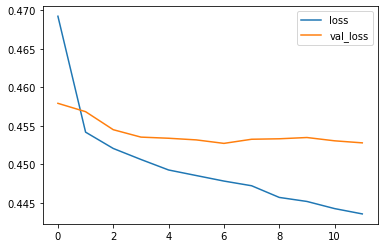

In [177]:
losses = pd.DataFrame(best_model.history.history)
losses[['loss', 'val_loss']].plot()

In [178]:
losses.head()

,loss,accuracy,val_loss,val_accuracy
0,0.469222,0.803658,0.457921,0.803748
1,0.454181,0.806063,0.456838,0.803832
2,0.452064,0.807325,0.454499,0.803608
3,0.450636,0.806940,0.453537,0.804337
4,0.449272,0.807878,0.453389,0.804366
